# Social Network Analysis: Bitcoin Alpha trust weighted signed network

In [ ]:
# Monta Google Drive (opzionale)
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Installazione librerie mancanti
! pip install networkx matplotlib pandas seaborn python-louvain ace_tools

# Importa le librerie
import os
import random
import numpy as np
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.patches as mpatches
from matplotlib import colormaps
import seaborn as sns
from community import community_louvain
from networkx.algorithms.community import greedy_modularity_communities, modularity

# 1. Creazione del Dataset

Il dataset è preso da: https://snap.stanford.edu/data/soc-sign-bitcoin-alpha.html

## Dataset degli archi

In [ ]:
# Definisci il percorso dei dati
data_dir = '/content/drive/MyDrive/SNA_Bitcoin/dataset/soc-sign-bitcoinalpha.csv/'

# Elenca tutti i file nella directory
all_files = os.listdir(data_dir)

# Filtro per selezionare i file con nomi basati su 'source, target, rating, time'
files_to_combine = [
    file for file in all_files
    if file.replace(',', '').replace('-', '').isdigit()  # Controlla che il nome sia numerico
]

# Estrai i dati dai nomi dei file
data = []
for file in files_to_combine:
    try:
        # Dividi il nome del file usando la virgola come separatore
        source, target, rating, time = file.split(',')
        data.append([int(source), int(target), int(rating), int(time)])
    except Exception as e:
        print(f"Errore durante l'elaborazione del file {file}: {e}")

# Crea un DataFrame dai dati estratti
all_edges = pd.DataFrame(data, columns=["source", "target", "rating", "time"])

# Aggiungi il tempo leggibile
all_edges['time_readable'] = pd.to_datetime(all_edges['time'], unit='s')

edges_csv_path = '/content/drive/MyDrive/SNA_Bitcoin/dataset/edges.csv'
all_edges.to_csv(edges_csv_path, index=False)

# Mostra un'anteprima
print(all_edges.head())
print(f"Totale righe (archi): {len(all_edges)}")

   source  target  rating        time       time_readable
0     979    2359       2  1369627200 2013-05-27 04:00:00
1    1038    1511       2  1342929600 2012-07-22 04:00:00
2    1036    7515     -10  1369713600 2013-05-28 04:00:00
3    1275     936       5  1309320000 2011-06-29 04:00:00
4    1622     913       1  1305604800 2011-05-17 04:00:00
Totale righe (archi): 24186


## Dataset dei nodi

In [ ]:
# Estrai i nodi univoci
nodes = pd.concat([all_edges['source'], all_edges['target']]).unique()

# Crea un DataFrame per i nodi
nodes_df = pd.DataFrame(nodes, columns=["node_id"])

# Salva il file dei nodi (opzionale)
nodes_csv_path = '/content/drive/MyDrive/SNA_Bitcoin/dataset/nodes.csv'
nodes_df.to_csv(nodes_csv_path, index=False)
print(nodes_df.head())
print(f"Totale nodi estratti: {len(nodes_df)}")

   node_id
0      979
1     1038
2     1036
3     1275
4     1622
Totale nodi estratti: 3783


# 2. Creazione del Grafo

Creazione del grafo diretto, pesato, a partire dal dataset degli archi

In [ ]:
# Percorso al file CSV
edges_csv_path = '/content/drive/MyDrive/SNA_Bitcoin/dataset/edges.csv'

# Leggi il file CSV
edges_df = pd.read_csv(edges_csv_path)

# Crea un grafo diretto
G = nx.DiGraph()

# Aggiunta degli archi
for _, row in edges_df.iterrows():
    G.add_edge(row['source'], row['target'], weight=row['rating'], time=row['time_readable'])

# Stampa alcune informazioni sul grafo
print(f"Numero di nodi: {G.number_of_nodes()}")
print(f"Numero di archi: {G.number_of_edges()}")

# Mostra i primi 5 archi con i loro attributi
for edge in list(G.edges(data=True))[:5]:
    print(edge)

Numero di nodi: 3783
Numero di archi: 24186
(979, 2359, {'weight': 2, 'time': '2013-05-27 04:00:00'})
(979, 1176, {'weight': 1, 'time': '2013-05-15 04:00:00'})
(979, 1954, {'weight': 1, 'time': '2013-05-08 04:00:00'})
(979, 7550, {'weight': -3, 'time': '2013-12-14 05:00:00'})
(979, 1528, {'weight': 1, 'time': '2013-09-07 04:00:00'})


## Grafo indiretto e sottografi

In [ ]:
# Trasforma il grafo in indiretto
G_undirected = G.to_undirected()

# --- Creazione dei sottografi ---
archi_positivi = [(u, v, d) for u, v, d in G.edges(data=True) if d['weight'] > 0]
archi_negativi = [(u, v, d) for u, v, d in G.edges(data=True) if d['weight'] < 0]

# Creazione dei sottografi diretti
G_positive = nx.DiGraph()  # Grafo diretto per valutazioni positive
G_positive.add_edges_from(archi_positivi)

G_negative = nx.DiGraph()  # Grafo diretto per valutazioni negative
G_negative.add_edges_from(archi_negativi)

# Creazione dei sottografi indiretti
G_positive_undirected = G_positive.to_undirected()  # Sottografo indiretto per valutazioni positive
G_negative_undirected = G_negative.to_undirected()  # Sottografo indiretto per valutazioni negative

# 3. Analisi Descrittiva

## 3.1 Visualizzazione del Grafo Completo

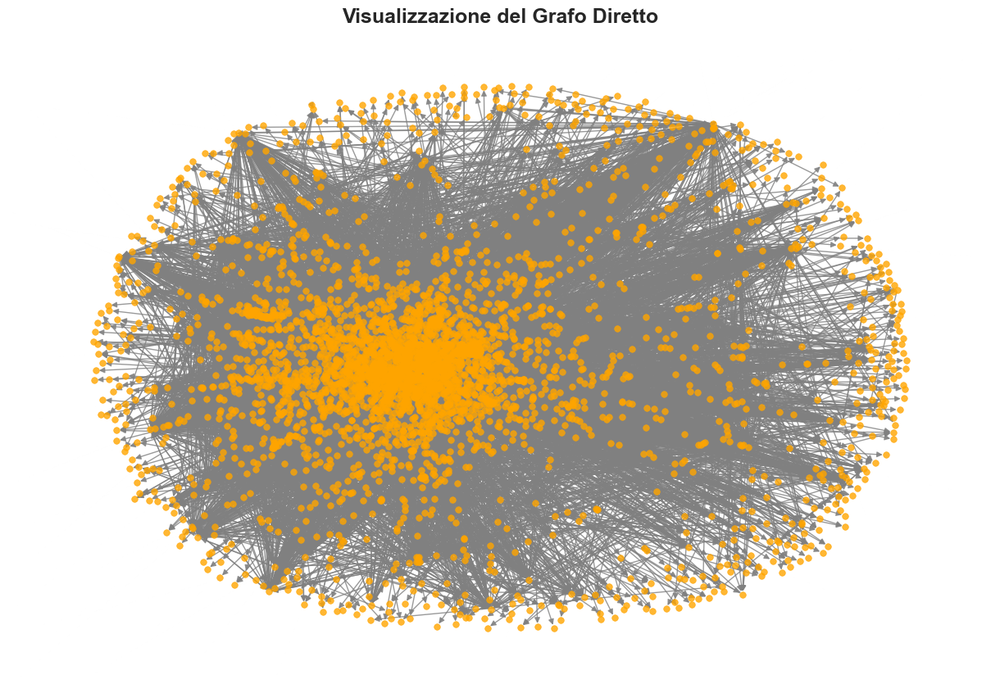

In [ ]:
# Configurazione della figura
plt.figure(figsize=(12, 8))

# Disegna i nodi
nx.draw(
    G,
    with_labels=False,  # Nessuna etichetta
    node_size=30,  # Aumenta la dimensione dei nodi
    node_color="orange",  # Colore dei nodi
    alpha=0.8,  # Aumenta la trasparenza per rendere meno caotico il plot
    edge_color="gray",  # Colore degli archi
    linewidths=0.5  # Contorno più visibile per i nodi
)

# Titolo
plt.title("Visualizzazione del Grafo Diretto", fontsize=18, fontweight="bold")

# Rimuove gli assi
plt.axis("off")

# Mostra il grafico
plt.show()

### Spring Layout

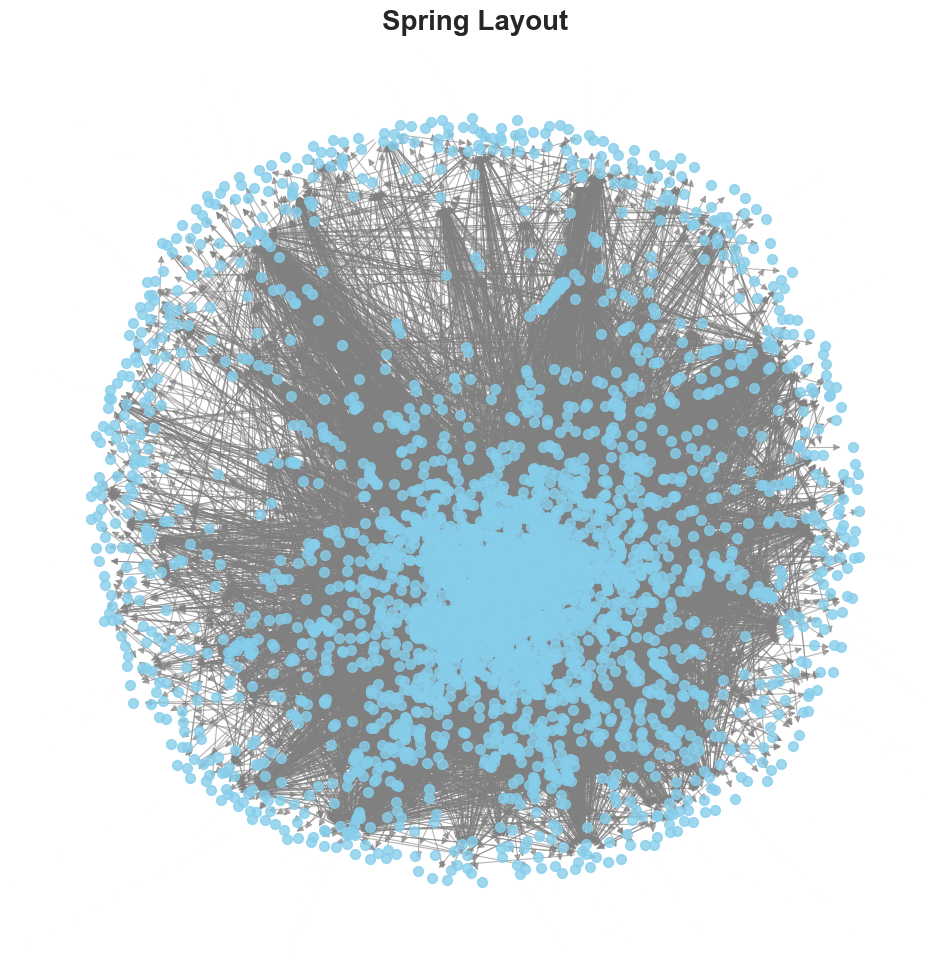

In [ ]:
# Calcola il layout Spring
pos_spring = nx.spring_layout(G, seed=42)  # Imposta un seed per risultati riproducibili

# Configurazione della figura
plt.figure(figsize=(12, 12))

# Disegna i nodi
nx.draw_networkx_nodes(
    G,
    pos=pos_spring,
    node_size=50,  # Aumenta la dimensione dei nodi
    node_color="skyblue",  # Colore dei nodi
    alpha=0.8  # Trasparenza per ridurre il caos visivo
)

# Disegna gli archi
nx.draw_networkx_edges(
    G,
    pos=pos_spring,
    edge_color="gray",  # Colore degli archi
    alpha=0.6,  # Trasparenza degli archi
    width=0.8  # Spessore degli archi
)

# Aggiungi un titolo
plt.title("Spring Layout", fontsize=20, fontweight="bold")

# Rimuove gli assi
plt.axis("off")

# Mostra il grafico
plt.show()

### Kamada-Kawai layout

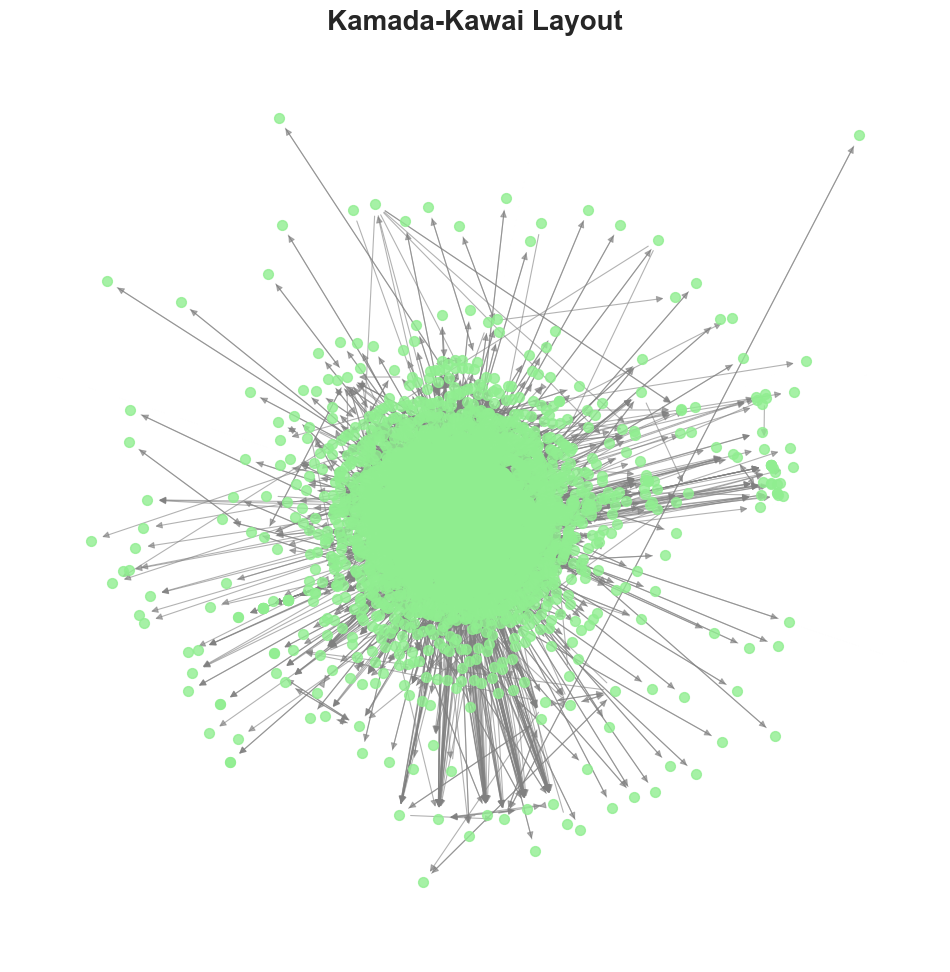

In [ ]:
# Creare una copia del grafo con pesi positivi solo per Kamada-Kawai
G_positive_weights = G.copy()
for u, v, d in G_positive_weights.edges(data=True):
    d['weight'] = abs(d['weight'])  # Converte i pesi in valori assoluti

# Calcola il layout Kamada-Kawai con pesi positivi
pos_kamada_kawai = nx.kamada_kawai_layout(G_positive_weights)

plt.figure(figsize=(12, 12))

# Disegna i nodi
nx.draw_networkx_nodes(
    G_positive_weights,
    pos=pos_kamada_kawai,
    node_size=50,  # Dimensione nodi aumentata
    node_color="lightgreen",  # Colore nodi
    alpha=0.8  # Trasparenza per maggiore chiarezza
)

# Disegna gli archi
nx.draw_networkx_edges(
    G_positive_weights,
    pos=pos_kamada_kawai,
    edge_color="gray",  # Colore archi
    alpha=0.6,  # Trasparenza per ridurre il caos visivo
    width=0.8  # Spessore archi
)

plt.title("Kamada-Kawai Layout", fontsize=20, fontweight="bold")
plt.axis("off")
plt.show()

## 3.2 Metriche per grafo diretto ed indiretto

1. **Numero di nodi**
2. **Numero di archi**
3. **Densità**: La densità è una misura di quanto il grafo è connesso in rapporto al numero massimo di possibili connessioni.
4. **Diametro**: Il diametro rappresenta la distanza massima tra due nodi nel grafo.
5. **Raggio**: Il raggio è la minima distanza alla quale un nodo può essere trovato da tutti gli altri nodi raggiungibili, e rappresenta il nodo “più centrale” della rete.
6. **Clustering medio**: Il clustering medio è più alto nel sottografo positivo diretto, indicando che i nodi nelle valutazioni positive tendono a formare gruppi più stretti (triangoli).
7. **Numero componenti connesse**: Il numero di componenti connesse per i sottografi diretti è più alto rispetto alle versioni indirette.

In [ ]:
# Funzione per calcolare le metriche generali per un grafo
def calculate_metrics(graph, is_directed=True):

    if len(graph) == 0:  # Se il grafo è vuoto
        return {
        "Numero nodi": 0,
        "Numero archi": 0,
        "Nodi isolati": len(graph),
        "Densità": 0,
        "Diametro": 0,
        "Raggio": 0,
        "Clustering medio": 0,
        "Numero componenti connesse": 0
    }

    # Densità
    density = nx.density(graph)

    # Calcolo del diametro e raggio su componenti connesse
    if is_directed:
        components = list(nx.strongly_connected_components(graph))
    else:
        components = list(nx.connected_components(graph))

    diameters = []
    radii = []
    for component in components:
        subgraph = graph.subgraph(component)
        if nx.is_connected(subgraph.to_undirected()):  # Controlla connessione (anche per sottografi)
            diameters.append(nx.diameter(subgraph))
            radii.append(nx.radius(subgraph))

    # Diametro e raggio globali (sulle componenti connesse più grandi)
    diameter = max(diameters) if diameters else "Non calcolabile"
    radius = min(radii) if radii else "Non calcolabile"

    # Clustering medio
    avg_clustering = (
        nx.average_clustering(graph, weight="weight")
        if not is_directed
        else nx.average_clustering(graph)
    )

    # Numero di componenti connesse
    num_components = len(components)

    # Numero di nodi isolati
    isolated_nodes = len([node for node, degree in dict(graph.degree()).items() if degree == 0])

    # Numero di nodi e archi
    num_nodes = graph.number_of_nodes()
    num_edges = graph.number_of_edges()

    return {
        "Numero nodi": num_nodes,
        "Numero archi": num_edges,
        "Nodi isolati": isolated_nodes,
        "Densità": density,
        "Diametro": diameter,
        "Raggio": radius,
        "Clustering medio": avg_clustering,
        "Numero componenti connesse": num_components
    }

In [ ]:
# Calcola le metriche per il grafo diretto
metrics_directed = calculate_metrics(G, is_directed=True)

# Calcola le metriche per il grafo indiretto
metrics_undirected = calculate_metrics(G_undirected, is_directed=False)

# Confronto delle metriche
comparison_df = pd.DataFrame({
    "Metriche": ["Numero nodi","Numero archi","Nodi isolati","Densità", "Diametro", "Raggio", "Clustering medio", "Numero componenti connesse"],
    "Grafo Diretto": [
        metrics_directed["Numero nodi"],
        metrics_directed["Numero archi"],
        metrics_directed["Nodi isolati"],
        metrics_directed["Densità"],
        metrics_directed["Diametro"],
        metrics_directed["Raggio"],
        metrics_directed["Clustering medio"],
        metrics_directed["Numero componenti connesse"]
    ],
    "Grafo Indiretto": [
        metrics_undirected["Numero nodi"],
        metrics_undirected["Numero archi"],
        metrics_undirected["Nodi isolati"],
        metrics_undirected["Densità"],
        metrics_undirected["Diametro"],
        metrics_undirected["Raggio"],
        metrics_undirected["Clustering medio"],
        metrics_undirected["Numero componenti connesse"]
    ]
})

# Visualizza i risultati
comparison_df

,Metriche,Grafo Diretto,Grafo Indiretto
0,Numero nodi,3783.000000,3783.000000
1,Numero archi,24186.000000,14124.000000
2,Nodi isolati,0.000000,0.000000
3,Densità,0.001690,0.001974
4,Diametro,10.000000,10.000000
5,Raggio,0.000000,1.000000
6,Clustering medio,0.158345,0.030084
7,Numero componenti connesse,540.000000,5.000000


#### Analisi dei risultati
**Numero di archi**
- La riduzione degli archi nell’indiretto è normale, perché un arco non viene più duplicato in direzioni opposte (se A→B e B→A, nell’indiretto diventa un singolo link A—B).

**Densità**
- La bassa densità in entrambi i casi indica che solo una piccola frazione delle possibili valutazioni tra utenti viene effettivamente effettuata. Questo significa che gli utenti valutano solo un sottoinsieme ristretto degli altri utenti.
- La densità leggermente più alta nel grafo indiretto suggerisce che alcune valutazioni unidirezionali si combinano in valutazioni bidirezionali quando si ignora la direzione.
- **HP**: Gli utenti si valutano selettivamente e non sono coinvolti in valutazioni reciproche con tutti gli altri.

**Diametro**
- La coincidenza del diametro diretto e indiretto indica che le relazioni indirette (valutazioni reciproche) non modificano significativamente la distanza massima.
- **HP**: Anche quando le valutazioni diventano reciproche, la distanza massima tra gli utenti rimane relativamente invariata.

**Raggio**
- Un raggio di 0 nel grafo diretto indica che esistono utenti isolati rispetto alla direzione, ovvero ci potrebbero essere utenti che ne valutano altri, ma che non sono a loro volta valutati.
- Nel grafo indiretto, il raggio di 1 indica che, con l’ignorare la direzione, esistono nodi centrali che sono connessi a tutti gli altri con un solo passo, il che suggerisce che questi nodi possono fungere da ponte tra utenti che altrimenti non sarebbero connessi.

**Clustering medio**
- Il clustering medio più alto nel grafo diretto indica una maggiore tendenza alla formazione di gruppi chiusi diretti (A valuta B, B valuta C, C valuta A).
- Il valore più basso nel grafo indiretto indica che, ignorare la direzione di valutazione riduce la struttura locale delle relazioni. Ciò accade prchè viene ignorata la reciprocità delle connessioni.

**Numero di componenti connesse**
- La presenza di 540 componenti fortemente connesse nel grafo diretto riflette la frammentazione delle relazioni reciproche. Esistono molti piccoli gruppi di utenti che si valutano a vicenda, senza connessioni dirette con altri gruppi, creando frammenti di relazioni unidirezionali.
- Ignorando la direzione delle relazioni, la rete diventa notevolmente più connessa.

**Interpretazione sociale**
- La rete diretta è frammentata in molte SCC, il che significa che solo piccoli gruppi di utenti hanno reciprocità di valutazioni tali da formare circuiti chiusi di fiducia/sfiducia.
- Nella versione indiretta, quasi tutti finiscono in grandi componenti connesse (solo 5 totali): ciò indica che, se ignoriamo la direzione, la maggior parte degli utenti è raggiungibile tramite qualche catena di relazioni.
- Il diametro di 10 suggerisce che il “mondo” di scambi non è piccolissimo, ma nemmeno sterminato in termini di path (si arriva a un’altra persona massimo in 10 passaggi).

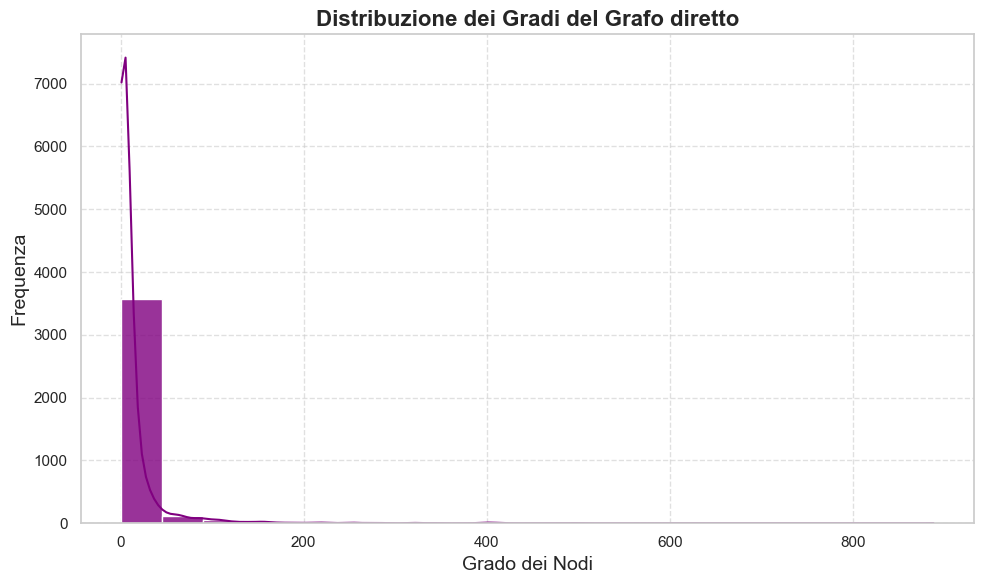

In [ ]:
# Distribuzione dei gradi
degree_sequence = sorted([d for n, d in G.degree()], reverse=True)

# Visualizzazione migliorata della distribuzione dei gradi
plt.figure(figsize=(10, 6))
sns.histplot(
    degree_sequence,
    bins=20,
    kde=True,  # Linea di densità per la distribuzione
    color="purple",
    alpha=0.8
)
plt.title("Distribuzione dei Gradi del Grafo diretto", fontsize=16, fontweight="bold")
plt.xlabel("Grado dei Nodi", fontsize=14)
plt.ylabel("Frequenza", fontsize=14)
plt.grid(visible=True, linestyle='--', alpha=0.6)
plt.tight_layout()  # Migliora il layout del grafico
plt.show()

### Plot delle componenti fortemente connesse (Grafo Diretto)

Numero di componenti fortemente connesse: 540
Dimensione della componente fortemente connessa più grande: 3235


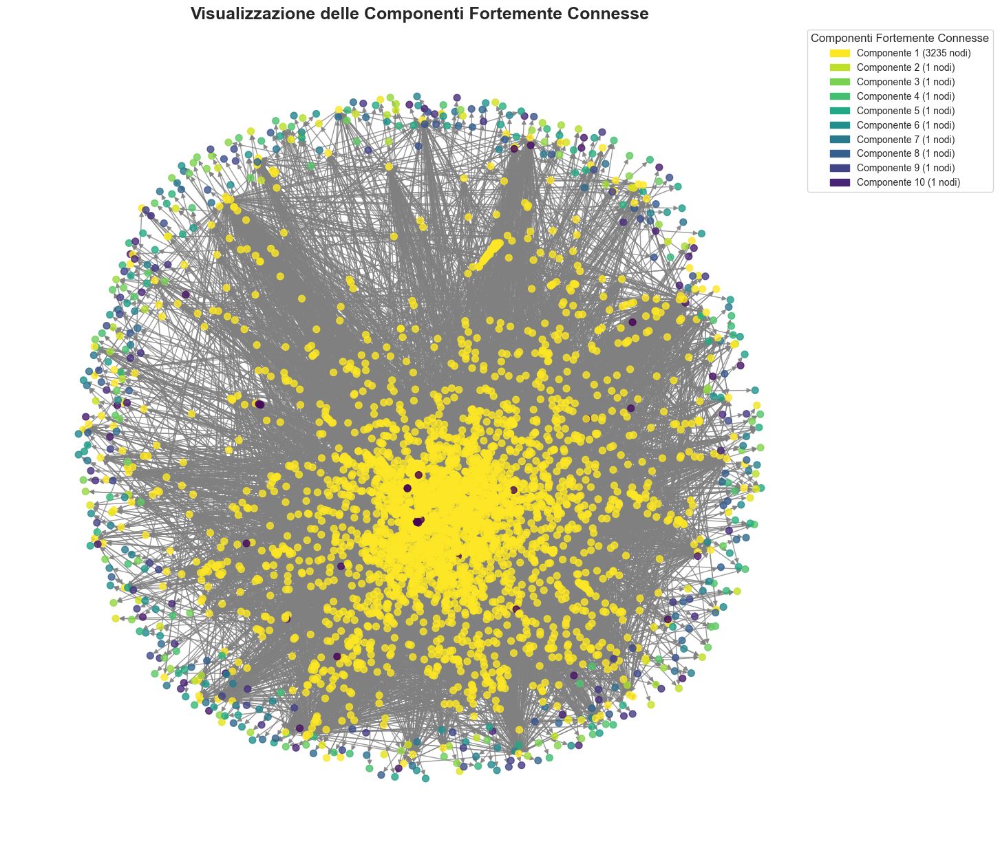

In [ ]:
# Identificare le componenti fortemente connesse
scc = list(nx.strongly_connected_components(G))
print(f"Numero di componenti fortemente connesse: {len(scc)}")

# Dettagli della componente fortemente connessa più grande
largest_scc = max(scc, key=len)
print(f"Dimensione della componente fortemente connessa più grande: {len(largest_scc)}")

# Ordinare le SCC per dimensione (decrescente)
scc = sorted(scc, key=len, reverse=True)

# Utilizzare il nuovo metodo per il colormap
cmap = colormaps.get_cmap("viridis_r")  # Colormap invertita

# Creare una mappa nodo-colore
node_color_map = {}
for idx, component in enumerate(scc):
    for node in component:
        node_color_map[node] = cmap(idx / len(scc))  # Normalizza l'indice

# Applicare i colori ai nodi
node_colors = [node_color_map[node] if node in node_color_map else "gray" for node in G.nodes()]

# Configurazione del layout
pos = nx.spring_layout(G, seed=42)  # Usa un seed per la riproducibilità

# Visualizzazione del grafo
plt.figure(figsize=(12, 12))
nx.draw(
    G,
    pos,
    with_labels=False,
    node_color=node_colors,  # Colori delle componenti
    node_size=50,
    edge_color="gray",
    alpha=0.8
)

# Campiona 10 componenti distribuite uniformemente per la legenda
sampled_components = [scc[i] for i in range(0, len(scc), max(1, len(scc) // 10))][:10]

# Creare la legenda
legend_patches = []
for idx, component in enumerate(sampled_components):
    legend_patches.append(
        mpatches.Patch(
            color=cmap(idx / len(sampled_components)),
            label=f"Componente {idx + 1} ({len(component)} nodi)"
        )
    )

# Aggiungere la legenda al grafico
plt.legend(
    handles=legend_patches,
    title="Componenti Fortemente Connesse",
    loc="upper right",
    fontsize=10,
    title_fontsize=12,
    bbox_to_anchor=(1.2, 1)  # Posizionare la legenda fuori dal grafico
)

plt.title("Visualizzazione delle Componenti Fortemente Connesse", fontsize=18, fontweight="bold")
plt.axis("off")
plt.subplots_adjust(left=0.05, right=0.85, top=0.95, bottom=0.05)
plt.show()

### Plot delle componenti connesse (Grafo Indiretto)

Numero di componenti connesse: 5
Dimensione della componente più grande: 3775


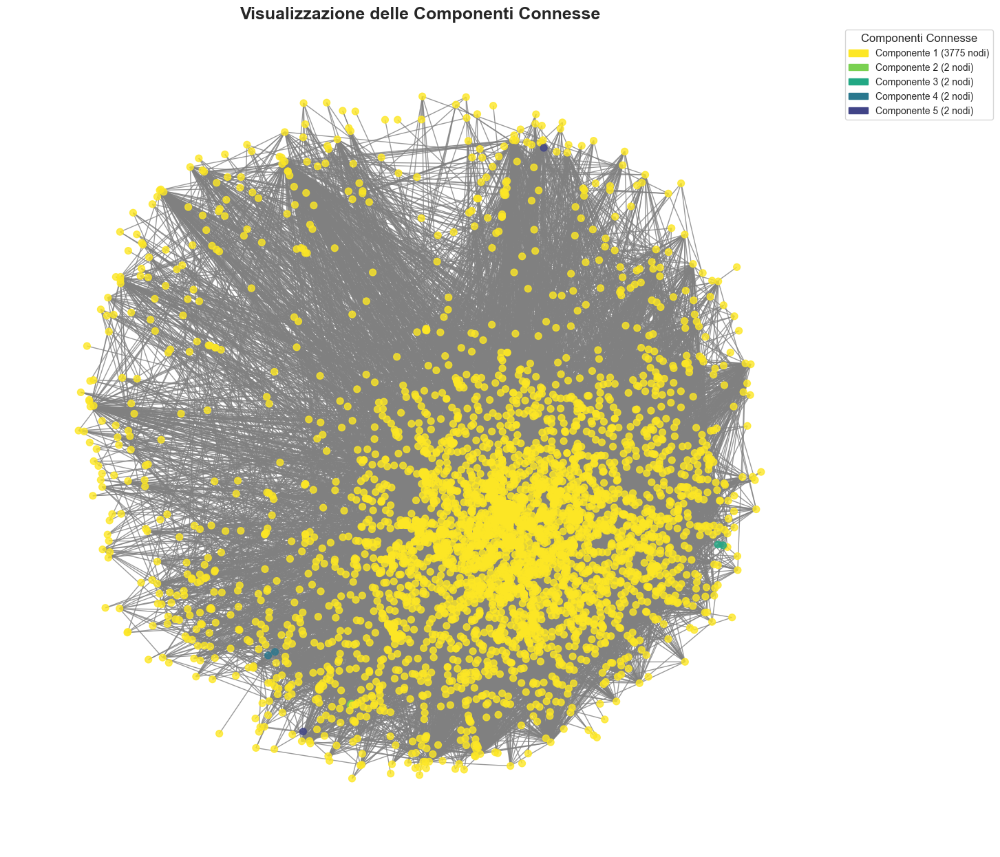

In [ ]:
# Identificare le componenti connesse
componenti_connesse = list(nx.connected_components(G_undirected))
print(f"Numero di componenti connesse: {len(componenti_connesse)}")

# Dettagli della componente più grande
largest_component = max(componenti_connesse, key=len)
print(f"Dimensione della componente più grande: {len(largest_component)}")

# Ordinare le componenti connesse per dimensione (decrescente)
componenti_connesse = sorted(componenti_connesse, key=len, reverse=True)

# Generare una mappa di colori basata sulle dimensioni delle componenti
cmap = colormaps["viridis_r"]

# Creare una mappa nodo-colore
node_color_map = {}
for idx, component in enumerate(componenti_connesse):
    for node in component:
        node_color_map[node] = cmap(idx / len(componenti_connesse))  # Normalizza l'indice

# Applicare i colori ai nodi
node_colors = [node_color_map[node] for node in G_undirected.nodes()]

# Configurazione del layout
pos = nx.spring_layout(G_undirected, seed=42)  # Usa un seed per la riproducibilità

# Visualizzazione del grafo
plt.figure(figsize=(12, 12))
nx.draw(
    G_undirected,
    pos,
    with_labels=False,
    node_color=node_colors,  # Colori delle componenti
    node_size=50,
    edge_color="gray",
    alpha=0.8
)

# Creare la legenda
legend_patches = []
for idx, component in enumerate(componenti_connesse):
    legend_patches.append(
        mpatches.Patch(
            color=cmap(idx / len(componenti_connesse)),
            label=f"Componente {idx + 1} ({len(component)} nodi)"
        )
    )

# Aggiungere la legenda al grafico
plt.legend(
    handles=legend_patches,
    title="Componenti Connesse",
    loc="upper right",
    fontsize=10,
    title_fontsize=12,
    bbox_to_anchor=(1.2, 1)  # Posizionare la legenda fuori dal grafico
)

plt.title("Visualizzazione delle Componenti Connesse", fontsize=18, fontweight="bold")
plt.axis("off")
plt.subplots_adjust(left=0.05, right=0.85, top=0.95, bottom=0.05)
plt.show()

## 3.3 Metriche sottografo positivo e negativo

Separiamo il grafo in:
- **Sottografo positivo** (G_positive): Contiene solo archi con peso positivo (relazioni fidate).
- **Sottografo negativo** (G_negative): Contiene solo archi con peso negativo (relazioni non fidate).

In [ ]:
# Calcola le metriche per il sottografo positivo diretto
positive_metrics_directed = calculate_metrics(G_positive, is_directed=True)
# Calcola le metriche per il sottografo positivo indiretto
positive_metrics_undirected = calculate_metrics(G_positive_undirected, is_directed=False)

# Calcola le metriche per il sottografo negativo diretto
negative_metrics_directed = calculate_metrics(G_negative, is_directed=True)
# Calcola le metriche per il sottografo negativo indiretto
negative_metrics_undirected = calculate_metrics(G_negative_undirected, is_directed=False)

# Confronto delle metriche tra grafi diretti e indiretti per i sottografi positivi e negativi
comparison_df = pd.DataFrame({
    "Metriche": ["Numero nodi","Numero archi","Nodi isolati","Densità", "Diametro", "Raggio", "Clustering medio", "Numero componenti connesse"],
    "Sottografo positivo diretto": [
        positive_metrics_directed["Numero nodi"],
        positive_metrics_directed["Numero archi"],
        positive_metrics_directed["Nodi isolati"],
        positive_metrics_directed["Densità"],
        positive_metrics_directed["Diametro"],
        positive_metrics_directed["Raggio"],
        positive_metrics_directed["Clustering medio"],
        positive_metrics_directed["Numero componenti connesse"]
    ],
    "Sottografo positivo indiretto": [
        positive_metrics_undirected["Numero nodi"],
        positive_metrics_undirected["Numero archi"],
        positive_metrics_undirected["Nodi isolati"],
        positive_metrics_undirected["Densità"],
        positive_metrics_undirected["Diametro"],
        positive_metrics_undirected["Raggio"],
        positive_metrics_undirected["Clustering medio"],
        positive_metrics_undirected["Numero componenti connesse"]
    ],
    "Sottografo negativo diretto": [
        negative_metrics_directed["Numero nodi"],
        negative_metrics_directed["Numero archi"],
        negative_metrics_directed["Nodi isolati"],
        negative_metrics_directed["Densità"],
        negative_metrics_directed["Diametro"],
        negative_metrics_directed["Raggio"],
        negative_metrics_directed["Clustering medio"],
        negative_metrics_directed["Numero componenti connesse"]
    ],
    "Sottografo negativo indiretto": [
        negative_metrics_undirected["Numero nodi"],
        negative_metrics_undirected["Numero archi"],
        negative_metrics_undirected["Nodi isolati"],
        negative_metrics_undirected["Densità"],
        negative_metrics_undirected["Diametro"],
        negative_metrics_undirected["Raggio"],
        negative_metrics_undirected["Clustering medio"],
        negative_metrics_undirected["Numero componenti connesse"]
    ]
})

# Visualizza i risultati
comparison_df

,Metriche,Sottografo positivo diretto,Sottografo positivo indiretto,Sottografo negativo diretto,Sottografo negativo indiretto
0,Numero nodi,3683.00000,3683.000000,848.000000,848.000000
1,Numero archi,22650.00000,12972.000000,1536.000000,1400.000000
2,Nodi isolati,0.00000,0.000000,0.000000,0.000000
3,Densità,0.00167,0.001913,0.002139,0.003898
4,Diametro,10.00000,10.000000,9.000000,11.000000
5,Raggio,0.00000,1.000000,0.000000,1.000000
6,Clustering medio,0.14874,0.036681,0.021892,0.242255
7,Numero componenti connesse,477.00000,7.000000,714.000000,43.000000


### Analisi dei risultati
**Numero di archi**
- Il sottografo positivo è di gran lunga più ampio (22.650 archi diretti) rispetto al negativo (1.536 diretti). Questo significa che la maggior parte delle interazioni è effettivamente “positiva”, segnalando fiducia o apprezzamento tra gli utenti.

**Densità**
-  Nei sottografi negativi gli archi risultano più “densi” se rapportati al minor numero di nodi nel sottografo negativo. Questo potrebbe far intendere che la “sfiducia” (negativa) è concentrata su meno utenti, ma questi tendono a scambiarsi valutazioni critiche con più frequenza.
    - La densità più alta nel sottografo indiretto suggerisce che le valutazioni negative (quando considerate bidirezionali) sono concentrate su meno utenti.
- Nei sottografi positivi, sebbene gli archi siano numerosi, le valutazioni si distribuiscono su un gran numero di utenti, mantenendo la densità bassa
    - L’incremento nella versione indiretta indica che le connessioni positive si espandono quando si ignora la direzione.
- **HP**: Le valutazioni positive potrebbero essere più costose o più selettive, mentre le valutazioni negative potrebbero riflettere una maggior frequenza di conflitto o critiche, con la rete che diventa quindi più densa.

**Diametro**
- Nei sottografi positivi riamne invariato, suggerendo una struttura di fiducia “a catene lunghe”, ma non più lunghe di 10 step.
- Nel sottografo negativo diretto scende a 9, mentre nell’indiretto sale addirittura a 11. È plausibile che, ignorando la direzione, si formi qualche percorso più lungo fra utenti negativi, mentre nella direzione effettiva (chi critica chi) i percorsi sono più brevi e “circoscritti”.
- **HP**: Le valutazioni negative dirette (ad esempio, utenti che danno feedback critici a persone specifiche) tendono a rimanere più localizzate e concentrate, mentre le valutazioni positive, pur non essendo molto dense, tendono ad essere meno collegate direttamente tra loro.

**Raggio**
- Valore 0 nei diretti (positivo e negativo) denota che in ogni sottografo diretto ci sono componenti in cui non tutti i nodi sono a “distanza raggiungibile” l’uno dall’altro. Questo potrebbe ignificare che esistono utenti concentrati nella rete, che reciprocano le valutazioni, con un’influenza centrale sulle valutazioni.
- Nel grafo indiretto, il raggio aumenta a 1, suggerendo che non ci sono più nodi che sono perfettamente centrali.

**Clustering medio**
- Nel sottografo positivo diretto, un clustering più alto segnala numerose triadi di fiducia reciproca (A→B, B→C, C→A). Questo potrebbe suggerire che i gruppi di utenti che si valutano positivamente tendono a essere più interconnessi, formando comunità.
- Quando si considera il grafo indiretto, il clustering medio nel sottografo negativo aumenta drasticamente, indicando che le connessioni negative reciproche tra i nodi tendono a formare comunità più dense.
- **HP**: Le relazioni positive tendono a formare gruppi più coesi in cui utenti con opinioni simili tendono a rafforzare il legame, mentre le relazioni negative reciproche, probabilmente portano a una maggiore polarizzazione.

**Numero di componenti connesse**
- Entrambi i sottografi diretti (positivo e negativo) sono più frammentati rispetto alle loro controparti indirette, ma quello negativo lo è ancora di più (714 SCC contro 477 nel positivo).
- **HP**: Le valutazioni positive tendono a essere più reciprocate e coese, riducendo il numero di componenti isolate.

In [ ]:
# Calcola la percentuale di archi positivi e negativi
totale_archi = len(G.edges)
percentuale_positivi = (len(archi_positivi) / totale_archi) * 100
percentuale_negativi = (len(archi_negativi) / totale_archi) * 100

print(f"Percentuale di archi positivi: {percentuale_positivi:.2f}%")
print(f"Percentuale di archi negativi: {percentuale_negativi:.2f}%")

Percentuale di archi positivi: 93.65%
Percentuale di archi negativi: 6.35%


### Analisi temporale delle metriche

Analizziamo l'andamento nel tempo delle metriche del grafo **totale**, del sottografo con pesi **positivi** e del sottografo con pesi **negativi**.

In [ ]:
# Assicurati che la colonna 'time_readable' sia in formato datetime
edges_df['time_readable'] = pd.to_datetime(edges_df['time_readable'], errors='coerce')

# Estrai l'anno dalla colonna 'time_readable' e crea una nuova colonna 'year'
edges_df['year'] = edges_df['time_readable'].dt.year

# Funzione per dividere gli archi per anno (accumulando gli archi di tutti gli anni precedenti)
def get_graph_by_year_cumulative(edges_df, year, type_='total'):
    # Filtra gli archi fino all'anno specificato
    edges_year = edges_df[edges_df['year'] <= year]

    if type_ == 'positive':
        edges_year = edges_year[edges_year['rating'] > 0]
    elif type_ == 'negative':
        edges_year = edges_year[edges_year['rating'] < 0]

    # Crea il grafo cumulativo
    G_year = nx.DiGraph()
    for _, row in edges_year.iterrows():
        G_year.add_edge(row['source'], row['target'], rating=row['rating'], time=row['time_readable'])

    return G_year

# Funzione per calcolare e aggiungere le metriche cumulative per ogni anno
def calculate_yearly_metrics_cumulative(years, edges_df):
    metrics_yearly_all = []
    metrics_yearly_positive = []
    metrics_yearly_negative = []

    for year in years:
        # Creazione dei sottografi cumulativi per il grafo totale, positivo e negativo
        G_year = get_graph_by_year_cumulative(edges_df, year, type_="total")
        G_positive_year = get_graph_by_year_cumulative(edges_df, year, type_='positive')
        G_negative_year = get_graph_by_year_cumulative(edges_df, year, type_='negative')

        # Calcolo delle metriche per ogni sottografo
        total_metrics = calculate_metrics(G_year, is_directed=True)
        positive_metrics = calculate_metrics(G_positive_year, is_directed=True)
        negative_metrics = calculate_metrics(G_negative_year, is_directed=True)

        # Aggiungi i risultati per questo anno
        metrics_yearly_all.append({"Anno": year, **total_metrics})
        metrics_yearly_positive.append({"Anno": year, **positive_metrics})
        metrics_yearly_negative.append({"Anno": year, **negative_metrics})

    return metrics_yearly_all, metrics_yearly_positive, metrics_yearly_negative

# Estrazione degli anni unici
years = edges_df['year'].unique()

# Calcolo delle metriche cumulative annuali
metrics_yearly_all, metrics_yearly_positive, metrics_yearly_negative = calculate_yearly_metrics_cumulative(years, edges_df)

# Creazione dei DataFrame
metrics_df_all = pd.DataFrame(metrics_yearly_all)
metrics_df_positive = pd.DataFrame(metrics_yearly_positive)
metrics_df_negative = pd.DataFrame(metrics_yearly_negative)

# Ordinare i DataFrame per l'anno
metrics_df_all_sorted = metrics_df_all.sort_values(by="Anno", ascending=True)
metrics_df_positive_sorted = metrics_df_positive.sort_values(by="Anno", ascending=True)
metrics_df_negative_sorted = metrics_df_negative.sort_values(by="Anno", ascending=True)

# Aggiungere una colonna per distinguere i sottografi
metrics_df_all_sorted['Sottografo'] = 'Totale'
metrics_df_positive_sorted['Sottografo'] = 'Positivo'
metrics_df_negative_sorted['Sottografo'] = 'Negativo'

# Concatenare i DataFrame
metrics_df_combined = pd.concat([metrics_df_all_sorted, metrics_df_positive_sorted, metrics_df_negative_sorted], axis=0)

### Visualizzazione delle metriche nel tempo

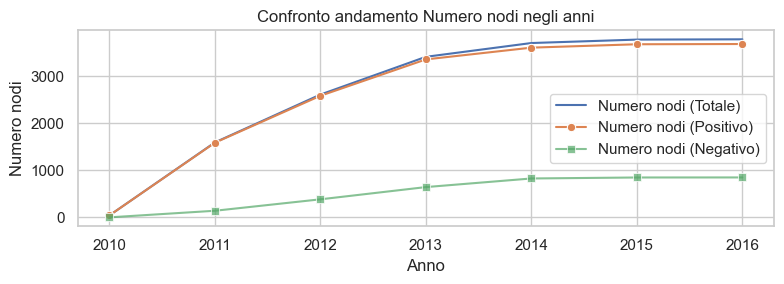

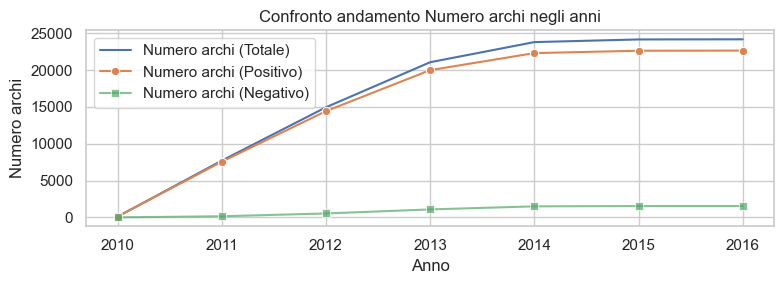

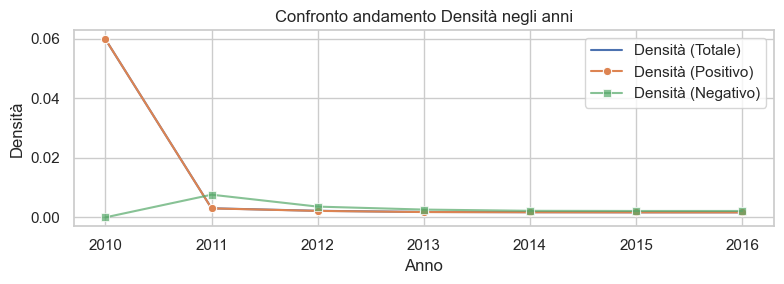

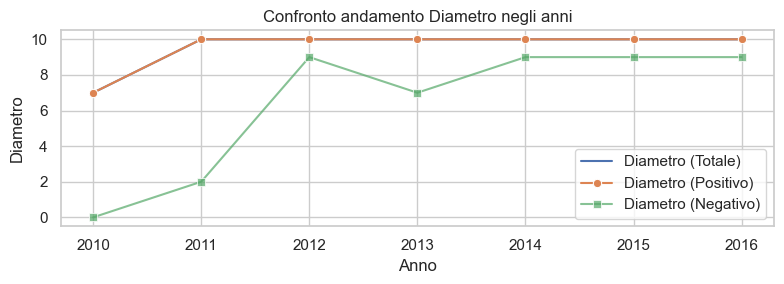

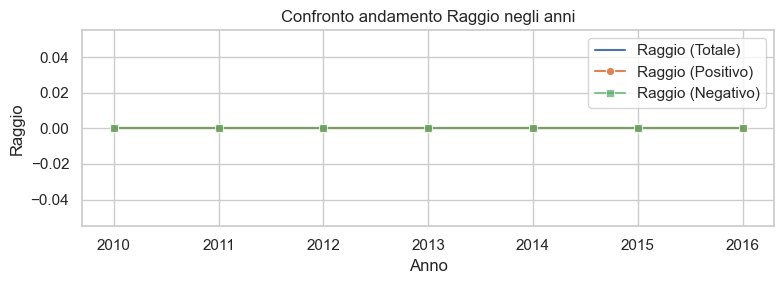

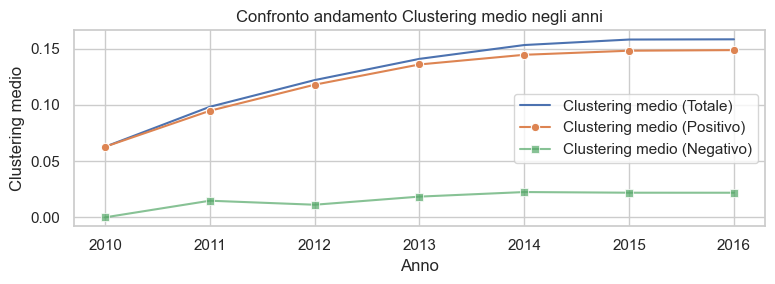

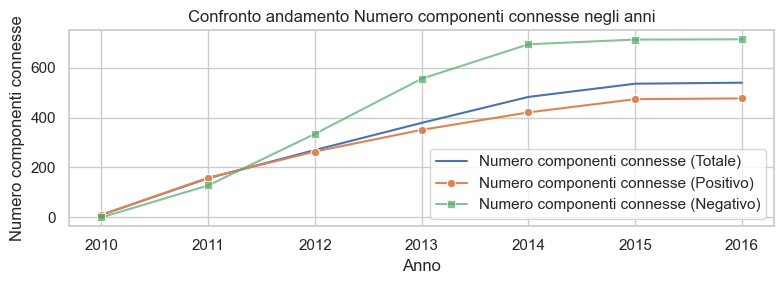

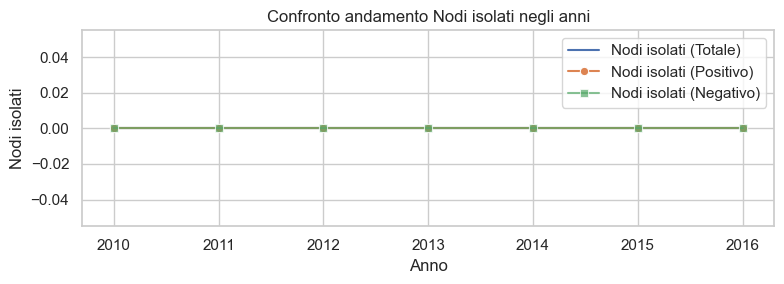

,Anno,Numero nodi,Numero archi,Nodi isolati,Densità,Diametro,Raggio,Clustering medio,Numero componenti connesse,Sottografo
6,2010,41,98,0,0.059756,7,0,0.062760,10,Totale
2,2011,1592,7701,0,0.003040,10,0,0.098318,157,Totale
1,2012,2609,14951,0,0.002197,10,0,0.122077,270,Totale
0,2013,3411,21072,0,0.001812,10,0,0.140954,379,Totale
3,2014,3704,23807,0,0.001736,10,0,0.153260,483,Totale
4,2015,3777,24169,0,0.001695,10,0,0.158141,536,Totale
5,2016,3783,24186,0,0.001690,10,0,0.158345,540,Totale
6,2010,41,98,0,0.059756,7,0,0.062760,10,Positivo
2,2011,1586,7553,0,0.003005,10,0,0.094776,159,Positivo
1,2012,2583,14424,0,0.002163,10,0,0.117977,264,Positivo


In [ ]:
# Lista delle metriche da tracciare
metrics = [
    "Numero nodi", "Numero archi", "Densità", "Diametro",
    "Raggio", "Clustering medio", "Numero componenti connesse", "Nodi isolati"
]

# Creazione dei grafici per ogni metrica per entrambi i sottografi
for metric in metrics:
    # Creazione del grafico per entrambi i sottografi (positivo e negativo)
    plt.figure(figsize=(8, 3))

    # Linea per il sottografo positivo
    sns.lineplot(data=metrics_df_all_sorted, x="Anno", y=metric, label=f"{metric} (Totale)", markers=["o", "o"])

    # Linea per il sottografo positivo
    sns.lineplot(data=metrics_df_positive_sorted, x="Anno", y=metric, label=f"{metric} (Positivo)", marker='o')

    # Linea per il sottografo negativo
    sns.lineplot(data=metrics_df_negative_sorted, x="Anno", y=metric, label=f"{metric} (Negativo)", marker='s', alpha=0.7)

    # Impostazioni del grafico
    plt.title(f"Confronto andamento {metric} negli anni")
    plt.xlabel("Anno")
    plt.ylabel(f"{metric}")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()

    # Mostra il grafico
    plt.show()

# Visualizza i dataframes ordinati
metrics_df_combined

#### Analisi dei risutlati
**Numero di nodi ed archi**
- Crescono costantemente dal 2010 al 2016 sia nel grafo totale sia, separatamente, nei sottografi positivo e negativo. Ciò suggerisce che la piattaforma abbia attirato utenti nuovi (e quindi nuove interazioni) in modo continuo, con un ritmo più intenso nei primi anni e un assestamento negli anni successivi.
  - Il sottografo positivo raggiunge quasi gli stessi valori del totale, segno che la maggioranza degli utenti ha espresso o ricevuto almeno una valutazione positiva.

**Densità della rete**
- Nel 2010 si osservano picchi di densità (specialmente nel sottografo positivo), dovuti al fatto che pochissimi utenti iniziali si “valutano” a vicenda, creando un alto rapporto fra archi e nodi. Già dal 2011 la densità crolla e rimane bassa negli anni successivi, sia nel totale sia nei sottografi.
  - Con il crescere dei nodi la rete si “diluisce”. Le valutazioni negative rimangono un fenomeno di nicchia, ma costante: chi si scontra o critica, spesso lo fa in modo selettivo.

**Diametro della rete**
- Il grafo totale e il sottografo positivo mostrano un diametro intorno a 9-10 che non subisce grandi variazioni. Il sottografo negativo, pur essendo più piccolo, ha un diametro che oscilla di più.
  - Nonostante l’aumento di utenti, la “distanza massima” fra due persone che interagiscono rimane piuttosto contenuta. C’è un “effetto mondo piccolo” che si stabilizza presto. Nel sottografo negativo, i periodi in cui il diametro cala potrebbero indicare che alcuni utenti hanno concentrato intorno a sé le critiche.

**Raggio della rete**
- Nei grafi diretti, un raggio = 0 indica che non esiste un singolo nodo da cui tutti gli altri siano raggiungibili con un numero finito di passi (o esistono componenti in cui la massima eccentricità è infinita).
D’altro canto, potrebbe anche segnalare che esiste almeno un componente (per lo più) unidirezionale, dove la nozione di distanza si “rompe”.

**Clustering medio**
- Dal 2010 al 2016 il clustering (la tendenza a formare triadi chiuse) sale, soprattutto nel grafo totale e in quello positivo. Nel negativo, il clustering è sempre più basso, ma anch’esso aumenta gradualmente.
- Crescendo la rete, si sviluppano “sottogruppi” di utenti che interagiscono in modo reciproco, specialmente sul versante della fiducia (positivi).
Nel negativo, la formazione di triadi o piccoli circuiti (A critica B, B critica C, C critica A) è meno frequente, ma anche lì, col tempo, si consolidano gruppi di utenti che si criticano vicendevolmente.

**Numero componenti connesse**
- Aumenta per tutti i grafi, ma il sottografo negativo presenta sempre il maggior numero di componenti.
  - Nonostante la crescita della rete, persistono sub-gruppi o cluster di utenti non completamente integrati, sebbene la rete globale continui a espandersi.

**Nodi isolati**
- La connessione costante tra tutti gli utenti suggerisce che anche se le valutazioni non sono sempre reciproche, ogni utente è comunque coinvolto nel sistema, probabilmente attraverso relazioni unidirezionali che li legano ad altri.

In conclusione, l’analisi temporale mostra una piattaforma che si amplia costantemente, con la fiducia come forza trainante e la sfiducia più circoscritta ma più “suddivisa” in tante piccole componenti. La diminuzione di densità a fronte dell’aumento dei nodi riflette il comportamento selettivo degli utenti: col tempo, le relazioni si sviluppano dentro sottogruppi coesi, senza estendersi a tutta la rete.

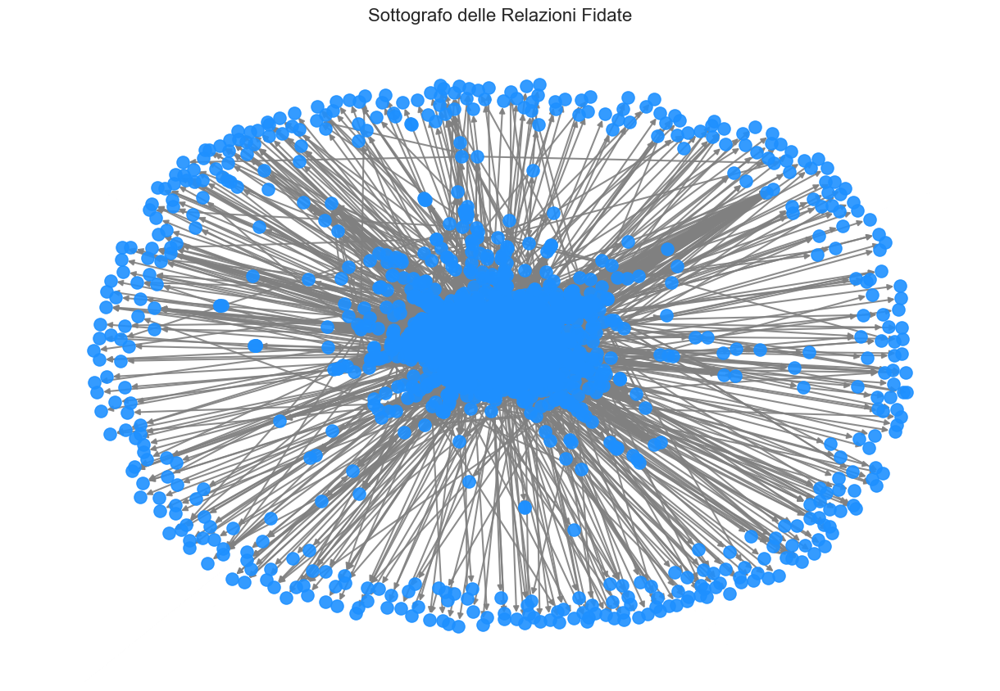

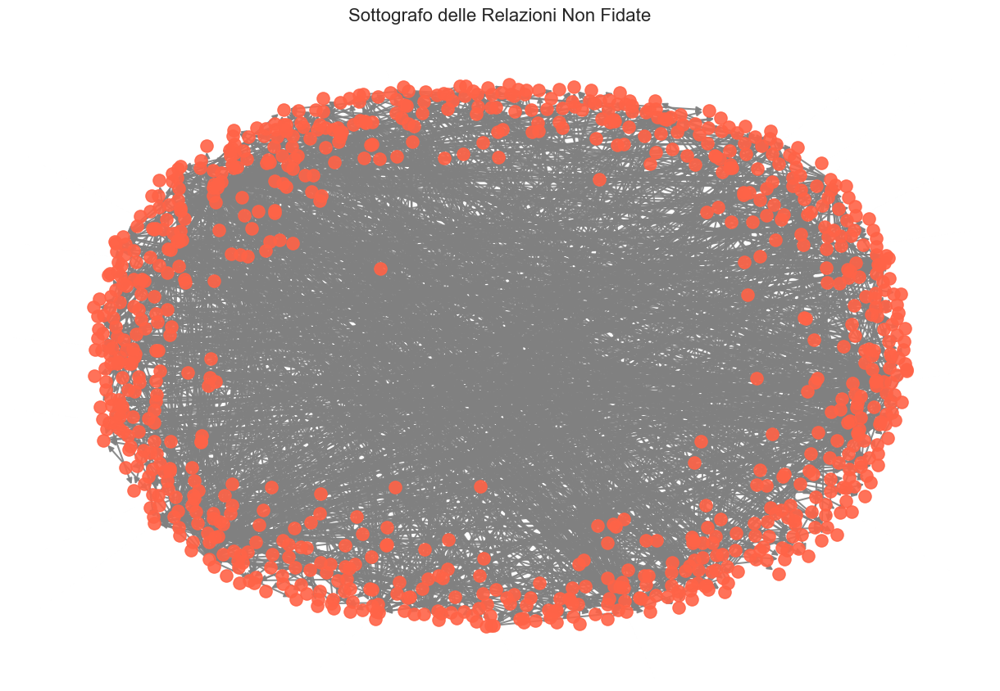

In [ ]:
# --- Visualizzazione dei sottografi con layout spring migliorato ---
def plot_sottografo(sottografo, title, node_color='lightblue'):
    pos = nx.spring_layout(sottografo, seed=42)  # Seed per layout riproducibile
    plt.figure(figsize=(12, 8))

    # Colore fisso per i nodi
    node_colors = node_color

    # Archi: colore uniforme e larghezza statica per maggiore leggibilità
    edge_colors = 'gray'
    edge_width = 1.5

    # Disegna il grafo
    nx.draw(
        sottografo,
        pos,
        with_labels=False,
        node_color=node_colors,
        node_size=120,
        edge_color=edge_colors,
        width=edge_width,
        alpha=0.9
    )
    plt.title(title, fontsize=16)
    plt.show()

# Visualizza i sottografi
plot_sottografo(G_positive, "Sottografo delle Relazioni Fidate", node_color='dodgerblue')
plot_sottografo(G_negative, "Sottografo delle Relazioni Non Fidate", node_color='tomato')

Il **sottografo delle relazioni fidate** mostra un’area centrale ben connessa, che indica una parte relativamente più coesa della rete. Questo sottografo rappresenta gli utenti che si valutano positivamente, formando interazioni più strettamente legate tra di loro. Ciò suggerisce che un certo numero di utenti si trovano in una rete di fiducia più intensa e continua. Gli utenti al centro sono quelli più coinvolti in queste dinamiche reciproche di valutazione positiva, mentre gli utenti che si trovano all’esterno sono meno centralizzati e possono essere meno attivi o più isolati nel contesto delle valutazioni fidate.

Il **sottografo delle relazioni non fidate** appare più disperso e meno centralizzato. Questo potrebbe riflettere una rete di valutazioni in cui gli utenti tendono a non fare affidamento sulle valutazioni reciproche, oppure la rete potrebbe rappresentare utenti che, pur avendo una connessione, non partecipano a circuiti di fiducia attiva.

In sintesi, i grafici suggeriscono che la rete di utenti sulla piattaforma di scambio Bitcoin è caratterizzata da una parte centralizzata di relazioni fidate, mentre un’altra parte della rete rimane meno coesa, con interazioni negative e non reciprocate. Potresti considerare di incentivare dinamiche più bilanciate, stimolando interazioni reciproche più forti e positive.

### Distribuzione dei Pesi positivi e negativi

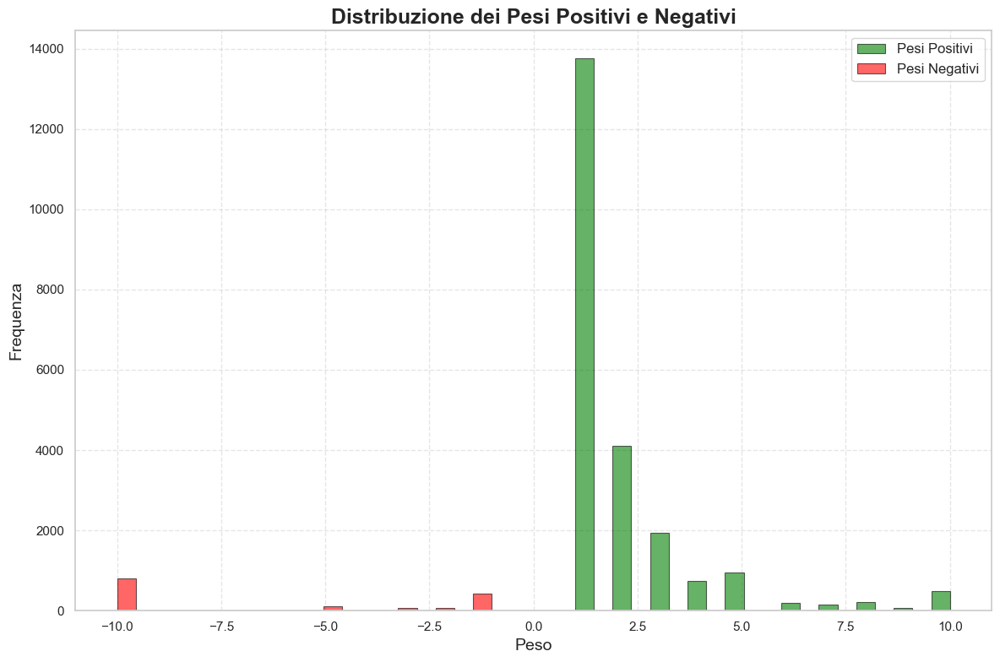

In [ ]:
pesi_positivi = [d['weight'] for _, _, d in archi_positivi]
pesi_negativi = [d['weight'] for _, _, d in archi_negativi]

plt.figure(figsize=(12, 8))

# Istogramma dei pesi positivi
plt.hist(
    pesi_positivi,
    bins=20,
    color='green',
    alpha=0.6,
    label='Pesi Positivi',
    edgecolor='black',  # Bordo nero per chiarezza
    linewidth=0.8
)

# Istogramma dei pesi negativi
plt.hist(
    pesi_negativi,
    bins=20,
    color='red',
    alpha=0.6,
    label='Pesi Negativi',
    edgecolor='black',  # Bordo nero per chiarezza
    linewidth=0.8
)

plt.title("Distribuzione dei Pesi Positivi e Negativi", fontsize=18, fontweight="bold")
plt.xlabel("Peso", fontsize=14)
plt.ylabel("Frequenza", fontsize=14)
plt.grid(visible=True, linestyle='--', alpha=0.5)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()

La **distribuzione dei pesi** mostra una netta prevalenza di valutazioni positive, con la maggior parte delle valutazioni concentrate su valori bassi (tra 0 e 2.5), indicando una propensione per giudizi moderati. Le valutazioni negative sono presenti, ma meno frequenti e meno concentrate su valori estremi, suggerendo che le interazioni negative siano relativamente rare nella rete. Questo potrebbe indicare una rete con una cultura di feedback positivo, dove la maggior parte degli utenti tende a dare valutazioni favorevoli, mentre le interazioni negative sono meno comuni, ma comunque presenti.

### Confronto tra archi positivi e negativi

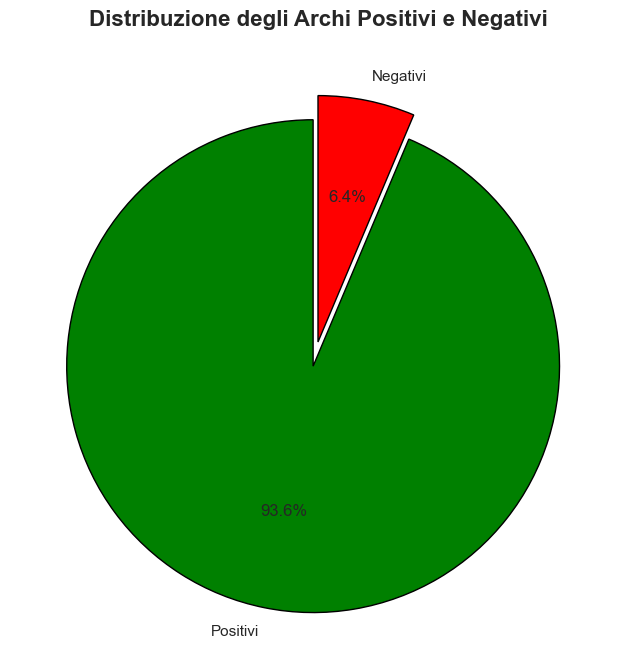

In [ ]:
labels = ['Positivi', 'Negativi']
counts = [len(archi_positivi), len(archi_negativi)]
colors = ['green', 'red']

plt.figure(figsize=(8, 8))

# Pie chart
plt.pie(
    counts,
    labels=labels,
    colors=colors,
    autopct='%1.1f%%',  # Percentuali visualizzate con una cifra decimale
    startangle=90,  # Inizio a ore 12
    explode=(0.1, 0),  # Esplode leggermente un segmento
    wedgeprops={'edgecolor': 'black', 'linewidth': 1}  # Bordo per chiarezza
)

plt.title("Distribuzione degli Archi Positivi e Negativi", fontsize=16, fontweight='bold')
plt.show()


### Confronto tra densità

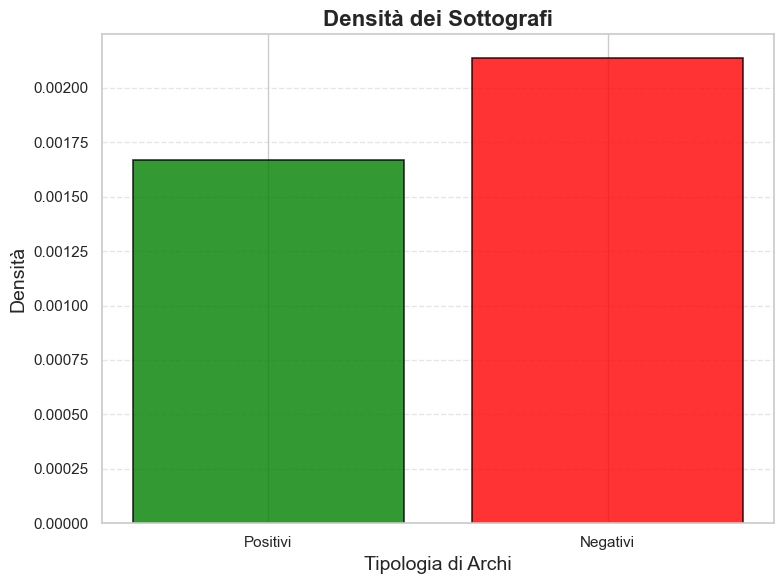

In [ ]:
labels = ['Positivi', 'Negativi']
densities = [nx.density(G_positive), nx.density(G_negative)]
colors = ['green', 'red']

plt.figure(figsize=(8, 6))
plt.bar(
    labels,
    densities,
    color=colors,
    edgecolor='black',  # Bordo nero per chiarezza
    alpha=0.8,  # Leggera trasparenza
    linewidth=1.2  # Spessore del bordo
)

plt.title("Densità dei Sottografi", fontsize=16, fontweight='bold')
plt.ylabel("Densità", fontsize=14)
plt.xlabel("Tipologia di Archi", fontsize=14)
plt.grid(visible=True, linestyle='--', alpha=0.5, axis='y')
plt.tight_layout()
plt.show()

### Confronto del Clustering medio

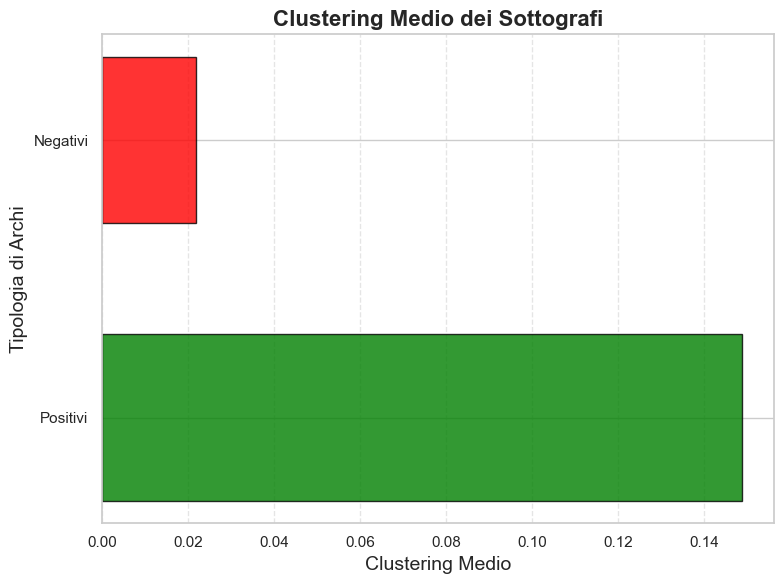

In [ ]:
labels = ['Positivi', 'Negativi']
clustering = [nx.average_clustering(G_positive), nx.average_clustering(G_negative)]
colors = ['green', 'red']

plt.figure(figsize=(8, 6))

# Grafico a barre orizzontali
plt.barh(
    labels,
    clustering,
    color=colors,
    edgecolor='black',
    alpha=0.8,
    height=0.6  # Regola l'altezza delle barre
)

plt.title("Clustering Medio dei Sottografi", fontsize=16, fontweight='bold')
plt.xlabel("Clustering Medio", fontsize=14)
plt.ylabel("Tipologia di Archi", fontsize=14)
plt.grid(visible=True, linestyle='--', alpha=0.5, axis='x')
plt.tight_layout()
plt.show()

Il sottografo delle **relazioni fidate** (Positivi) ha un valore significativamente più alto rispetto al sottografo delle relazioni non fidate (Negativi). Questo suggerisce che, nella rete di valutazioni, gli utenti tendono a formare gruppi di valutazioni reciprocamente affermative (fiducia), creando una maggiore coesione locale tra i nodi che si scambiano valutazioni positive. Al contrario, il sottografo delle **relazioni non fidate**, pur avendo alcune connessioni, mostra un basso clustering, indicando che le connessioni negative sono meno propense a formare gruppi o dinamiche di interazione coese tra gli utenti. In generale, questo evidenzia una rete con una maggiore coesione nelle relazioni di fiducia, ma una minore tra gli utenti con relazioni negative.

# 4. Analisi delle Centralità

Le centralità sono misure per identificare l’importanza o la rilevanza di un nodo all’interno di un grafo.
Ogni tipo di centralità cattura un aspetto diverso della posizione del nodo nel grafo.

Considerando la natura orientata e pesata del grafo di analisi, e considerando le problematiche di alcuni algoritmi di calcolo delle centralità in presenza di pesi negativi, si sceglie di condurre l'analisi delle centralità sulla sottorete fidata, ovvero sul sottografo delle valutazioni positie (G_positive).

## 4.1 Degree centrality
La degree centrality è una misura di centralità che valuta l’importanza di un nodo in un grafo in base al numero di collegamenti diretti (archi) che esso possiede. In un grafo orientato, esistono:
1.	**In-degree centrality**: misura il numero di archi entranti, ossia quante valutazioni un nodo riceve da altri.
2.	**Out-degree centrality**: misura il numero di archi uscenti, ossia quante valutazioni un nodo dà ad altri.

Nel caso in esame la degree centrality può essere utilizzata per identificare gli utenti più attivi (che danno molte valutazioni) o quelli più centrali (che ricevono molte valutazioni). Una degree centrality elevata indica che un utente è molto connesso alla rete, sia come fornitore che come destinatario di valutazioni, mentre un valore basso suggerisce una partecipazione limitata nelle dinamiche di scambio o feedback reciproco.

In [ ]:
import pandas as pd
import networkx as nx

# Funzione per calcolare Degree Centrality
def calculate_degree_centrality(G):
    in_degree_centrality = nx.in_degree_centrality(G)
    out_degree_centrality = nx.out_degree_centrality(G)
    degree_centrality = nx.degree_centrality(G)

    # Crea un DataFrame per centralità
    degree_centrality_df = pd.DataFrame({
        'node': list(G.nodes),
        'in_degree_centrality': [in_degree_centrality[node] for node in G.nodes],
        'out_degree_centrality': [out_degree_centrality[node] for node in G.nodes],
        'degree_centrality': [degree_centrality[node] for node in G.nodes]
    })

    return degree_centrality_df

# Esegui il calcolo delle centralità
degree_centrality_df = calculate_degree_centrality(G_positive)

# Ordinare e stampare i top 10 per In-Degree Centrality
top_10_in_degree = degree_centrality_df.sort_values('in_degree_centrality', ascending=False).head(10)
print("Top 10 nodi per In-Degree Centrality nel sottografo positivo:")
print(top_10_in_degree[['node', 'in_degree_centrality']])

# Ordinare e stampare i top 10 per Out-Degree Centrality
top_10_out_degree = degree_centrality_df.sort_values('out_degree_centrality', ascending=False).head(10)
print("\nTop 10 nodi per Out-Degree Centrality nel sottografo positivo:")
print(top_10_out_degree[['node', 'out_degree_centrality']])

# Ordinare e stampare i top 10 per Degree Centrality
top_10_degree = degree_centrality_df.sort_values('degree_centrality', ascending=False).head(10)
print("\nTop 10 nodi per Degree Centrality nel sottografo positivo:")
print(top_10_degree[['node', 'degree_centrality']])

Top 10 nodi per In-Degree Centrality nel sottografo positivo:
     node  in_degree_centrality
171     1              0.108093
20      3              0.067898
34      2              0.055676
14      4              0.054590
19      7              0.050516
170    11              0.049701
108    10              0.044269
486   177              0.042368
196     5              0.039381
322     6              0.037751

Top 10 nodi per Out-Degree Centrality nel sottografo positivo:
     node  out_degree_centrality
171     1               0.131993
20      3               0.065454
14      4               0.056763
34      2               0.050516
486   177               0.049973
170    11               0.049701
19      7               0.046714
108    10               0.045084
239    15               0.041282
322     6               0.038566

Top 10 nodi per Degree Centrality nel sottografo positivo:
     node  degree_centrality
171     1           0.240087
20      3           0.133351
14      4   

1. **In-Degree Centrality**
- I nodi con alta centralità in entrata ricevono molte valutazioni dagli altri utenti, rendendoli particolarmente visibili e affidabili nella rete. Il Nodo 1, con un valore di 0.1080, è il più centrale e potrebbe essere considerato un referente o esperto della piattaforma. Seguono il Nodo 3 (0.0678) e il Nodo 2 (0.0556), sebbene con un’intensità minore.


2. **Out-Degree Centrality**
- I nodi con alta centralità in uscita rilasciano molte valutazioni, segnalando un’elevata attività nel fornire feedback. Il Nodo 1, con un valore di 0.1319, è il più attivo, seguito dal Nodo 3 (0.0654) e dal Nodo 4 (0.0568).
Questi utenti agiscono come “generatori di fiducia”, aiutando la rete a mantenere dinamiche di valutazione attive.


3. **Degree Centrality (complessiva)**
- La degree centrality complessiva somma la centralità in entrata e in uscita, identificando i nodi più connessi sia nel ricevere che nel fornire valutazioni. Il Nodo 1 domina con un valore di 0.2401, seguito dal Nodo 3 (0.1334) e dal Nodo 4 (0.1114), evidenziando il loro ruolo chiave nella rete.







### Degree centrality nel tempo (grafo totale)

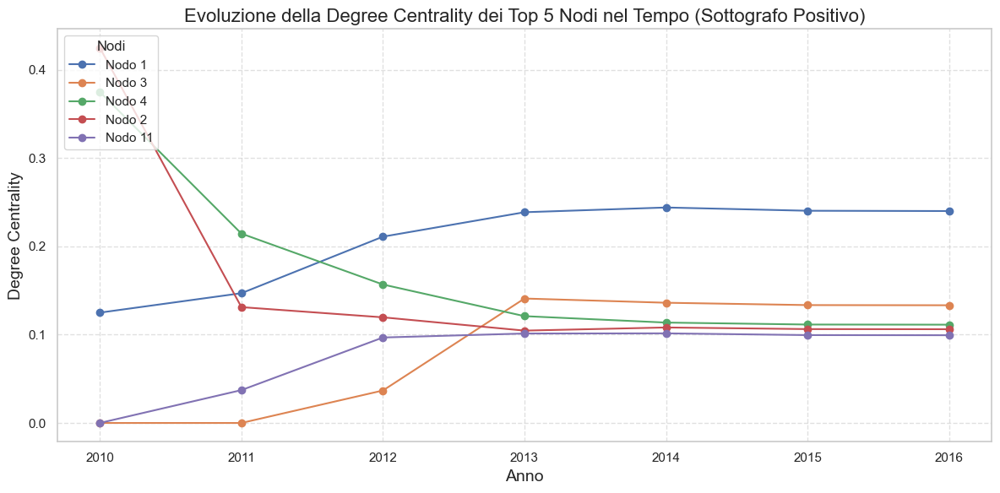

In [ ]:
# Assicurati che la colonna 'time_readable' sia in formato datetime
edges_df['time_readable'] = pd.to_datetime(edges_df['time_readable'], errors='coerce')

# Estrai l'anno dalla colonna 'time_readable' e crea una nuova colonna 'year'
edges_df['year'] = edges_df['time_readable'].dt.year

# Estrazione degli anni unici
years = edges_df['year'].unique()

# Funzione per ottenere il grafo positivo fino ad un dato anno
def get_positive_graph_by_year(edges_df, year):
    # Filtra i dati fino a quell'anno e seleziona solo gli archi positivi
    edges_year = edges_df[(edges_df['year'] <= year) & (edges_df['rating'] > 0)]  # Solo valutazioni positive
    G_year = nx.DiGraph()
    for _, row in edges_year.iterrows():
        G_year.add_edge(row['source'], row['target'], rating=row['rating'], time=row['time_readable'])
    return G_year

# Lista dei top 10 nodi per Degree Centrality
top_5_nodes = [1, 3, 4, 2, 11]

# Lista per memorizzare i valori di degree centrality per ogni anno
degree_centralities_yearly = {node: [] for node in top_5_nodes}
years_sorted = sorted(years)  # Ordinare gli anni in ordine crescente

# Calcolare la degree centrality per i top 10 nodi per ogni anno
for year in years_sorted:
    # Crea il grafo positivo per l'anno corrente
    G_year = get_positive_graph_by_year(edges_df, year)

    # Calcola la degree centrality per il grafo positivo corrente
    degree_centrality = nx.degree_centrality(G_year)

    # Aggiungi la degree centrality per i top 10 nodi
    for node in top_5_nodes:
        degree_centralities_yearly[node].append(degree_centrality.get(node, 0))  # 0 se il nodo non è presente

# Creazione di un DataFrame con i risultati ordinati
df_degree_centrality = pd.DataFrame(degree_centralities_yearly, index=years_sorted)

# Visualizzare i risultati con un grafico a linee
plt.figure(figsize=(12, 6))

for node in top_5_nodes:
    plt.plot(df_degree_centrality.index, df_degree_centrality[node], label=f"Nodo {node}", marker='o')

plt.title("Evoluzione della Degree Centrality dei Top 5 Nodi nel Tempo (Sottografo Positivo)", fontsize=16)
plt.xlabel("Anno", fontsize=14)
plt.ylabel("Degree Centrality", fontsize=14)
plt.legend(title="Nodi", loc='upper left')
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()

Il grafico mostra l’andamento della Degree Centrality nel tempo dei primi 5 nodi nella sottorete delle relazioni fidate, ovvero dove le valutazioni sono positive.
- Il **Nodo 1** mantiene costantemente una degree centrality elevata, confermando il fatto che sia uno dei nodi più influenti e centrali della rete. Questo nodo sembra avere una posizione di stabilità nella rete, con interazioni e valutazioni costanti nel tempo.
- I **nodi 3 ed 11** mostrano una crescita fino al 2013 per, per poi rimanere con una degree centrality costante negli anni successivi.
- I **nodi 2 e 4** mostrano invece uan diminuzione della centralità negli anni, più pronunciata per il nodo 2 fino al 2011, per poi stabilizzarsi a partire dal 2013, come nel caso degli altri.

## 4.2 Closeness centrality

La closeness centrality misura quanto “vicino” è un nodo rispetto a tutti gli altri nel grafo, calcolando la somma delle distanze più brevi dagli altri nodi. Nei grafi diretti si calcola considerando i cammini entranti e quelli uscenti.
- Una persona con alta closeness centrality è “vicina” (in termini di cammini più brevi) a molte altre persone, il che significa che può accedere rapidamente o influenzare la rete.

Il calcolo della **in-closeness-centrality** viene effettuato analizzando i percorsi inversi del grafo G di partenza. Va da se che la **out-closeness-centrality** corrisponde alla closeness-centrality del grafo totale

In [ ]:
# Funzione per calcolare Closeness Centrality
def calculate_closeness_centrality(G):
    in_closeness_centrality = nx.closeness_centrality(G.reverse())  # Analizza percorsi inversi
    out_closeness_centrality = nx.closeness_centrality(G) # L'out centrality della Closeness corrisponde alla Closeness del grafo totale

    closeness_centrality_df = pd.DataFrame({
        'node': list(G.nodes),
        'in_closeness_centrality': [in_closeness_centrality[node] for node in G.nodes],
        'out_closeness_centrality': [out_closeness_centrality[node] for node in G.nodes]
    })

    return closeness_centrality_df

# Calcolare la closeness centrality
closeness_centrality_df = calculate_closeness_centrality(G_positive)

# Ordinare per in_closeness_centrality e stampare i primi 10
top_10_in_closeness = closeness_centrality_df.sort_values('in_closeness_centrality', ascending=False).head(10)
print("Top 10 nodi per In-Closeness Centrality:")
print(top_10_in_closeness[['node', 'in_closeness_centrality']])

# Ordinare per out_closeness_centrality e stampare i primi 10
top_10_out_closeness = closeness_centrality_df.sort_values('out_closeness_centrality', ascending=False).head(10)
print("\nTop 10 nodi per Out-Closeness Centrality:")
print(top_10_out_closeness[['node', 'out_closeness_centrality']])

Top 10 nodi per In-Closeness Centrality:
     node  in_closeness_centrality
34      2                 0.411577
170    11                 0.409254
171     1                 0.405518
164    22                 0.394575
14      4                 0.390156
108    10                 0.389770
160    42                 0.381075
166    17                 0.379529
582    75                 0.379488
486   177                 0.378196

Top 10 nodi per Out-Closeness Centrality:
     node  out_closeness_centrality
34      2                  0.374169
171     1                  0.365623
170    11                  0.360899
108    10                  0.357369
14      4                  0.352898
160    42                  0.347772
169     9                  0.345160
20      3                  0.344534
161    26                  0.342835
582    75                  0.341193


1. **In-Closeness Centrality**
- I nodi con la più alta in-closeness centrality sono quelli più facilmente raggiungibili dal resto della rete attraverso cammini minimi. I top nodi includono il Nodo 2 (0.4116), Nodo 11 (0.4093) e Nodo 1 (0.4055), indicando che ricevono valutazioni con meno passaggi rispetto agli altri.
    - questi utenti risultano più visibili o popolari, poiché il flusso di valutazioni converge rapidamente verso di loro. In un contesto di fiducia, significa che la loro reputazione è facilmente accessibile, senza la necessità di numerosi intermediari per essere riconosciuta dalla rete.

2. **Out-Closeness Centrality**
- I nodi con la più alta out-closeness centrality sono quelli che possono raggiungere rapidamente gli altri utenti con pochi passaggi. Tra i più centrali troviamo il Nodo 2 (0.3742), Nodo 1 (0.3656) e Nodo 11 (0.3609).
    - questi nodi hanno una distanza media ridotta verso il resto della rete, permettendo loro di lasciare valutazioni o interagire con molti utenti senza troppi intermediari. Ciò li rende potenziali iniziatori di transazioni, con un’ampia rete di connessioni dirette o di secondo livello, facilitando lo scambio di fiducia e valutazioni.

### Closeness centrality nel tempo (grafo totale)

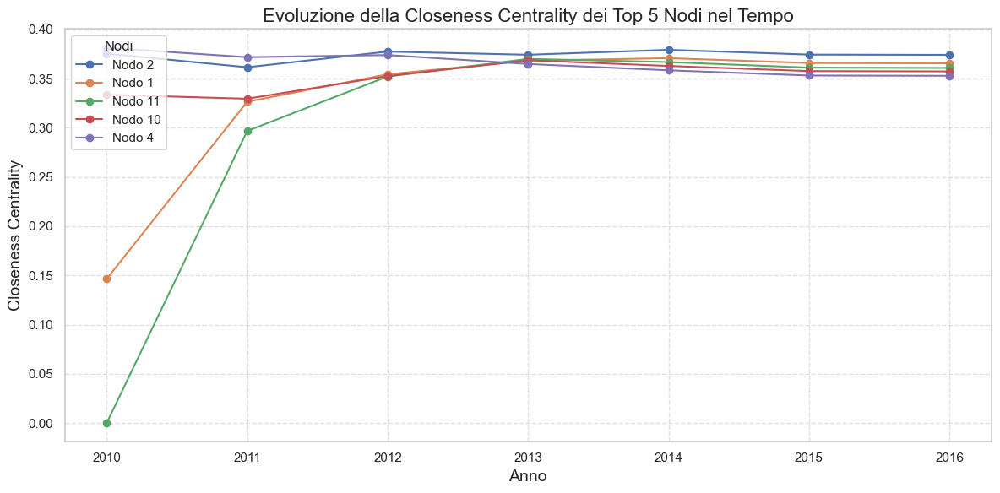

In [ ]:
# Assicurati che la colonna 'time_readable' sia in formato datetime
edges_df['time_readable'] = pd.to_datetime(edges_df['time_readable'], errors='coerce')

# Estrai l'anno dalla colonna 'time_readable' e crea una nuova colonna 'year'
edges_df['year'] = edges_df['time_readable'].dt.year

# Estrazione degli anni unici
years = edges_df['year'].unique()

# Funzione per ottenere il grafo positivo fino ad un dato anno
def get_positive_graph_by_year(edges_df, year):
    # Filtra i dati fino a quell'anno e seleziona solo gli archi positivi
    edges_year = edges_df[(edges_df['year'] <= year) & (edges_df['rating'] > 0)]  # Solo valutazioni positive
    G_year = nx.DiGraph()
    for _, row in edges_year.iterrows():
        G_year.add_edge(row['source'], row['target'], rating=row['rating'], time=row['time_readable'])
    return G_year

# Lista dei top 10 nodi per Degree Centrality
top_5_nodes = [2, 1, 11, 10, 4]

# Lista per memorizzare i valori di closeness centrality per ogni anno
closeness_centralities_yearly = {node: [] for node in top_5_nodes}

# Calcolare la closeness centrality per i top 10 nodi per ogni anno
for year in years_sorted:
    # Crea il grafo per l'anno corrente
    G_year = get_positive_graph_by_year(edges_df, year)

    # Calcola la closeness centrality per il grafo corrente
    closeness_centrality = nx.closeness_centrality(G_year)  # Calcola la closeness centrality

    # Aggiungi la closeness centrality per i top 10 nodi
    for node in top_5_nodes:
        closeness_centralities_yearly[node].append(closeness_centrality.get(node, 0))  # 0 se il nodo non è presente

# Creazione di un DataFrame con i risultati ordinati
df_closeness_centrality = pd.DataFrame(closeness_centralities_yearly, index=years_sorted)

# Visualizzare i risultati con un grafico a linee
plt.figure(figsize=(12, 6))

for node in top_5_nodes:
    plt.plot(df_closeness_centrality.index, df_closeness_centrality[node], label=f"Nodo {node}", marker='o')

plt.title("Evoluzione della Closeness Centrality dei Top 5 Nodi nel Tempo", fontsize=16)
plt.xlabel("Anno", fontsize=14)
plt.ylabel("Closeness Centrality", fontsize=14)
plt.legend(title="Nodi", loc='upper left')
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()

- Il Nodo 2 si distingue per avere una closeness centrality costantemente alta durante utto il periodo di analisi,suggerendo che questo nodo sia diventato rapidamente uno dei più importanti per la rete, mantenendo questa posizione grazie a connessioni dirette o di secondo livello che facilitano le sue interazioni.

- Il Nodo 1 ed il Nodo 11 seguono dei pattern di creascita simili, maggiore nel Noodo 11, anche se questo partiva da un livello di centralità nettamente inferiore.
Per entrambe i nodi la crescita si stabilizza introno al 2013, probabilmente grazie al fatto di riuscire a mantenere costante la propria reputazione all'interno della rete di fiducia.

- I Nodi 10 e 4 inizialmente mostrano una crescita meno evidente, ma si stabilizzano su valori medio-alti. Questo comportamento potrebbe indicare che questi nodi non hanno avuto un ruolo dominante, ma sono comunque riusciti a ricavarsi la propria nichia di fiducia.

## 4.3 Betweenness Centrality
La betweenness centrality misura quante volte un nodo si trova su cammini più brevi tra altri nodi del grafo. Indica quanto il nodo agisce da “ponte”. Nei grafi diretti, si calcolano i cammini più brevi rispettando la direzione degli archi.

Un nodo con alta betweenness centrality è cruciale per connettere diverse parti del grafo.

- **Betweeness centrality**: Conta il numero di cammini più brevi tra coppie di nodi che passano attraverso un nodo.
  - Un nodo con alta betweenness centrality è un “ponte” tra altre persone: ha un ruolo strategico nel collegare gruppi diversi. Può rappresentare una persona che media tra diversi gruppi o che ha potere di controllo sulla rete.

Gli archi pesati influenzano la scelta dei cammini più brevi. Considerare i pesi (positivi e negativi) può rivelare chi è cruciale nel collegare gruppi in base alle valutazioni.

In [ ]:
# Funzione per calcolare Betweenness Centrality
def calculate_betweenness_centrality(G):
    betweenness_centrality = nx.betweenness_centrality(G, weight='weight')

    # Crea un DataFrame per centralità
    betweenness_centrality_df = pd.DataFrame({
        'node': list(G.nodes),
        'betweenness_centrality': [betweenness_centrality[node] for node in G.nodes]
    })

    return betweenness_centrality_df

# Calcolare la Betweenness Centrality
betweenness_centrality_df = calculate_betweenness_centrality(G_positive)

# Ordinare i nodi per Betweenness Centrality in ordine decrescente e mostrare i top 10
top_10_betweenness = betweenness_centrality_df.sort_values('betweenness_centrality', ascending=False).head(10)

# Stampa i top 10 nodi per Betweenness Centrality
print("Top 10 nodi per Betweenness Centrality nel sottografo positivo:")
print(top_10_betweenness[['node', 'betweenness_centrality']])

Top 10 nodi per Betweenness Centrality nel sottografo positivo:
     node  betweenness_centrality
171     1                0.158451
34      2                0.052873
108    10                0.047641
20      3                0.046679
170    11                0.043794
12     33                0.042224
14      4                0.033268
393    13                0.032274
239    15                0.031852
486   177                0.031518


- Il Nodo 1 domina la betweenness centrality con un valore di $0.1585$, distaccandosi nettamente dagli altri. Questo risultato suggerisce che il Nodo 1 svolge un ruolo di "snodo" fondamentale nella rete, agendo da mediatore tra diverse parti della rete di fiducia. Ciò fa intendere che le interazioni di fiducia potrebbero essere indirettamente influenzate da questo utente.

- Il Nodo 2, con valori di closeness centrality già elevati, conferma la sua importanza anche qui con un valore di $0.0529$. Questo indica che il Nodo 2 non è solo centrale per la propria accessibilità e influenza diretta, ma è anche un mediatore importante nei cammini minimi, facilitando le interazioni indirette tra altri utenti.

- Il Nodo 10 e il Nodo 3 seguono nella classifica con valori rispettivamente di $0.047$6 e $0.0467$. Anche se non dominano la rete come il Nodo 1, svolgono comunque un ruolo di rilievo nel garantire che informazioni e valutazioni possano fluire senza ostacoli.

### Betweenness centrality nel tempo (grafo totale)

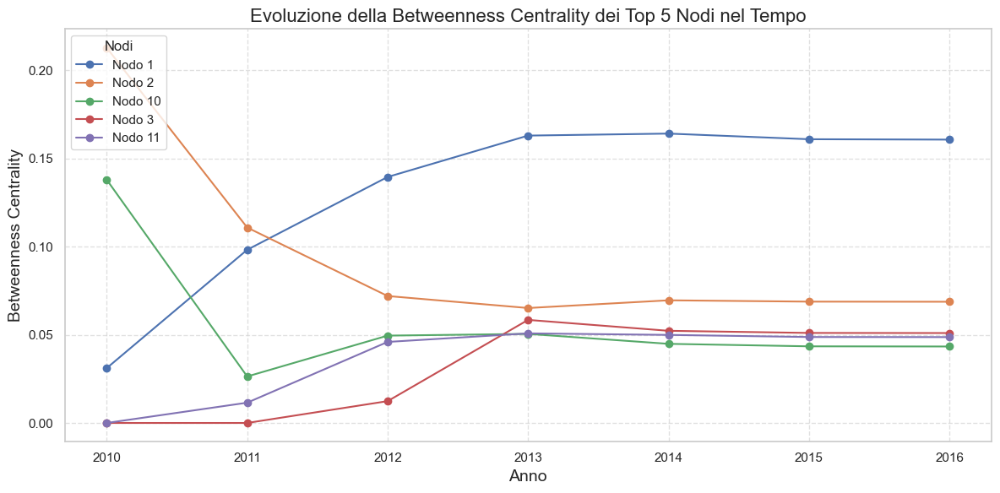

In [ ]:
# Assicurati che la colonna 'time_readable' sia in formato datetime
edges_df['time_readable'] = pd.to_datetime(edges_df['time_readable'], errors='coerce')

# Estrai l'anno dalla colonna 'time_readable' e crea una nuova colonna 'year'
edges_df['year'] = edges_df['time_readable'].dt.year

# Estrazione degli anni unici
years = edges_df['year'].unique()

# Funzione per ottenere il grafo positivo fino ad un dato anno
def get_positive_graph_by_year(edges_df, year):
    # Filtra i dati fino a quell'anno e seleziona solo gli archi positivi
    edges_year = edges_df[(edges_df['year'] <= year) & (edges_df['rating'] > 0)]  # Solo valutazioni positive
    G_year = nx.DiGraph()
    for _, row in edges_year.iterrows():
        G_year.add_edge(row['source'], row['target'], rating=row['rating'], time=row['time_readable'])
    return G_year

# Lista dei top 10 nodi per Degree Centrality
top_5_nodes = [1, 2, 10, 3, 11]

# Lista per memorizzare i valori di betweenness centrality per ogni anno
betweenness_centralities_yearly = {node: [] for node in top_5_nodes}

# Calcolare la betweenness centrality per i top 10 nodi per ogni anno
for year in years_sorted:
    # Crea il grafo per l'anno corrente
    G_year = get_positive_graph_by_year(edges_df, year)

    # Calcola la betweenness centrality per il grafo corrente
    betweenness_centrality = nx.betweenness_centrality(G_year, weight='weight')  # Usa il peso

    # Aggiungi la betweenness centrality per i top 10 nodi
    for node in top_5_nodes:
        betweenness_centralities_yearly[node].append(betweenness_centrality.get(node, 0))  # 0 se il nodo non è presente

# Creazione di un DataFrame con i risultati ordinati
df_betweenness_centrality = pd.DataFrame(betweenness_centralities_yearly, index=years_sorted)

# Visualizzare i risultati con un grafico a linee
plt.figure(figsize=(12, 6))

for node in top_5_nodes:
    plt.plot(df_betweenness_centrality.index, df_betweenness_centrality[node], label=f"Nodo {node}", marker='o')

plt.title("Evoluzione della Betweenness Centrality dei Top 5 Nodi nel Tempo", fontsize=16)
plt.xlabel("Anno", fontsize=14)
plt.ylabel("Betweenness Centrality", fontsize=14)
plt.legend(title="Nodi", loc='upper left')
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()

- Il Nodo 2 inizialmente presenta valori elevati, ma dal 2011 in poi subisce un calo graduale fino a stabilizzarsi su valori medi. Questo comportamento potrebbe indicare che, pur mantenendo una certa influenza, il nodo ha perso parte del suo ruolo di mediatore diretto, forse a causa della crescita di altri nodi che hanno assunto funzioni simili.

- Il Nodo 10 mostra un pattern di crescita continua fino al 2013, per poi stabilizzarsi. Questo suggerisce che ha progressivamente guadagnato importanza nella rete, fungendo da ponte per molte interazioni, ma senza raggiungere l’importanza strategica del Nodo 1.

- I Nodi 3 e 11 mostrano dinamiche di crescita iniziale, ma si stabilizzano su valori inferiori rispetto agli altri. Questo indica che, sebbene abbiano avuto un ruolo iniziale di intermediazione, non sono riusciti a consolidare tale posizione nel tempo.

## 4.4 Eigenvector Centrality
L’eigenvector centrality assegna un punteggio ai nodi in base alla loro connessione con altri nodi importanti. È una misura iterativa che considera non solo il numero di connessioni, ma anche la qualità (importanza) di quelle connessioni. Nei grafi diretti si considerano le connessioni entranti e quelle uscenti.

Un nodo con alta eigenvector centrality è connesso a nodi che sono anch’essi importanti.

- **Eigenvector Centrality**: Valuta l’importanza di un nodo basandosi sull’importanza dei nodi connessi.
  - Un nodo con alta eigenvector centrality è connesso a nodi che sono essi stessi importanti. Questo può rappresentare una persona che riceve valutazioni da persone “influenti”. Può indicare una figura di alta reputazione o prestigio nella rete.



In [ ]:
# Funzione per calcolare Eigenvector Centrality
def calculate_eigenvector_centrality(G):
    in_eigenvector_centrality = nx.eigenvector_centrality(G.reverse(), weight='weight', max_iter=1000)
    out_eigenvector_centrality = nx.eigenvector_centrality(G, weight='weight', max_iter=1000) # Come per Closeness, l'out centrality corrisponde a quella del grafo totale

    # Crea un DataFrame per centralità
    eigenvector_centrality_df = pd.DataFrame({
        'node': list(G.nodes),
        'in_eigenvector_centrality': [in_eigenvector_centrality[node] for node in G.nodes],
        'out_eigenvector_centrality': [out_eigenvector_centrality[node] for node in G.nodes]
    })

    return eigenvector_centrality_df

# Calcolare la Eigenvector Centrality
eigenvector_centrality_df = calculate_eigenvector_centrality(G_positive)

# Ordinare i nodi per Eigenvector Centrality in ordine decrescente e mostrare i top 10
top_10_eigenvector = eigenvector_centrality_df.sort_values('out_eigenvector_centrality', ascending=False).head(10)

# Stampa i top 10 nodi per Eigenvector Centrality
print("Top 10 nodi per Eigenvector Centrality nel sottografo positivo:")
print(top_10_eigenvector[['node', 'out_eigenvector_centrality']])
print(top_10_eigenvector[['node', 'in_eigenvector_centrality']])

Top 10 nodi per Eigenvector Centrality nel sottografo positivo:
     node  out_eigenvector_centrality
34      2                    0.345885
14      4                    0.214238
169     9                    0.206071
322     6                    0.169218
196     5                    0.168401
20      3                    0.162421
162    20                    0.162364
636    31                    0.158818
170    11                    0.148074
19      7                    0.146527
     node  in_eigenvector_centrality
34      2                   0.214864
14      4                   0.143556
169     9                   0.157046
322     6                   0.122510
196     5                   0.137314
20      3                   0.156274
162    20                   0.162937
636    31                   0.113525
170    11                   0.228769
19      7                   0.125311


- il Nodo 2 domina sia nella out-eigenvector centrality ($0.3459$) che nella in-eigenvector centrality ($0.2149$), confermando il suo ruolo di nodo centrale con connessioni altamente influenti, sia nel ricevere che nel fornire valutazioni importanti. Questo suggerisce che il Nodo 2 non solo ha legami con attori influenti, ma è anche riconosciuto da essi come un nodo di riferimento.

- Il Nodo 4 si posiziona al secondo posto nella out-eigenvector centrality ($0.2142$) e mantiene una buona posizione anche nella centralità entrante ($0.1436$), il che indica che il nodo ha un ruolo importante sia nel connettersi a nodi influenti sia nel ricevere valutazioni da loro. Il Nodo 9 segue un pattern simile, con un buon bilanciamento tra connessioni entranti e uscenti influenti.

- Il Nodo 11, pur non avendo un out-eigenvector elevato ($0.1481$), si distingue nella in-eigenvector centrality ($0.2288$), suggerendo che il Nodo 11 riceve valutazioni da nodi molto influenti, indicando una forte reputazione nella rete, sebbene non sia altrettanto attivo nel generare valutazioni

### Eigenvector centrality nel tempo (grafo totale)

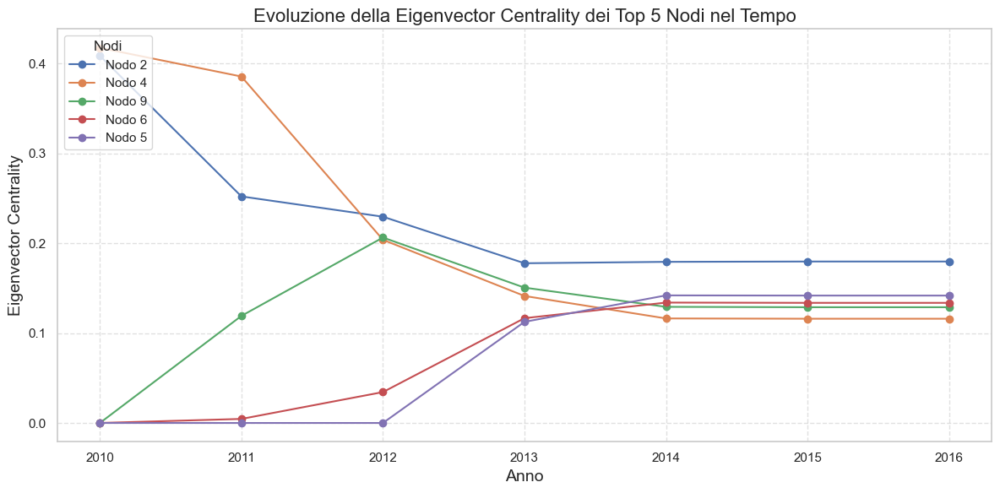

In [ ]:
# Assicurati che la colonna 'time_readable' sia in formato datetime
edges_df['time_readable'] = pd.to_datetime(edges_df['time_readable'], errors='coerce')

# Estrai l'anno dalla colonna 'time_readable' e crea una nuova colonna 'year'
edges_df['year'] = edges_df['time_readable'].dt.year

# Estrazione degli anni unici
years = edges_df['year'].unique()

# Funzione per ottenere il grafo positivo fino ad un dato anno
def get_positive_graph_by_year(edges_df, year):
    # Filtra i dati fino a quell'anno e seleziona solo gli archi positivi
    edges_year = edges_df[(edges_df['year'] <= year) & (edges_df['rating'] > 0)]  # Solo valutazioni positive
    G_year = nx.DiGraph()
    for _, row in edges_year.iterrows():
        G_year.add_edge(row['source'], row['target'], rating=row['rating'], time=row['time_readable'])
    return G_year

# Lista dei top 10 nodi per Degree Centrality
top_5_nodes = [2, 4, 9, 6, 5]

# Lista per memorizzare i valori di eigenvector centrality per ogni anno
eigenvector_centralities_yearly = {node: [] for node in top_5_nodes}

# Calcolare la eigenvector centrality per i top 10 nodi per ogni anno
for year in years_sorted:
    # Crea il grafo per l'anno corrente
    G_year = get_positive_graph_by_year(edges_df, year)

    # Calcola la eigenvector centrality per il grafo corrente
    eigenvector_centrality = nx.eigenvector_centrality(G_year, max_iter=1000, weight='weight')  # Usa i pesi

    # Aggiungi la eigenvector centrality per i top 10 nodi
    for node in top_5_nodes:
        eigenvector_centralities_yearly[node].append(eigenvector_centrality.get(node, 0))  # 0 se il nodo non è presente

# Creazione di un DataFrame con i risultati ordinati
df_eigenvector_centrality = pd.DataFrame(eigenvector_centralities_yearly, index=years_sorted)

# Visualizzare i risultati con un grafico a linee
plt.figure(figsize=(12, 6))

for node in top_5_nodes:
    plt.plot(df_eigenvector_centrality.index, df_eigenvector_centrality[node], label=f"Nodo {node}", marker='o')

plt.title("Evoluzione della Eigenvector Centrality dei Top 5 Nodi nel Tempo", fontsize=16)
plt.xlabel("Anno", fontsize=14)
plt.ylabel("Eigenvector Centrality", fontsize=14)
plt.legend(title="Nodi", loc='upper left')
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()

- Il Nodo 2 inizia con una eigenvector centrality elevata e mantiene una posizione dominante nel tempo, a dimostrazione del fatto che le sue connessioni importanti sono rimaste stabili e significative.

- Il Nodo 4 presenta un andamento decrescente dopo il 2011, suggerendo che, sebbene inizialmente fosse connesso a nodi molto influenti, queste connessioni hanno perso importanza o sono state sostituite da altri nodi.

- Il Nodo 9 mostra una crescita costante fino al 2012, per poi stabilizzarsi. Questo pattern indica che il nodo ha costruito progressivamente la sua rete di connessioni influenti, guadagnando importanza con il tempo.

- I Nodi 6 e 5 mostrano dinamiche di crescita simili, con un aumento graduale della loro centralità fino al 2013, segno che hanno saputo costruire connessioni rilevanti nel tempo.

## Top 10 centrality

Calcolo delle migliori 10 centralità per il grafo diretto (Degree, Closeness, Betweenness, Eigenvector)

In [ ]:
# Creazione dei DataFrame delle top centralità
top10_degree_df = degree_centrality_df.sort_values('degree_centrality', ascending=False)[['node', 'degree_centrality']]
top10_closeness_df = closeness_centrality_df.sort_values('out_closeness_centrality', ascending=False)[['node', 'out_closeness_centrality']]
top10_betweenness_df = betweenness_centrality_df.sort_values('betweenness_centrality', ascending=False)[['node', 'betweenness_centrality']]
top10_eigenvector_df = eigenvector_centrality_df.sort_values('out_eigenvector_centrality', ascending=False)[['node', 'out_eigenvector_centrality']]

# Esempio di rimozione dell'indice di riga
top10_degree_df = top10_degree_df.reset_index(drop=True)
top10_closeness_df = top10_closeness_df.reset_index(drop=True)
top10_betweenness_df = top10_betweenness_df.reset_index(drop=True)
top10_eigenvector_df = top10_eigenvector_df.reset_index(drop=True)

# Dizionario delle top centralità
centralities_dict = {
    'Degree Centrality': top10_degree_df,
    'Closeness Centrality (Out)': top10_closeness_df,
    'Betweenness Centrality': top10_betweenness_df,
    'Eigenvector Centrality (Out)': top10_eigenvector_df
}

print(centralities_dict)


{'Degree Centrality':       node  degree_centrality
0        1           0.240087
1        3           0.133351
2        4           0.111353
3        2           0.106192
4       11           0.099402
...    ...                ...
3678  2651           0.000272
3679  2441           0.000272
3680  5415           0.000272
3681  2614           0.000272
3682  7188           0.000272

[3683 rows x 2 columns], 'Closeness Centrality (Out)':       node  out_closeness_centrality
0        2                  0.374169
1        1                  0.365623
2       11                  0.360899
3       10                  0.357369
4        4                  0.352898
...    ...                       ...
3678  7457                  0.000000
3679  7593                  0.000000
3680  7449                  0.000000
3681  7573                  0.000000
3682  7188                  0.000000

[3683 rows x 2 columns], 'Betweenness Centrality':       node  betweenness_centrality
0        1                0.158

## 4.5 Distribuzione delle Centralità

<Figure size 1400x1000 with 0 Axes>

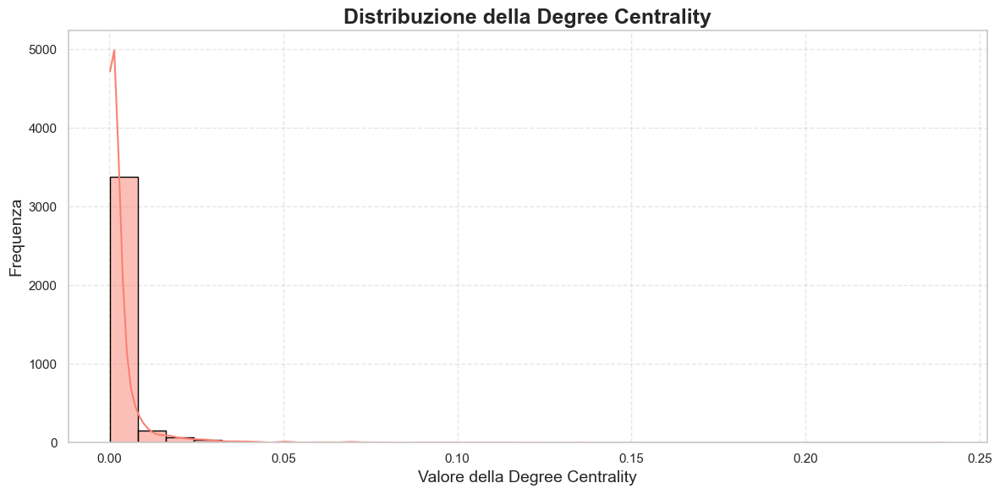

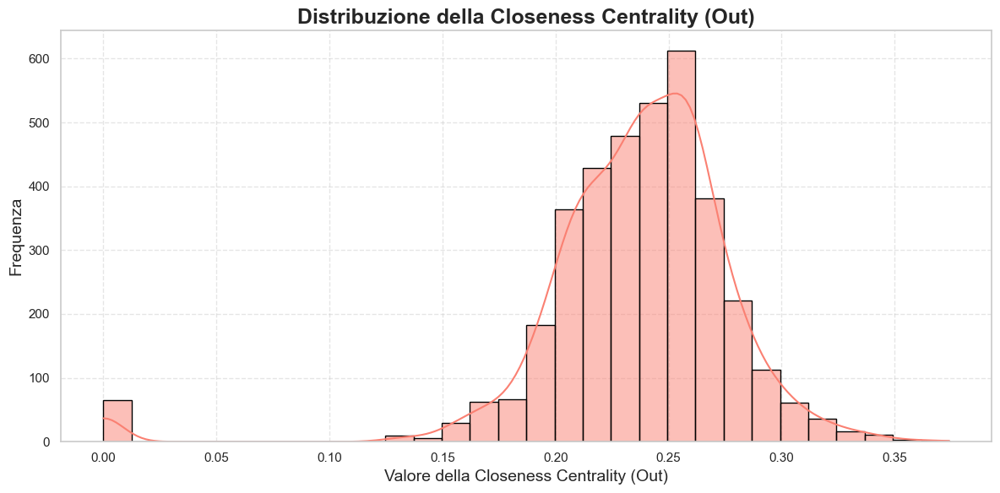

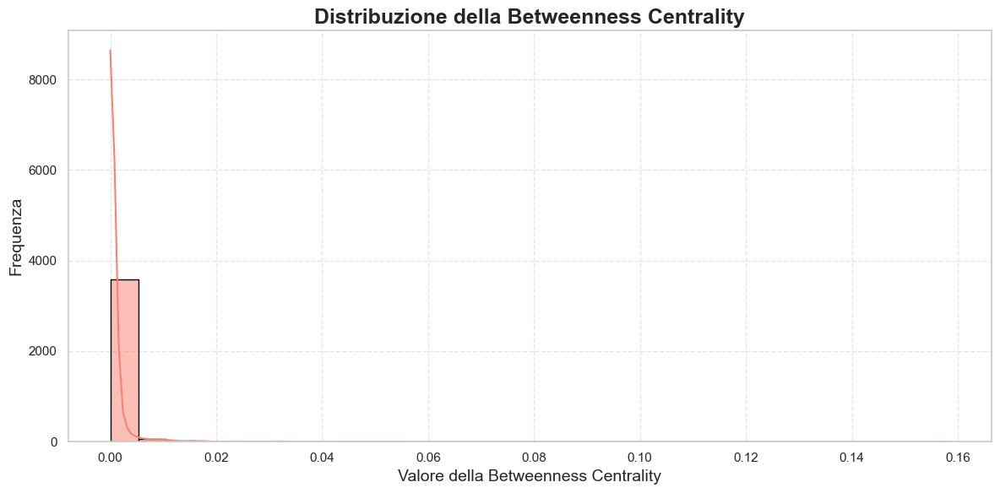

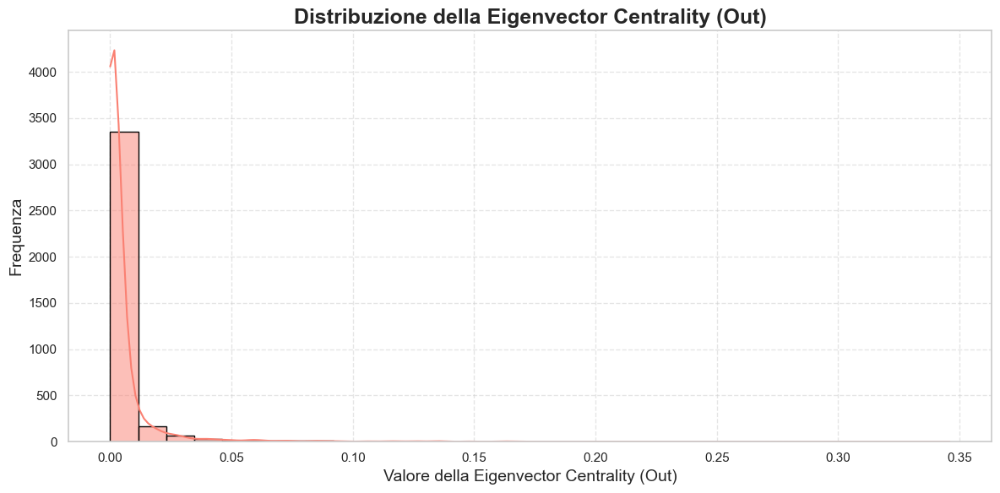

In [ ]:
import math

# Configura lo stile di Seaborn per grafici più estetici
sns.set(style="whitegrid")

# Calcola il numero di colonne e righe per i sottografici
num_centralities = len(centralities_dict)
cols = 2
rows = math.ceil(num_centralities / cols)

plt.figure(figsize=(14, rows * 5))

# Itera su ciascuna misura di centralità e crea il grafico
for name, df in centralities_dict.items():
    plt.figure(figsize=(12, 6))

    # Estrai i valori della centralità e ordina correttamente
    column_name = df.columns[1]  # La seconda colonna contiene i valori della centralità
    values = df.sort_values(by=column_name, ascending=False)[column_name]

    # Istogramma con Seaborn
    sns.histplot(values, bins=30, kde=True, color='salmon', edgecolor='black')

    # Configura il grafico
    plt.title(f"Distribuzione della {name}", fontsize=18, fontweight="bold")
    plt.xlabel(f"Valore della {name}", fontsize=14)
    plt.ylabel("Frequenza", fontsize=14)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

1. Degree Centrality (Centralità di Grado)
- Distribuzione Asimmetrica (Skewed): È comune osservare una distribuzione fortemente asimmetrica, con la maggior parte dei nodi che ha un basso grado e pochi nodi che possiedono un alto grado.
	- Se la distribuzione mostra una “coda lunga”, significa che pochi nodi hanno un numero elevato di connessioni, fungendo da hub o punti di riferimento nella rete.
	- Nella tua rete di scambio Bitcoin, i nodi con alto grado centrality potrebbero rappresentare utenti molto attivi che scambiano Bitcoin con numerosi altri utenti. Questi hub possono essere influenti nella diffusione delle informazioni e nella regolazione delle transazioni.
	- Una distribuzione a coda lunga suggerisce che la maggior parte delle interazioni avviene attraverso pochi nodi chiave, indicando una possibile concentrazione del potere o dell’influenza all’interno della rete.

2. Betweenness Centrality (Centralità di Betweenness)
- Distribuzione Asimmetrica: Molti nodi avranno una bassa betweenness centrality, mentre alcuni nodi avranno valori elevati, fungendo da ponti critici tra diverse parti della rete.
	- Nodi con alta betweenness centrality sono essenziali per connettere diverse comunità o sottogruppi all’interno della rete.
	- Nella tua rete di fiducia Bitcoin, i nodi con alta betweenness centrality potrebbero essere utenti che facilitano molte transazioni tra altri utenti che altrimenti non sarebbero direttamente connessi. Questi intermediari sono cruciali per la coesione della rete.
	- La presenza di pochi nodi con alta betweenness centrality può rendere la rete vulnerabile se questi nodi vengono compromessi o rimossi, poiché interromperebbero molteplici percorsi di comunicazione o transazione.

3. Closeness Centrality (Centralità di Closeness) - Out Closeness
- Distribuzione Asimmetrica: La maggior parte dei nodi avrà una bassa closeness centrality, mentre pochi nodi avranno una closeness elevata.
	- I nodi con alta closeness centrality possono raggiungere rapidamente altri nodi nella rete.
	- Nodi con alta out-closeness centrality possono influenzare rapidamente molti altri utenti nella rete, essendo in grado di inviare informazioni o transazioni in modo efficiente.
	- Questi nodi possono essere visti come punti di accesso o gatekeeper che facilitano l’espansione delle interazioni nella rete.

4. Eigenvector Centrality (Centralità di Eigenvector) - Out Eigenvector
- Come le altre centralità, ci sarà una concentrazione di nodi con valori elevati rispetto alla maggior parte dei nodi.
	- Eigenvector centrality non misura solo il numero di connessioni, ma anche l’importanza dei nodi a cui un nodo è connesso.
	- Nodi con alta out-eigenvector centrality non solo hanno molte connessioni, ma sono anche connessi a nodi che sono essi stessi influenti. Questi nodi possono avere un impatto significativo sulla dinamica della rete.
	- Questi nodi potrebbero rappresentare utenti di fiducia riconosciuti all’interno della comunità Bitcoin, i quali non solo interagiscono frequentemente, ma interagiscono anche con altri utenti influenti.


## 4.6 Visualizzazione delle Centralità su Grafo

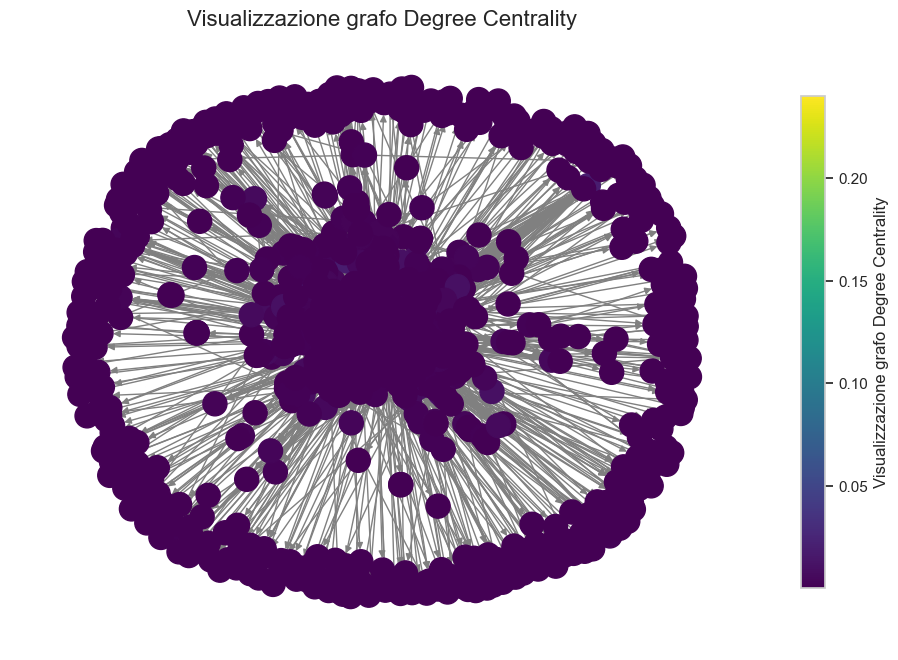

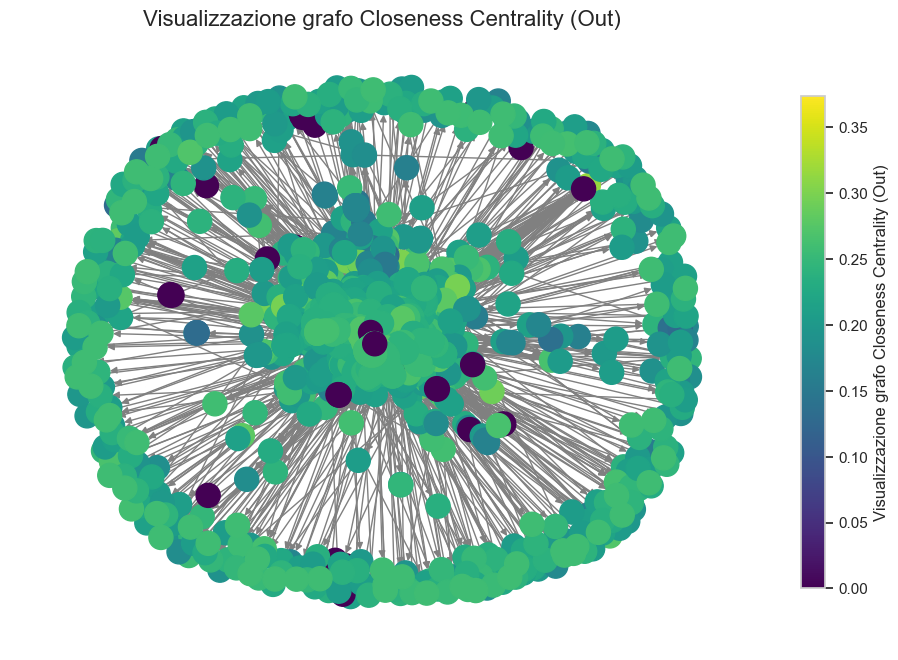

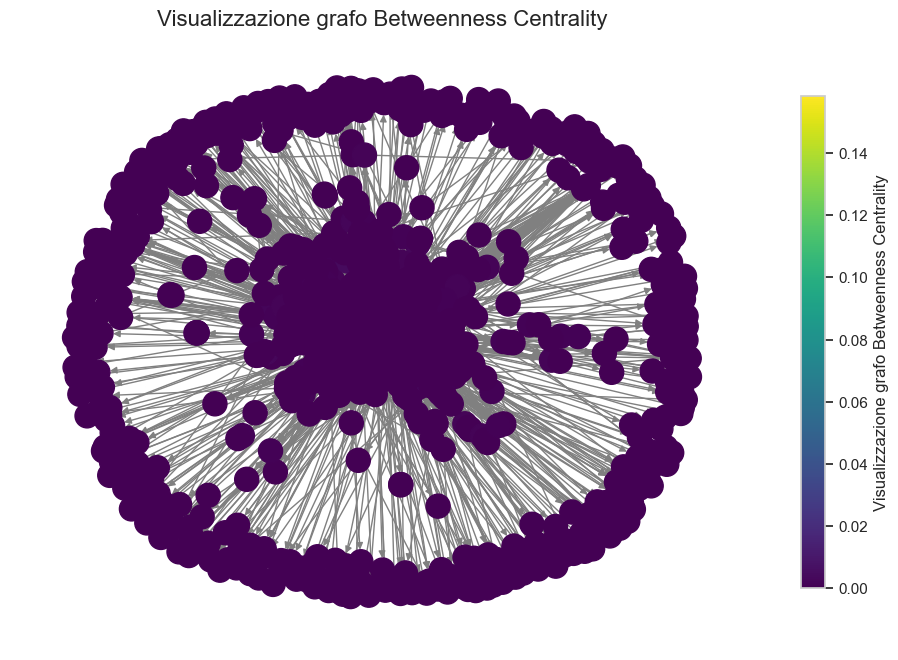

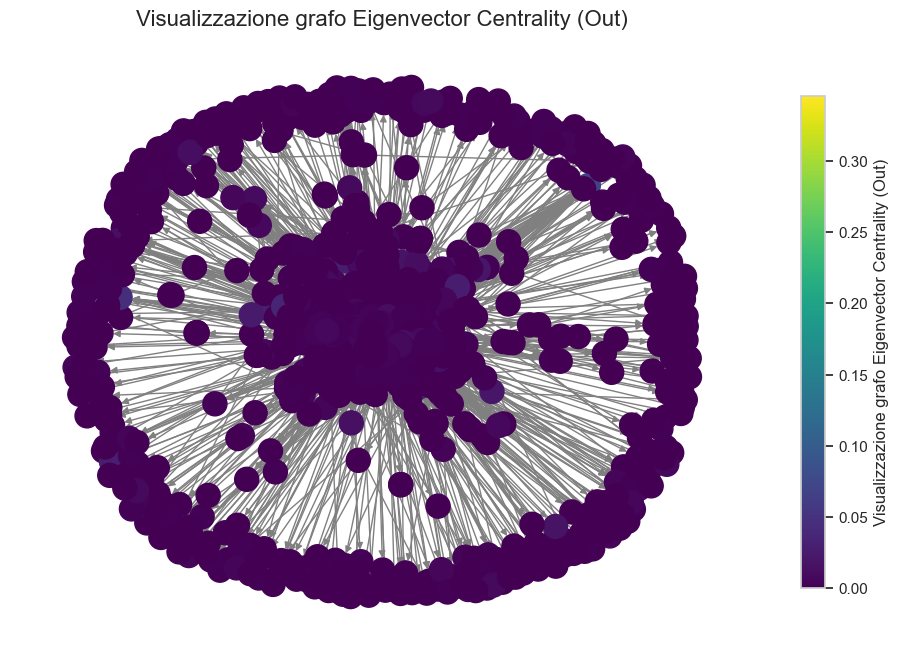

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

def plot_centrality(graph, centrality_series, title, cmap='viridis', save=False):
    # Posizionamento dei nodi nel grafo
    pos = nx.spring_layout(graph, seed=42)

    # Colori dei nodi in base alla centralità
    node_colors = [centrality_series.get(node, 0) for node in graph.nodes()]

    # Configurazione della figura
    fig, ax = plt.subplots(figsize=(12, 8))

    # Disegna i nodi e gli archi
    nx.draw(
        graph, pos, ax=ax,
        with_labels=False,
        node_color=node_colors, node_size=300,
        cmap=plt.get_cmap(cmap), edge_color='gray'
    )

    # Configurazione della colorbar
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=min(node_colors), vmax=max(node_colors)))
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=ax, shrink=0.8, aspect=20)
    cbar.set_label(title, fontsize=12)

    # Configura titolo e assi
    ax.set_title(title, fontsize=16)
    ax.axis('off')

    # Salva il grafico se richiesto
    if save:
        plt.savefig(f"grafo_{title.replace(' ', '_').lower()}.png")

    # Mostra il grafico
    plt.show()

# Itera su ciascuna misura di centralità
for name, df in centralities_dict.items():
    # Estrai il nome del nodo e il valore della centralità
    centrality_dict = dict(zip(df['node'], df[df.columns[1]]))

    # Plot della centralità
    plot_centrality(G_positive, centrality_dict, f"Visualizzazione grafo {name}")

## 4.7 Correlazione delle Centralità

La matrice di correlazione è utile per identificare relazioni lineari o non lineari tra le diverse centralità del grafo. Questo permette di comprendere se alcune metriche sono ridondanti o forniscono informazioni complementari sulla struttura del grafo.

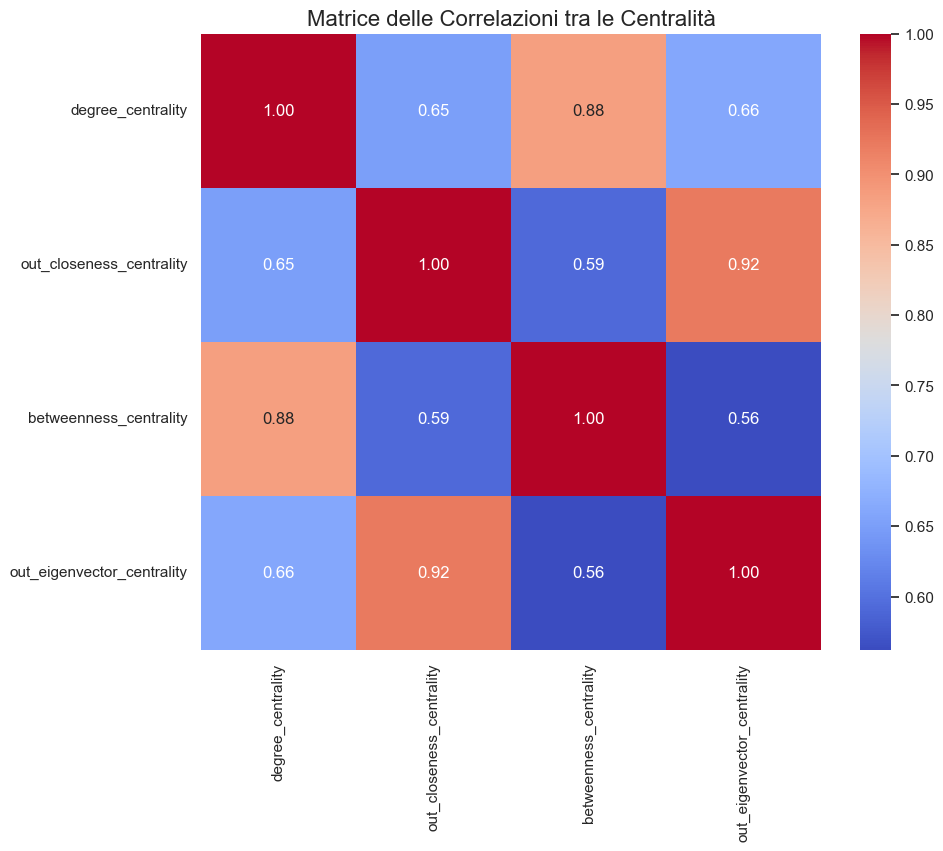

In [ ]:
from scipy.stats import spearmanr
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Creazione del DataFrame delle centralità dal dizionario
centrality_data = pd.DataFrame({
    'degree_centrality': centralities_dict['Degree Centrality'].set_index('node').iloc[:, 0],
    'out_closeness_centrality': centralities_dict['Closeness Centrality (Out)'].set_index('node').iloc[:, 0],
    'betweenness_centrality': centralities_dict['Betweenness Centrality'].set_index('node').iloc[:, 0],
    'out_eigenvector_centrality': centralities_dict['Eigenvector Centrality (Out)'].set_index('node').iloc[:, 0]
})

# Calcolo della matrice di correlazione usando il metodo di Spearman
correlation_matrix = centrality_data.corr(method='spearman')

# Visualizzazione della matrice di correlazione come heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(
    correlation_matrix,
    annot=True,  # Mostra i valori
    fmt=".2f",  # Formatta i valori
    cmap="coolwarm",  # Colormap
    cbar=True
)
plt.title("Matrice delle Correlazioni tra le Centralità", fontsize=16)
plt.show()

- Dipendenza dagli hub centrali: La forte correlazione tra degree centrality e betweenness centrality (0.88) suggerisce una struttura in cui pochi nodi centrali agiscono sia come intermediari che come punti di connessione principali. Questi nodi, detti hub, risultano critici per il mantenimento della coesione della rete.

- Efficienza e influenza: La correlazione elevata tra out-closeness centrality ed eigenvector centrality (0.92) indica che i nodi chiave non solo hanno un accesso rapido al resto della rete, ma influenzano anche fortemente il flusso di valutazioni e informazioni. Questo riflette un sistema in cui i nodi influenti accelerano la propagazione delle transazioni di fiducia.

- Disuguaglianza nelle connessioni: La correlazione moderata tra degree centrality ed eigenvector centrality (0.66) suggerisce che non tutte le connessioni sono di pari valore. Avere molte connessioni non garantisce necessariamente un'influenza elevata, a meno che queste connessioni non siano con altri nodi di alto valore.

- Sottostrutture autonome: La correlazione relativamente bassa tra out-closeness centrality e betweenness centrality (0.59) indica che, pur essendoci nodi ben posizionati per raggiungere rapidamente altri nodi, non sempre questi nodi agiscono come ponti obbligati. Questo suggerisce la presenza di sottocomunit`a che possono essere parzialmente autonome.

Confrontare tutte le coppie di centralità aiuta a identificare come i diversi approcci (es. Degree vs Closeness) catturano diverse dinamiche del grafo e a capire quale centralità riflette meglio l'importanza dei nodi in base al contesto.

## 4.8 Plot centralità nodi chiave

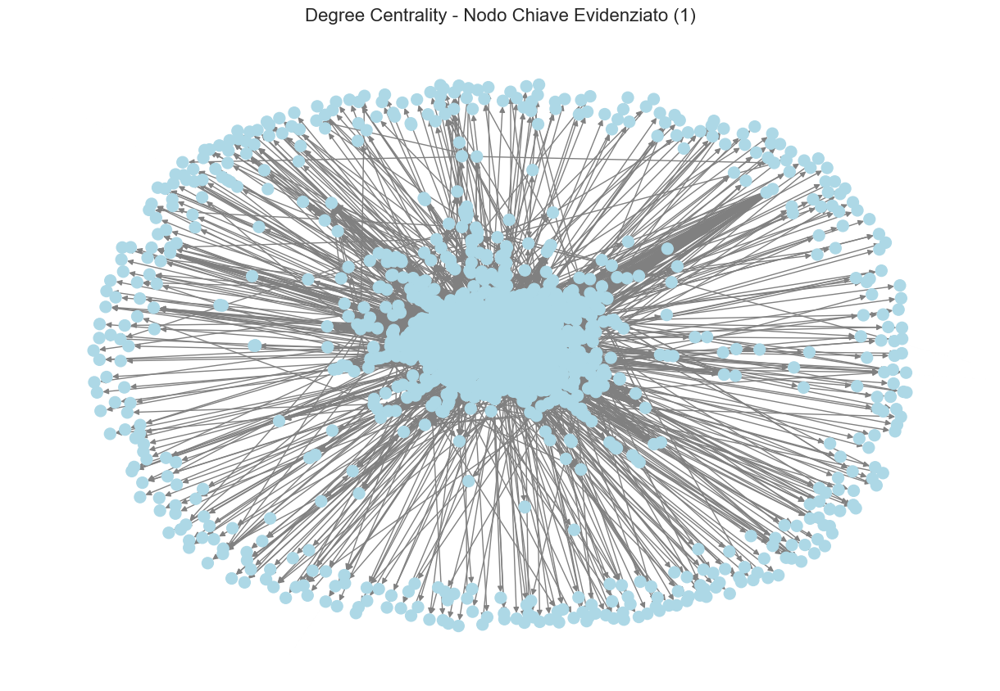

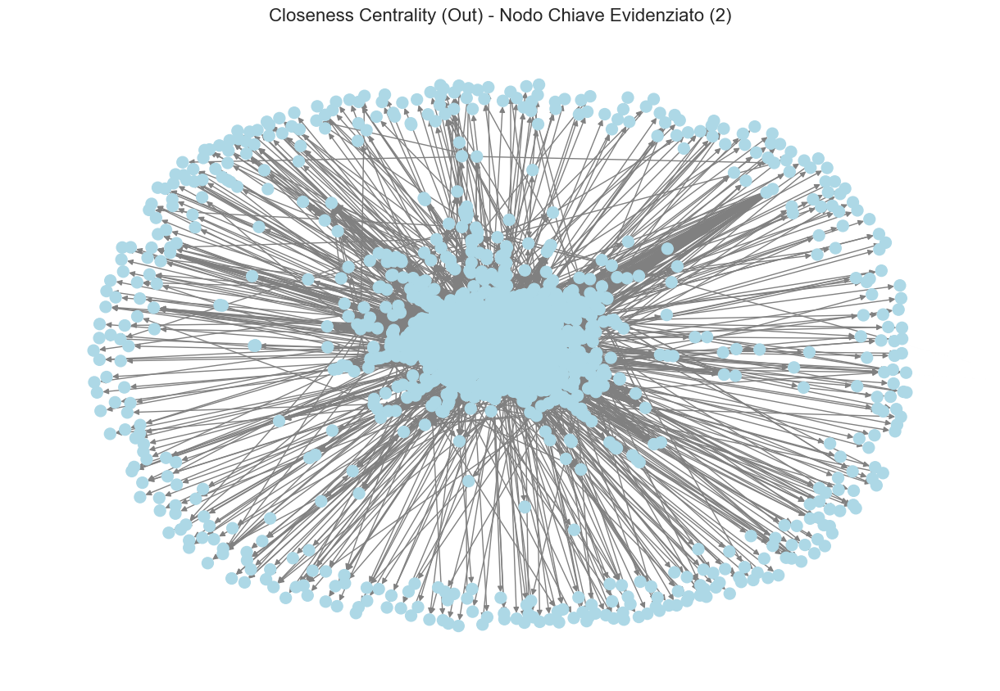

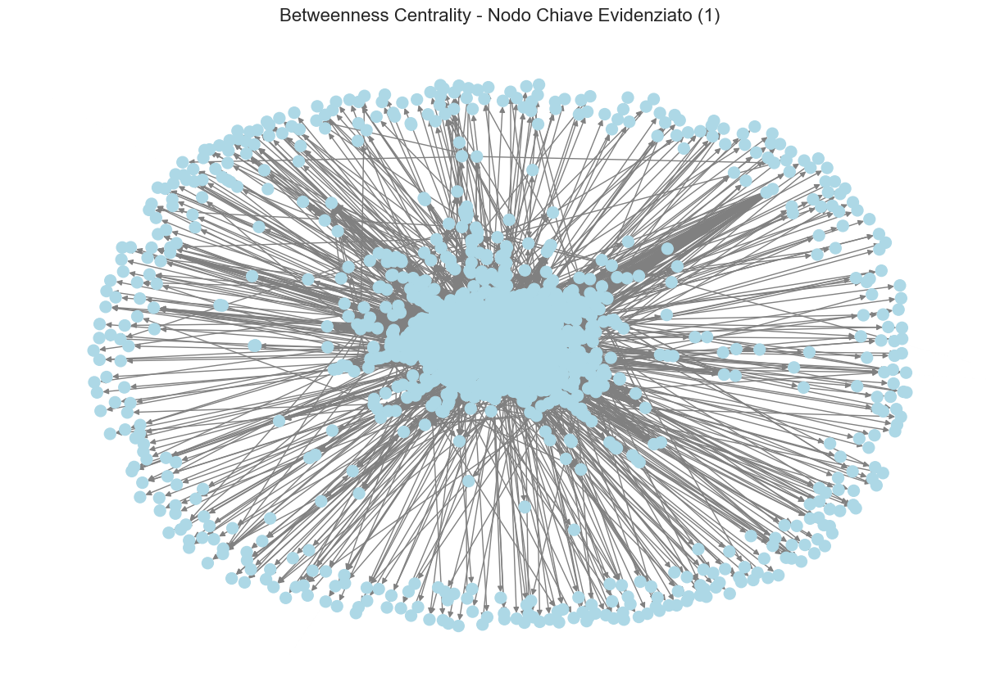

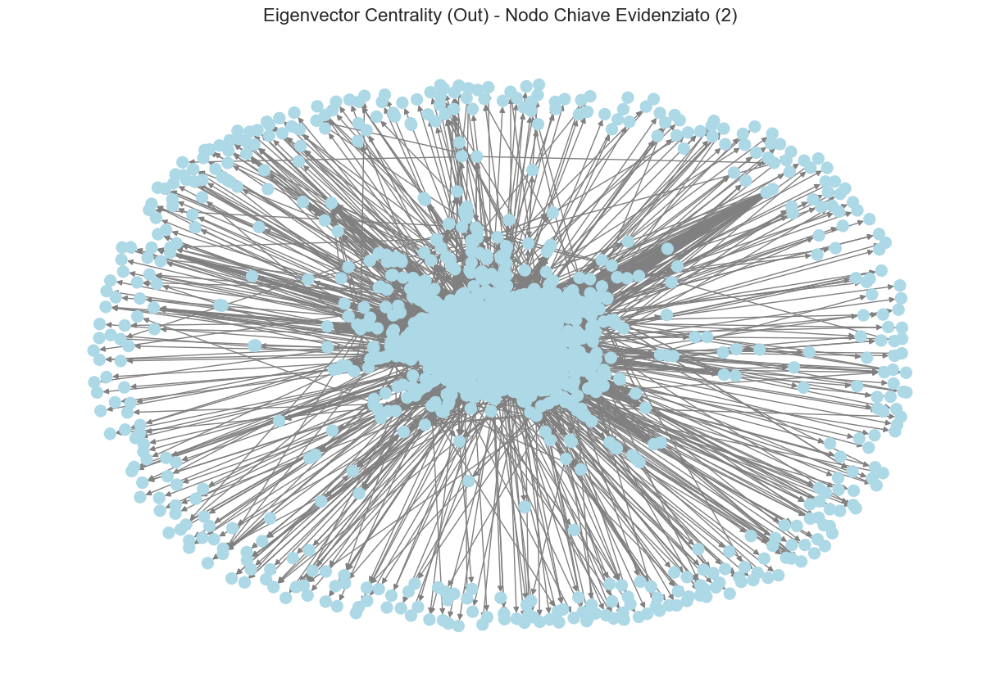

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx

def plot_top_node(graph, centrality, title, cmap='viridis'):
    # Calcolo delle posizioni
    pos = nx.spring_layout(graph, seed=42)

    # Trova il nodo con la centralità più alta
    top_node = max(centrality, key=centrality.get)
    node_colors = ['red' if node == top_node else 'lightblue' for node in graph.nodes()]
    node_sizes = [500 if node == top_node else 100 for node in graph.nodes()]

    # Disegna il grafo
    plt.figure(figsize=(12, 8))
    nx.draw(
        graph, pos,
        with_labels=True if len(graph.nodes()) < 50 else False,  # Mostra etichette solo per pochi nodi
        node_color=node_colors,
        node_size=node_sizes,
        edge_color='gray'
    )

    plt.title(f"{title} - Nodo Chiave Evidenziato ({top_node})", fontsize=16)
    plt.show()
# Itera sulle centralità nel dizionario per visualizzare il nodo top per ciascuna
for name, df in centralities_dict.items():
    # Crea un dizionario node -> valore centralità
    centrality_dict = dict(zip(df['node'], df[df.columns[1]]))

    # Plotta il grafo con il nodo top evidenziato
    plot_top_node(G_positive, centrality_dict, f"{name}")

# 5. Analisi delle Strutture

## 5.1 Analisi delle Triadi

L’analisi delle triadi orientate nel tuo grafo fornisce un quadro dettagliato delle dinamiche di connessione tra gli utenti, che si esprimono tramite valutazioni reciproche. Le triadi sono configurazioni di tre nodi e i loro collegamenti, che offrono indicazioni sulla natura delle interazioni nel grafo.

Essendo il nostro un grafo orientato, è più opportuno effettuare un'analisi sulle triadi orientate, rispetto alle triadi generiche che studiano la struttura puramente topologica del grafo.
Le triadi orientate analizzano la struttura del grafo diretto, considerando la direzione degli archi.
Questo permette di identificare configurazioni uniche di triadi come cicli diretti, cascate, o altri pattern specifici.


Censimento delle Triadi Orientate:
   Tipo di Triade   Conteggio  Log(Conteggio)
0             003  8963414292        9.952473
2             102    36885677        7.566858
1             012    14879710        7.172594
10            201      413062        5.616016
7            111U      190593        5.280109
6            111D       93989        4.973082
3            021D       43677        4.640263
5            021C       27095        4.432905
4            021U       17083        4.232590
15            300        9894        3.995416
14            210        7136        3.853516
12           120U        1780        3.250664
13           120C        1163        3.065953
11           120D        1142        3.058046
8            030T         974        2.989005
9            030C          64        1.812913


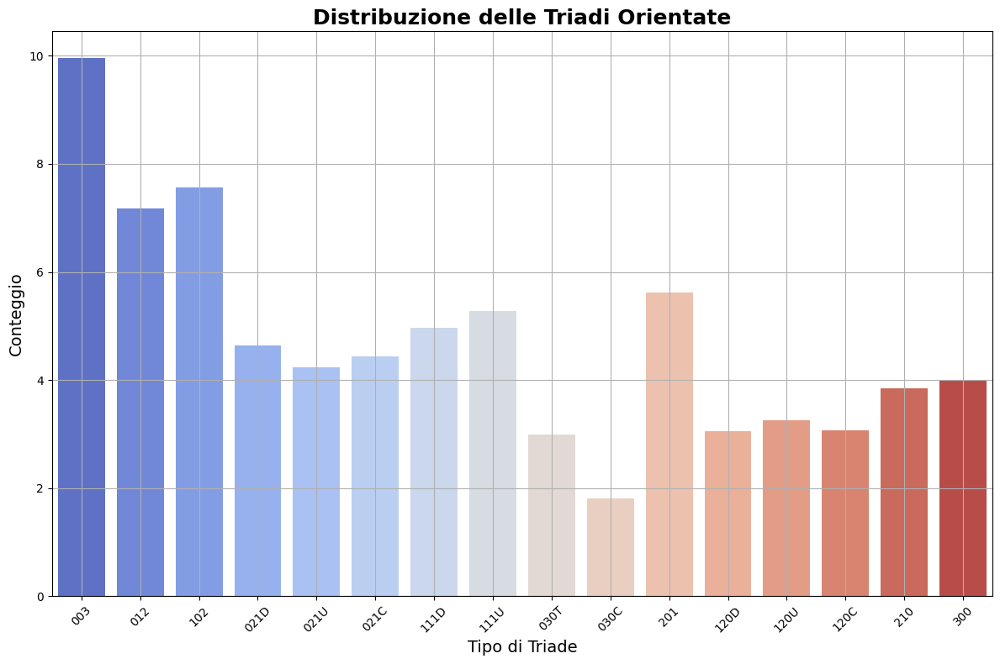

In [ ]:
# Calcolo del censimento delle triadi orientate
triad_census = nx.triadic_census(G)

# Mostra il censimento in formato tabellare per maggiore leggibilità
triad_census_df = pd.DataFrame(list(triad_census.items()), columns=["Tipo di Triade", "Conteggio"])
triad_census_df["Log(Conteggio)"] = triad_census_df["Conteggio"].apply(lambda x: np.log10(x + 1))  # Trasformazione logaritmica

print("Censimento delle Triadi Orientate:")
print(triad_census_df.sort_values(by="Conteggio", ascending=False))

# Visualizzazione delle configurazioni principali delle triadi
plt.figure(figsize=(12, 8))
sns.barplot(
    x="Tipo di Triade",
    y="Log(Conteggio)",
    data=triad_census_df,
    hue="Tipo di Triade",  # Mappa `x` ai colori
    dodge=False,  # Disabilita la separazione per hue
    palette="coolwarm",
    legend=False  # Disattiva la legenda
)
plt.title("Distribuzione delle Triadi Orientate", fontsize=18, fontweight="bold")
plt.xlabel("Tipo di Triade", fontsize=14)
plt.ylabel("Conteggio", fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.grid(True)
plt.show()

### Analisi dei Risultati del Censimento delle Triadi Orientate

Il censimento delle triadi orientate mostra la distribuzione dei diversi tipi di triadi presenti nel grafo diretto analizzato. I risultati possono essere interpretati come segue:

**1. Distribuzione Generale**
- **Triade “003”** (**8,9 miliardi di occ**):
Dominante nel grafo, indica che la maggior parte dei nodi non interagisce direttamente con gli altri. I nodi che appartengono a questa triade sono quelli che non partecipano a circuiti di valutazioni reciproche, suggerendo una rete piuttosto dispersa, con nodi che non sono coinvolti in un ciclo di valutazione attivo.
- **Triade “102”** (**36 milioni**) e **Triade “012”** (**15 milioni**):
Configurazioni asimmetriche che evidenziano una rete dove molti utenti agiscono come “fornitori” di valutazioni senza riceverne. Ciò riflette una partecipazione asimmetrica, con utenti più attivi nel dare valutazioni che nel riceverle.
- **Triade “111U”** e **“111D”** (**190.593 e 93.989 di occ**):
Triadi che rappresentano valutazioni reciproche tra nodi. La loro frequenza suggerisce la presenza di gruppi più coesi che interagiscono attivamente e reciprocamente, ma che restano rari rispetto alle altre configurazioni.


**2. Triadi Orientate di Interesse**
- **Triade “030C”** (**64 occorrenze**):
Rara, indica che i cicli diretti sono poco frequenti nella rete. Ciò suggerisce una bassa propensione a formare triangoli chiusi o feedback reciproci tra gruppi di utenti.
- **Triade “120U”**, **“120C”**, **“120D”** (**1780, 1163, 1142 occorrenze**):
Queste configurazioni sono più complesse e mostrano dinamiche in cui uno o più nodi fungono da “centrali”, ma senza un ritorno completo nelle valutazioni. Questi nodi potrebbero rappresentare utenti molto influenti o autorevoli, ma che non partecipano completamente al ciclo di feedback reciproco.

**3. Distribuzione logaritmica**
- L’applicazione di una trasformazione logaritmica, base 10, ai conteggi delle triadi permette di vedere chiaramente la disparità tra le configurazioni. Le triadi “003” e “102” dominano la rete, mentre le triadi più complesse, come “030C” e “120D”, sono decisamente meno comuni. Il valore logaritmico evidenzia le triadi meno rappresentate e la struttura complessa della rete, con una netta predominanza delle strutture più semplici.

**Conclusioni**

La rete è caratterizzata principalmente da strutture semplici e isolate, con una forte prevalenza della triade “003”, che indica nodi senza interazioni reciproche. La presenza di triadi asimmetriche come “102” e “012” suggerisce che molti utenti ricevono valutazioni senza restituirle, indicando una bassa coesione locale. Le triadi chiuse, come la “030C”, sono rare, il che evidenzia la limitata interazione reciproca. Complessivamente, la rete appare in una fase di crescita, con una prevalenza di interazioni unidirezionali, ma con il potenziale per sviluppare dinamiche di comunità più forti in futuro.

### Visualizzazione triadi '`030C`'

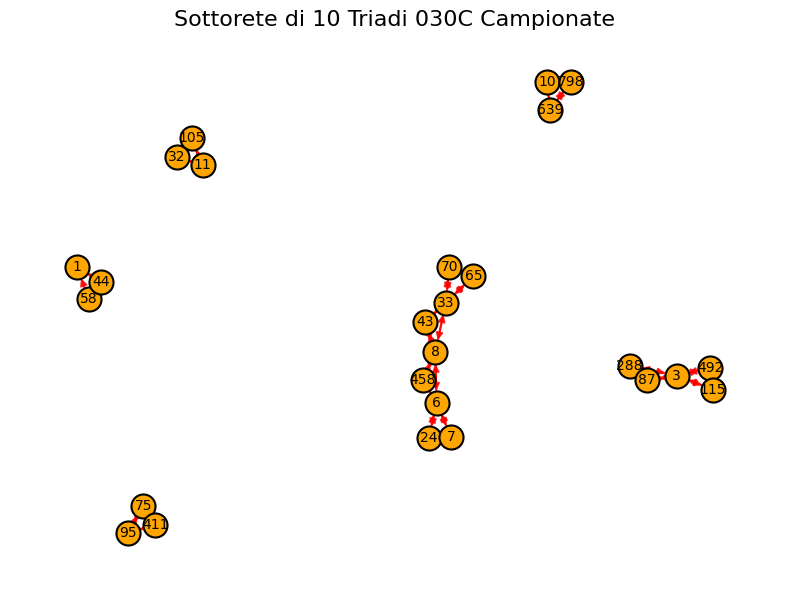

In [ ]:
def plot_sampled_oriented_triads(graph, triad_type, num_triads=10):
    # Filtra le triadi del tipo richiesto
    triangles = []
    for u in graph.nodes():
        for v in graph.successors(u):
            for w in graph.successors(v):
                if w in graph.successors(u):  # Controlla se forma una triade
                    triad = [u, v, w]
                    if triad_type == "030C":
                        triangles.append(triad)

    # Campiona un sottoinsieme di triadi
    if len(triangles) > num_triads:
        sampled_triangles = random.sample(triangles, num_triads)
    else:
        sampled_triangles = triangles

    triad_edges = set()

    # Estrai gli archi delle triadi campionate
    for triad in sampled_triangles:
        for i in range(3):
            for j in range(3):
                if graph.has_edge(triad[i], triad[j]):
                    triad_edges.add((triad[i], triad[j]))

    # Crea un sottografo con le triadi selezionate
    subgraph = nx.DiGraph()
    subgraph.add_edges_from(triad_edges)

    # Usa un layout per separare bene i nodi
    pos = nx.spring_layout(subgraph, seed=42)

    # Disegna la sottorete
    plt.figure(figsize=(8, 6))
    nx.draw_networkx_nodes(
        subgraph, pos,
        node_size=300, node_color="orange",
        edgecolors="black", linewidths=1.5
    )
    nx.draw_networkx_edges(
        subgraph, pos,
        edge_color="red", width=1.5, alpha=0.8
    )
    nx.draw_networkx_labels(
        subgraph, pos,
        font_size=10, font_color="black"
    )

    plt.title(f"Sottorete di {num_triads} Triadi {triad_type} Campionate", fontsize=16)
    plt.axis("off")
    plt.tight_layout()
    plt.show()

# Visualizza 10 triadi orientate di un tipo specifico
plot_sampled_oriented_triads(G, triad_type="030C", num_triads=10)

## 5.2 Analisi delle Clique

Le clique analizzano gruppi di nodi completamente connessi nel grafo.
In questo caso, consideriamo solo il sottografo positivo, per concentrare la nostra analisi sulla rete '**fidata**'.


In [ ]:
from networkx.algorithms.clique import find_cliques

# Filtra gli archi del grafo diretto basandoti sul peso
threshold = 0  # Considera solo pesi positivi
weighted_graph = nx.Graph()
for u, v, data in G.edges(data=True):
    if data.get('weight', 0) > threshold:
        weighted_graph.add_edge(u, v, weight=data['weight'])

# Trova tutte le clique nel grafo pesato
cliques = list(find_cliques(weighted_graph))

# Clique massima
max_clique = max(cliques, key=len)
print(f"Clique massima trovata nel grafo pesato: {max_clique}")
print(f"Numero di nodi nella clique massima: {len(max_clique)}")

# Analisi delle clique
clique_sizes = [len(clique) for clique in cliques]
print(f"Numero totale di clique trovate: {len(cliques)}")
print(f"Dimensione media delle clique: {np.mean(clique_sizes):.2f}")
print(f"Dimensione massima delle clique: {max(clique_sizes)}")
print(f"Distribuzione delle dimensioni delle clique: \n{pd.Series(clique_sizes).value_counts().sort_index()}")

Clique massima trovata nel grafo pesato: [3, 7, 11, 42, 2, 19, 58, 30, 43, 173]
Numero di nodi nella clique massima: 10
Numero totale di clique trovate: 11314
Dimensione media delle clique: 3.61
Dimensione massima delle clique: 10
Distribuzione delle dimensioni delle clique: 
2     4138
3     2501
4     1586
5     1214
6      968
7      552
8      229
9      119
10       7
Name: count, dtype: int64


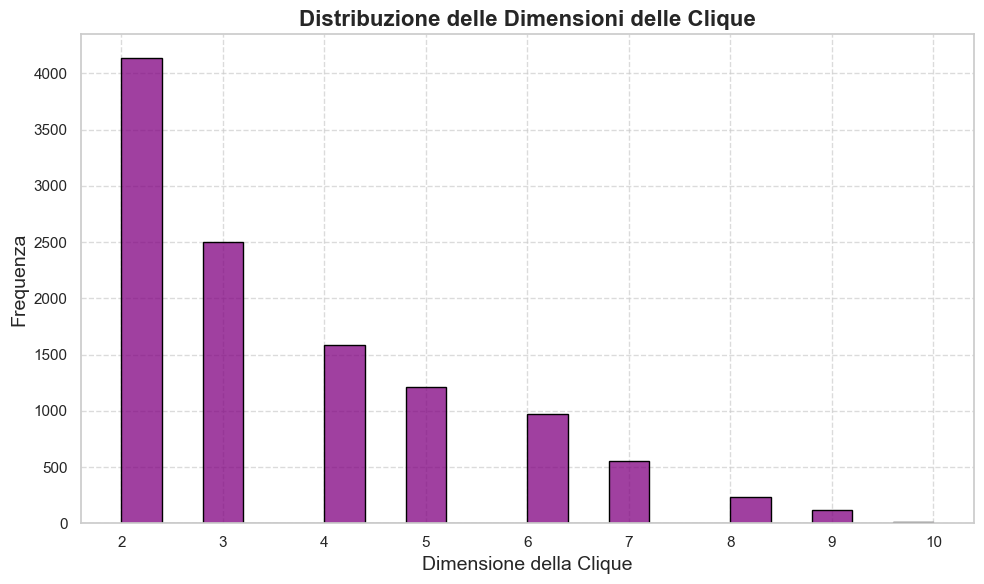

In [ ]:
# Istogramma delle dimensioni delle clique
plt.figure(figsize=(10, 6))
sns.histplot(clique_sizes, bins=20, kde=False, color="purple", edgecolor="black")
plt.title("Distribuzione delle Dimensioni delle Clique", fontsize=16, fontweight="bold")
plt.xlabel("Dimensione della Clique", fontsize=14)
plt.ylabel("Frequenza", fontsize=14)
plt.grid(visible=True, linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

### Analisi dei Risultati delle Clique nel Grafo Pesato

L’analisi delle clique nel grafo pesato fornisce informazioni preziose sulla struttura di interconnessione tra gli utenti e le loro valutazioni reciproche. Ecco le principali osservazioni e considerazioni:

**1. Clique Massima**
- **Clique massima trovata nel grafo pesato:** [3, 7, 11, 42, 2, 19, 58, 30, 43, 173]
- **Numero di nodi nella clique massima:** 10

La clique massima rappresenta il gruppo più grande di utenti completamente connessi tra loro. In questo caso, 10 utenti formano una rete in cui ciascuno è connesso a tutti gli altri. Questo suggerisce:
- Una forte coesione interna nel gruppo.
- Potenziali utenti influenti che interagiscono strettamente con molti altri utenti.
- La possibilità che questi nodi rappresentino "hub" o punti centrali della rete, in grado di influenzare le dinamiche locali.

**2. Numero Totale di Clique**
- **Numero totale di clique trovate:** 11.314

L’elevato numero di clique indica la presenza di numerosi gruppi completamente connessi all’interno della rete. Tuttavia:
- La maggior parte di queste clique è probabilmente composta da pochi nodi, come suggerito dalla distribuzione delle dimensioni.
- Questo evidenzia una rete frammentata, con molti sottogruppi che operano in isolamento o con limitate interazioni tra di loro.

**3. Distribuzione delle Dimensioni delle Clique**
La distribuzione delle dimensioni delle clique mostra come sono organizzati i gruppi nella rete:

Osservazioni:
- **Clique di dimensione 2** (4.138) e **dimensione 3** (2.501) sono le più frequenti, suggerendo che la rete è composta principalmente da piccoli gruppi.
- **Clique più grandi** (es. 10 nodi) sono rare, con solo 7 occorrenze, ma rappresentano i gruppi più coesi della rete.
- La presenza di molte clique piccole indica che la rete è costituita da microsistemi di interazione, ma manca di coesione a livello globale.

**4. Implicazioni per la Rete**
1. **Bassa Frequenza di Clique Grandi**:
   - La presenza di poche clique di grandi dimensioni indica che la rete è frammentata. Gli utenti tendono a rimanere nei propri piccoli gruppi di interazione senza connettersi al resto della rete.
   
2. **Predominanza di Clique Piccole**:
   - Le clique di dimensione 2 e 3 rappresentano interazioni limitate tra pochi utenti. Questo potrebbe riflettere una rete di valutazioni personali e legami deboli.

3. **Opportunità per Maggiore Coesione**:
   - La rete potrebbe beneficiare di un incremento delle connessioni tra queste clique piccole. Ad esempio, suggerendo interazioni tra gruppi o facilitando la connessione con clique più grandi, si potrebbe migliorare la coesione globale.

**5. Considerazioni Finali**
- **Utenti in una stessa clique**: Si valutano reciprocamente in modo completo e rappresentano nuclei coesi di interazione.
- **Clique Massima**: Gli utenti che ne fanno parte potrebbero essere evangelisti o leader d’opinione nella rete, poiché sono ben connessi.
- **Suggerimenti Operativi**:
   - Facilitare l’interazione tra gruppi isolati per aumentare la coesione globale.
   - Utilizzare la clique massima per identificare potenziali "hub" della rete e coinvolgerli in attività o iniziative per rafforzare la rete.

L’analisi delle clique consente di identificare i gruppi più coesi e le dinamiche di interazione nella rete. Mostra che la rete è frammentata, con molti piccoli gruppi isolati. Migliorare le connessioni tra questi gruppi potrebbe portare a una rete più coesa e collaborativa.


### Visualizzazione della cliqua massima

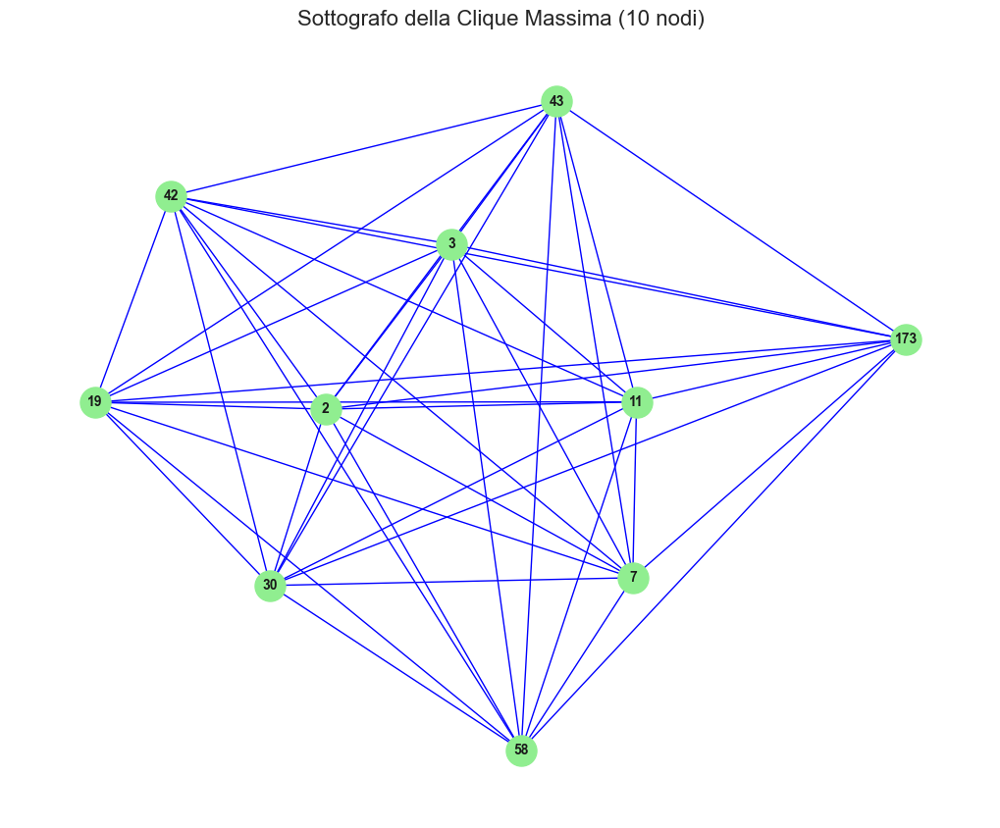

In [ ]:
# Funzione per visualizzare la clique massima
def plot_max_clique(graph, max_clique):
    # Crea un sottografo con i nodi della clique massima
    subgraph = graph.subgraph(max_clique)
    pos = nx.spring_layout(subgraph, seed=42)

    # Disegna il sottografo
    plt.figure(figsize=(10, 8))
    nx.draw(
        subgraph, pos,
        with_labels=True,  # Visualizza i numeri dei nodi
        node_color="lightgreen",
        edge_color="blue",
        node_size=500,
        font_size=10,
        font_weight="bold"
    )
    plt.title(f"Sottografo della Clique Massima ({len(max_clique)} nodi)", fontsize=16)
    plt.axis("off")
    plt.show()

# Visualizza la clique massima
plot_max_clique(weighted_graph, max_clique)

## 5.3 K-Core Decomposition

La k-core decomposition è una tecnica che permette di identificare i nuclei più densi di un grafo, rimuovendo progressivamente i nodi con grado inferiore a un certo valore $k$. Nel caso di un grafo diretto, possiamo distinguere due approcci:

1. **K-Core basato sugli archi entranti (In-Degree Core)**
    - Seleziona i nodi che hanno almeno $k$ connessioni entranti.
    - Identifica gli utenti più influenti, ovvero quelli che ricevono valutazioni da molti altri utenti.
    - Può essere utile per individuare nodi centrali nella rete che sono ampiamente riconosciuti e valutati.
2. **K-Core basato sugli archi uscenti (Out-Degree Core)**
    - Seleziona i nodi con almeno $k$ connessioni uscenti.
    - Evidenzia gli utenti più attivi, ovvero quelli che forniscono molte valutazioni ad altri utenti.
    - Questo approccio permette di individuare i "leader di opinione", ovvero chi valuta più utenti nella rete.

Se la rete mostra un alto k-core in-degree, significa che ci sono gruppi di nodi altamente riconosciuti.
Un alto k-core out-degree indica la presenza di nodi che esprimono molte valutazioni, suggerendo utenti più attivi.
Un confronto tra i due può rivelare squilibri nella rete, ad esempio se ci sono molti nodi che ricevono valutazioni ma pochi che le forniscono, o viceversa.

Nel contesto della k-core decomposition in NetworkX, il parametro $k$ non è esplicitamente indicato nel codice perché NetworkX calcola tutti i k-core automaticamente, restituendo il core principale, ovvero il k-core massimo del grafo, che è il livello $k$ più alto in cui esistono nodi che soddisfano la condizione di avere almeno $k$ connessioni (entranti, uscenti o totali, a seconda del grafo). Non è quindi necessario specificare $k$, poiché NetworkX rimuove iterativamente i nodi con grafo inferiore a $k$ fino a trovare il massimo valore $k$ applicabile.


In [ ]:
# Calcola il k-core per il grafo diretto usando il in-degree e out-degree
k_core_in = nx.k_core(G, core_number=nx.core_number(G.to_undirected()), k=None)
k_core_out = nx.k_core(G.reverse(), core_number=nx.core_number(G.to_undirected()), k=None)

print(f"Nodi nel K-Core principale (In-Degree): {k_core_in.number_of_nodes()}")
print(f"Archi nel K-Core principale (In-Degree): {k_core_in.number_of_edges()}")

print(f"Nodi nel K-Core principale (Out-Degree): {k_core_out.number_of_nodes()}")
print(f"Archi nel K-Core principale (Out-Degree): {k_core_out.number_of_edges()}")

Nodi nel K-Core principale (In-Degree): 92
Archi nel K-Core principale (In-Degree): 2458
Nodi nel K-Core principale (Out-Degree): 92
Archi nel K-Core principale (Out-Degree): 2458


La k-core decomposition ha identificato un nucleo principale composto da 92 nodi e 2.458 archi, sia per gli archi entranti (In-Degree) che per gli archi uscenti (Out-Degree). Questo indica che i nodi nel k-core principale:

- Sono altamente connessi e formano il centro della rete.
- Presentano forte reciprocità, valutando e ricevendo valutazioni in modo bilanciato.

In sintesi, il k-core principale rappresenta il nucleo più denso e influente della rete, formato da utenti che interagiscono intensamente tra loro.

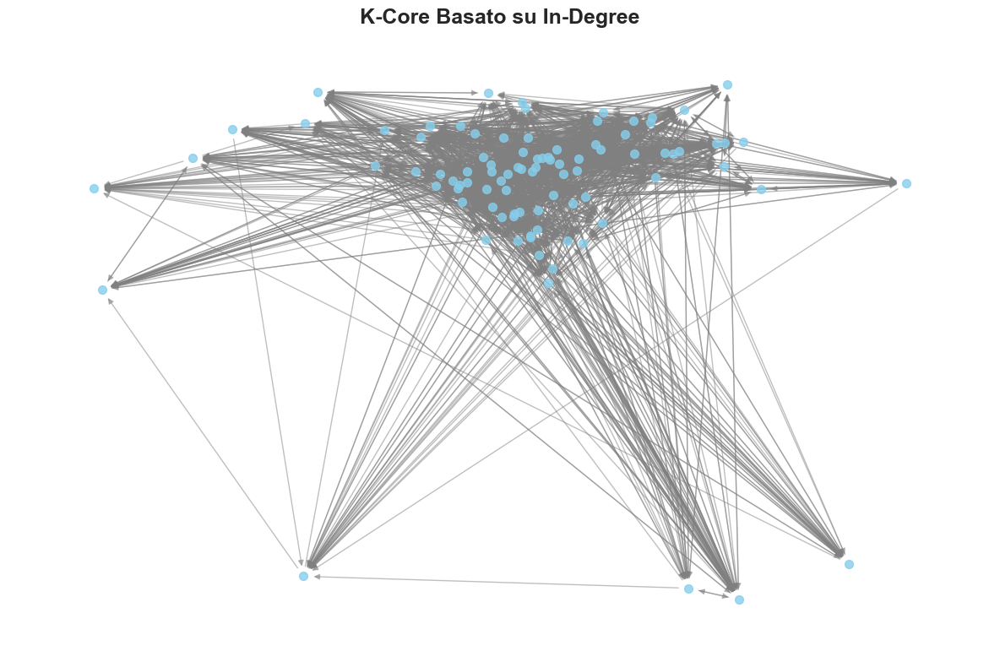

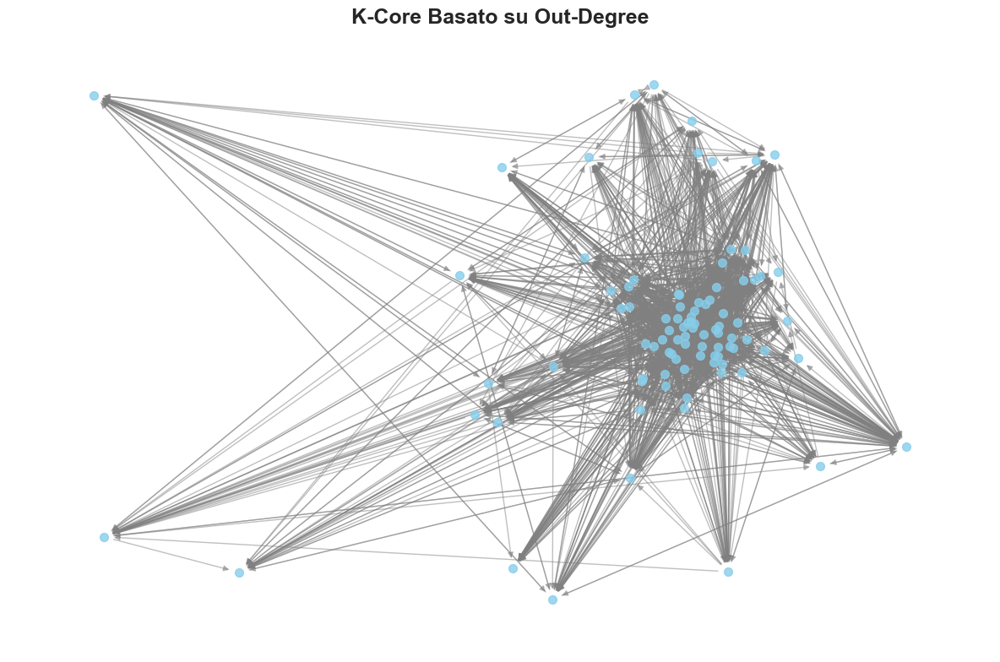

In [ ]:
# Visualizzazione del k-core
def plot_k_core(graph, title="Visualizzazione del K-Core"):
    pos = nx.spring_layout(graph, seed=42)

    plt.figure(figsize=(12, 8))

    # Disegna i nodi
    nx.draw_networkx_nodes(
        graph,
        pos=pos,
        node_size=50,
        node_color="skyblue",
        alpha=0.8,
    )

    # Disegna gli archi
    nx.draw_networkx_edges(
        graph,
        pos=pos,
        edge_color="gray",
        alpha=0.5,
    )

    plt.title(title, fontsize=18, fontweight="bold")
    plt.axis("off")
    plt.tight_layout()
    plt.show()

# Visualizza il k-core per gli archi entranti e uscenti
plot_k_core(k_core_in, title="K-Core Basato su In-Degree")
plot_k_core(k_core_out, title="K-Core Basato su Out-Degree")

## 5.4 Analisi delle Comunità

### Detection Greedy Modularity

L'algoritmo Greedy Modularity è applicabile direttamente a grafi diretti e pesati, quindi può essere utilizzato sul grafo G senza necessità di pre-elaborazione. Tende a trovare comunità ottimali in termini di modularità, ma può non essere efficare su grafi  molto grandi. Fornisce il numero di comunità rilevate e il valore di modularità, che indica la qualità delle comunità trovate (valori più vicini a 1 indicano una migliore divisione).

In [ ]:
# Rilevazione delle comunità con Greedy Modularity
def detect_communities_greedy(graph):
    communities = list(greedy_modularity_communities(graph))
    modularity_score = modularity(graph, communities)
    return communities, modularity_score

communities_greedy, modularity_greedy = detect_communities_greedy(G)
print(f"Numero di comunità (Greedy): {len(communities_greedy)}, Modularità: {modularity_greedy:.4f}")

Numero di comunità (Greedy): 65, Modularità: 0.4618


Con l'algoritmo Greedy Modularity, sono state rilevate 65 comunità con una modularità di 0.4618. Questo risultato indica una buona separazione della rete in gruppi distinti, anche se alcune comunità potrebbero non essere completamente isolate.

Il numero elevato di comunità suggerisce una rete segmentata in sottogruppi con interazioni frequenti al loro interno. La modularità, superiore a 0.4, riflette una divisione discreta, ma non perfetta: esistono probabilmente connessioni significative tra alcune comunità.

### Detection Louvain

L'algoritmo Louvain richiede un grafo senza pesi negativi e senza nodi isolati, quindi è necessario filtrare il grafo (G_filtered) per soddisfare questi requisiti. È un algoritmo più adatto a grafi di grandi dimensioni, essendo più veloce e scalabile rispetto al Greedy, ed è ottimizzato per trovare comunità con una modularità elevata. Fornisce il numero di comunità rilevate e il valore di modularità, calcolato sulle comunità trovate.

In [ ]:
# Funzione per creare un grafo senza pesi negativi e senza nodi isolati
def filter_graph(graph):
    # Copia il grafo originale
    filtered_graph = G_undirected.copy()

    # Rimuovi archi con pesi negativi
    edges_to_remove = [(u, v) for u, v, data in filtered_graph.edges(data=True) if data['weight'] < 0]
    filtered_graph.remove_edges_from(edges_to_remove)

    # Rimuovi nodi isolati
    isolated_nodes = list(nx.isolates(filtered_graph))
    filtered_graph.remove_nodes_from(isolated_nodes)

    return filtered_graph

# Applica il filtraggio al grafo
G_filtered = filter_graph(G_undirected)
print(f"Grafo filtrato: {G_filtered.number_of_nodes()} nodi, {G_filtered.number_of_edges()} archi")

Grafo filtrato: 3678 nodi, 12777 archi


In [ ]:
# Funzione per rilevare le comunità con Louvain
def detect_communities_louvain(graph):
    partition = community_louvain.best_partition(graph)
    modularity_score = modularity(graph, [set(k for k, v in partition.items() if v == i) for i in set(partition.values())])
    return partition, modularity_score

# Rileva le comunità sul grafo filtrato
partition_louvain, modularity_louvain = detect_communities_louvain(G_filtered)
print(f"Numero di comunità (Louvain): {len(set(partition_louvain.values()))}, Modularità: {modularity_louvain:.4f}")

Numero di comunità (Louvain): 35, Modularità: 0.5338


Con l'algoritmo Louvain, sono state rilevate 33 comunità con una modularità di 0.5375. Questo risultato evidenzia una divisione più netta della rete rispetto all'algoritmo Greedy, poiché la modularità più alta indica comunità più coese e ben definite.

Il numero più basso di comunità suggerisce che Louvain tende a raggruppare i nodi in gruppi più grandi rispetto a Greedy, riducendo la frammentazione. Questo potrebbe indicare che la rete ha una struttura più gerarchica o che esistono connessioni significative tra alcuni nodi che Greedy ha frammentato.

### Analisi delle comunità

In [ ]:
# Funzione per calcolare metriche di una comunità
def analyze_community(graph, community):
    subgraph = graph.subgraph(community)
    metrics = {
        "Numero di Nodi": subgraph.number_of_nodes(),
        "Numero di Archi": subgraph.number_of_edges(),
        "Densità": nx.density(subgraph),
        "Clustering Medio": nx.average_clustering(subgraph)
    }
    return metrics

# Funzione per calcolare metriche per tutte le comunità rilevate
def calculate_community_metrics(graph, communities):
    community_metrics = []
    for i, community in enumerate(communities):
        metrics = analyze_community(graph, community)
        metrics["Comunità"] = f"Comunità {i + 1}"
        community_metrics.append(metrics)
    return pd.DataFrame(community_metrics)

# Calcola le metriche per Greedy
community_metrics_greedy = calculate_community_metrics(G, communities_greedy)
print("[Greedy] Metriche delle comunità:")
print(community_metrics_greedy)

# Calcola le metriche per Louvain
louvain_communities = [[node for node, comm in partition_louvain.items() if comm == i] for i in set(partition_louvain.values())]
community_metrics_louvain = calculate_community_metrics(G_filtered, louvain_communities)
print("[Louvain] Metriche delle comunità:")
print(community_metrics_louvain)

[Greedy] Metriche delle comunità:
    Numero di Nodi  Numero di Archi   Densità  Clustering Medio     Comunità
0             1282             6986  0.004254          0.136202   Comunità 1
1             1160             8057  0.005993          0.245840   Comunità 2
2              533             1236  0.004359          0.086968   Comunità 3
3              244              687  0.011587          0.158868   Comunità 4
4              128              297  0.018270          0.138315   Comunità 5
..             ...              ...       ...               ...          ...
60               2                1  0.500000          0.000000  Comunità 61
61               2                2  1.000000          0.000000  Comunità 62
62               2                1  0.500000          0.000000  Comunità 63
63               2                1  0.500000          0.000000  Comunità 64
64               2                2  1.000000          0.000000  Comunità 65

[65 rows x 5 columns]
[Louvain] Metriche 

#### Analisi dei Risultati delle Metriche delle Comunità

**Comunità rilevate con Greedy Modularity**
- **Numero di Comunità:** 65
- **Caratteristiche principali:**
  - Le comunità sono numerose e variano ampiamente in dimensione, con alcune molto grandi (es. Comunità 1 e 2 con oltre 1.000 nodi) e altre estremamente piccole (es. molte comunità di dimensione 2).
  - Le comunità più grandi hanno densità molto basse (es. Comunità 1: 0.0042), indicando una struttura relativamente dispersa.
  - Il clustering medio è maggiore nelle comunità di dimensioni intermedie, segnalando maggiore coesione locale in sottogruppi più piccoli.

**Comunità rilevate con Louvain**
- **Numero di Comunità:** 33
- **Caratteristiche principali:**
  - Louvain ha rilevato meno comunità rispetto a Greedy, evidenziando gruppi più ampi e meno frammentati.
  - Le comunità più grandi hanno una densità generalmente più alta rispetto alle corrispondenti di Greedy, suggerendo una divisione più netta (es. Comunità 2: 0.0075).
  - Sono presenti comunità molto piccole (dimensioni 2 o 3), ma in numero ridotto rispetto a Greedy.

**Confronto tra Greedy e Louvain**
1. **Numero di comunità:**
   - Louvain rileva meno comunità (33 vs. 65), il che indica una segmentazione più grossolana della rete.
2. **Struttura interna:**
   - Le comunità di Louvain tendono a essere più coese (densità e clustering medio più elevati nelle comunità principali).
   - Greedy frammenta di più la rete, con molte comunità molto piccole e una minore coesione interna.
3. **Distribuzione:**
   - Le comunità rilevate da Louvain sono più bilanciate in termini di dimensione, mentre Greedy produce una distribuzione più irregolare.

**Conclusioni**
- **Greedy Modularity** segmenta la rete in comunità più numerose, ma alcune risultano meno coese e più frammentate.
- **Louvain** rileva meno comunità, più ampie e con maggiore coesione interna.
- Il metodo più adatto dipende dall'obiettivo:
  - **Greedy** è utile per analisi dettagliate di sottogruppi.
  - **Louvain** offre una visione più globale e coesa della struttura della rete.


### Visualizzazione delle comunità

/var/folders/_y/cszqss6n29q_h8m3vt4b2lk80000gn/T/ipykernel_12987/2124660931.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color_map = plt.cm.get_cmap('tab10', len(communities))


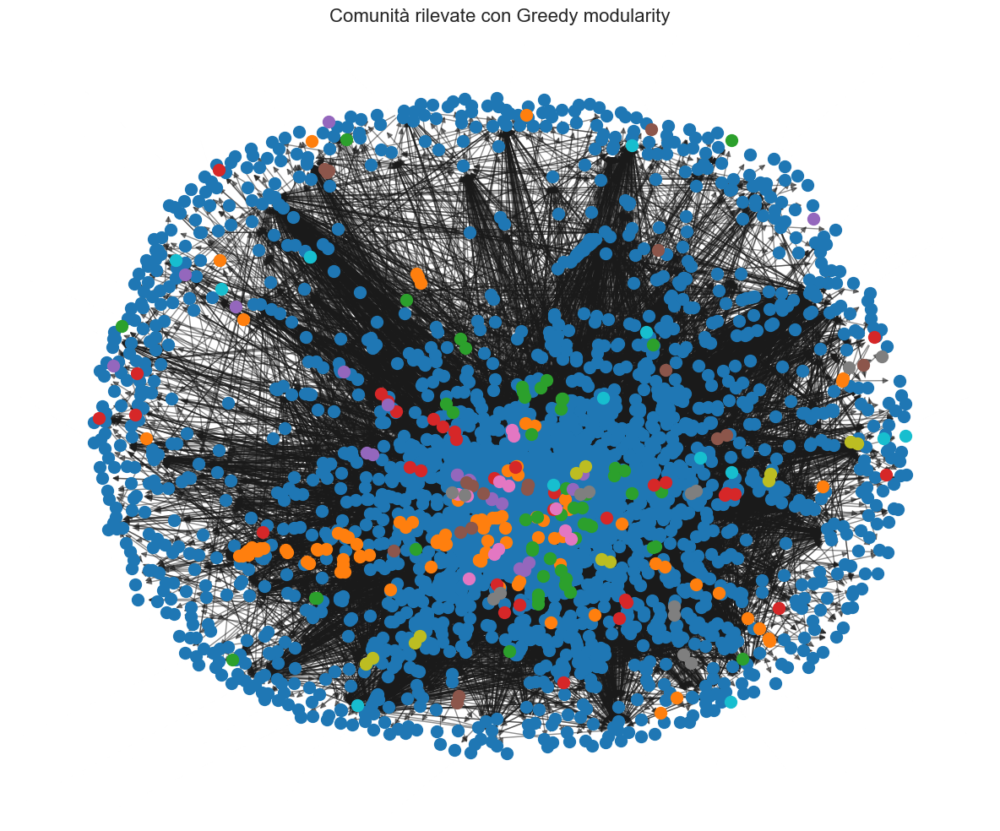

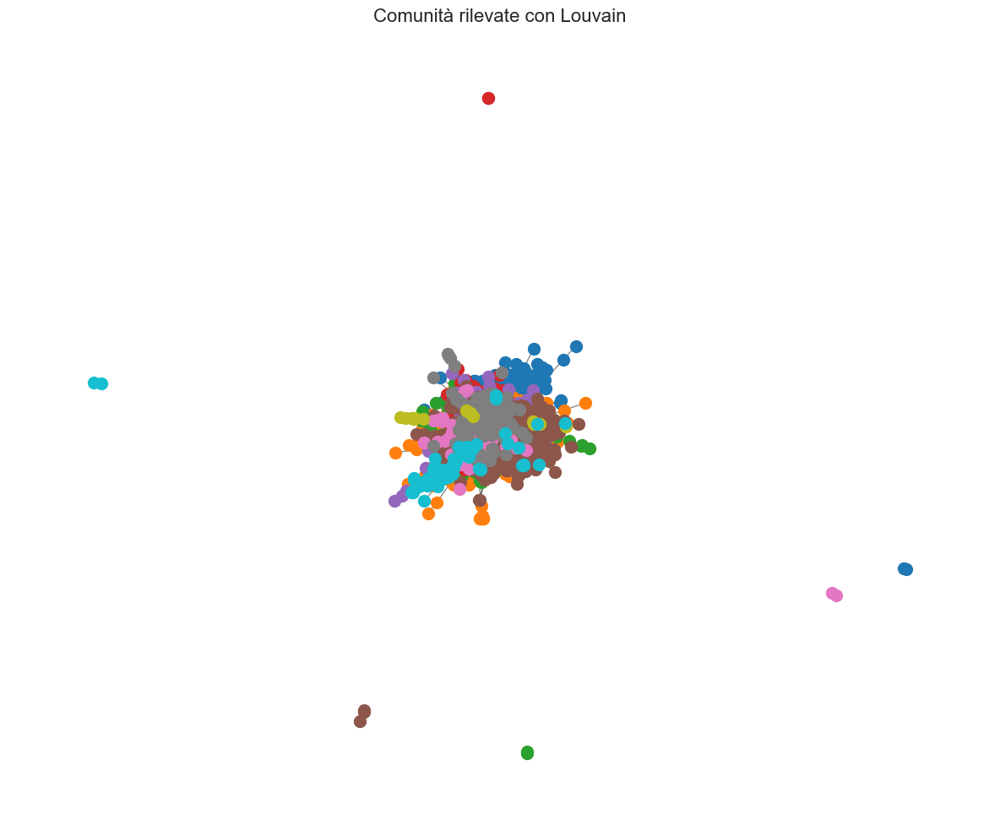

In [ ]:
# Funzione per visualizzare comunità sul grafo
def plot_communities(graph, partition, title="Comunità rilevate"):
    pos = nx.spring_layout(graph, seed=42)
    plt.figure(figsize=(12, 10))

    # Colori delle comunità
    communities = set(partition.values())
    color_map = plt.cm.get_cmap('tab10', len(communities))

    for community in communities:
        nodes = [node for node, comm in partition.items() if comm == community]
        nx.draw_networkx_nodes(graph, pos, nodelist=nodes, node_size=100, node_color=[color_map(community)])

    nx.draw_networkx_edges(graph, pos, alpha=0.5)
    plt.title(title, fontsize=16)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# Converte una lista di comunità in un dizionario nodo -> ID comunità
def convert_communities_to_partition(communities):
    partition = {}
    for community_id, community in enumerate(communities):
        for node in community:
            partition[node] = community_id
    return partition

# Converti communities_greedy
partition_greedy = convert_communities_to_partition(communities_greedy)

# Visualizza le comunità rilevate con Greedy modularity
plot_communities(G, partition_greedy, title="Comunità rilevate con Greedy modularity")
# Visualizza le comunità rilevate con Louvain
plot_communities(G_filtered, partition_louvain, title="Comunità rilevate con Louvain")

### Rilevamento e Visualizzazione dei Nodi comuni

In [ ]:
# Trova i nodi comuni nelle stesse comunità
common_communities = [
    node for node in partition_greedy if partition_greedy[node] == partition_louvain.get(node, -1)
]
print(f"Nodi comuni nelle stesse comunità: {len(common_communities)}")

# Trova i nodi classificati in comunità diverse
different_communities = [
    node for node in partition_greedy if partition_greedy[node] != partition_louvain.get(node, -1)
]
print(f"Nodi in comunità diverse: {len(different_communities)}")

Nodi comuni nelle stesse comunità: 272
Nodi in comunità diverse: 3511


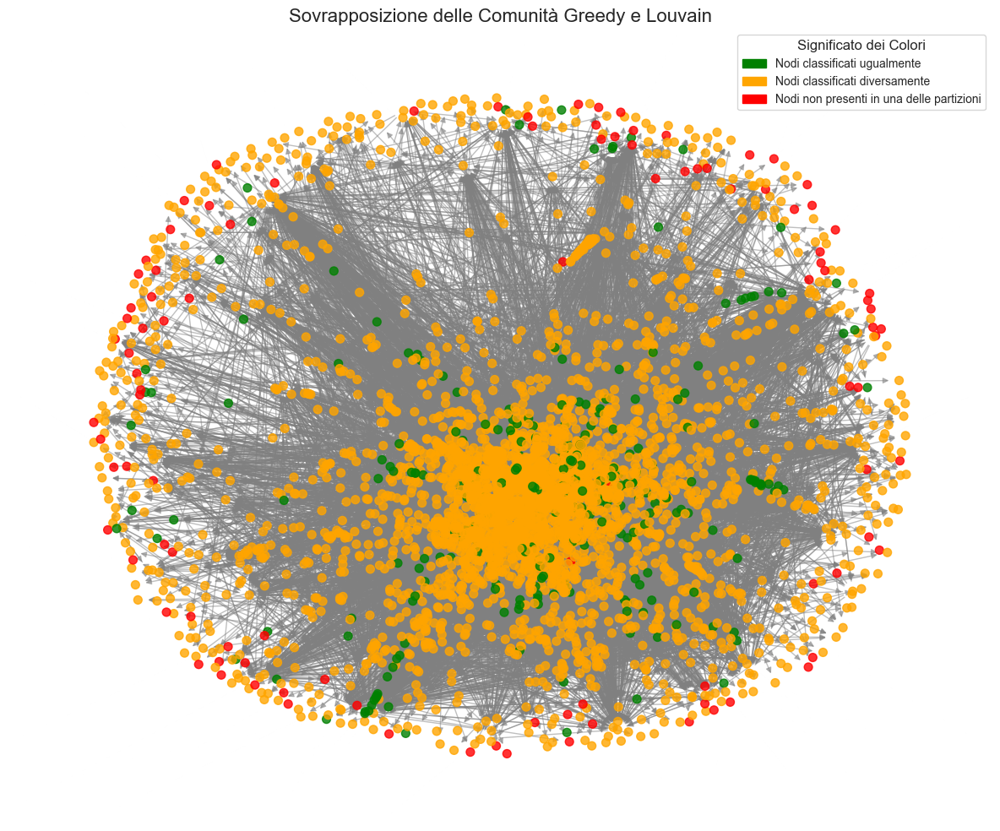

In [ ]:
# Funzione per plottare la sovrapposizione tra comunità con legenda
def plot_community_overlap(graph, partition1, partition2, title="Sovrapposizione delle Comunità"):
    pos = nx.spring_layout(graph, seed=42)
    plt.figure(figsize=(12, 10))

    # Assegna colori ai nodi
    color_map = {}
    for node in graph.nodes():
        if node in partition1 and node in partition2:
            if partition1[node] == partition2[node]:
                color_map[node] = "green"  # Nodi classificati ugualmente
            else:
                color_map[node] = "orange"  # Nodi classificati diversamente
        else:
            color_map[node] = "red"  # Nodi non presenti in una delle partizioni

    # Disegna i nodi
    nx.draw_networkx_nodes(
        graph, pos, nodelist=color_map.keys(),
        node_color=list(color_map.values()), node_size=50, alpha=0.8
    )
    # Disegna gli archi
    nx.draw_networkx_edges(graph, pos, edge_color="gray", alpha=0.5)

    # Aggiungi la legenda
    legend_patches = [
        mpatches.Patch(color="green", label="Nodi classificati ugualmente"),
        mpatches.Patch(color="orange", label="Nodi classificati diversamente"),
        mpatches.Patch(color="red", label="Nodi non presenti in una delle partizioni")
    ]
    plt.legend(handles=legend_patches, loc="upper right", fontsize=10, title="Significato dei Colori")

    plt.title(title, fontsize=16)
    plt.axis("off")
    plt.tight_layout()
    plt.show()

# Visualizza la sovrapposizione tra Greedy e Louvain
plot_community_overlap(G, partition_greedy, partition_louvain, title="Sovrapposizione delle Comunità Greedy e Louvain")

### Grafico delle dimensioni delle comunità

/var/folders/_y/cszqss6n29q_h8m3vt4b2lk80000gn/T/ipykernel_12987/992535869.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


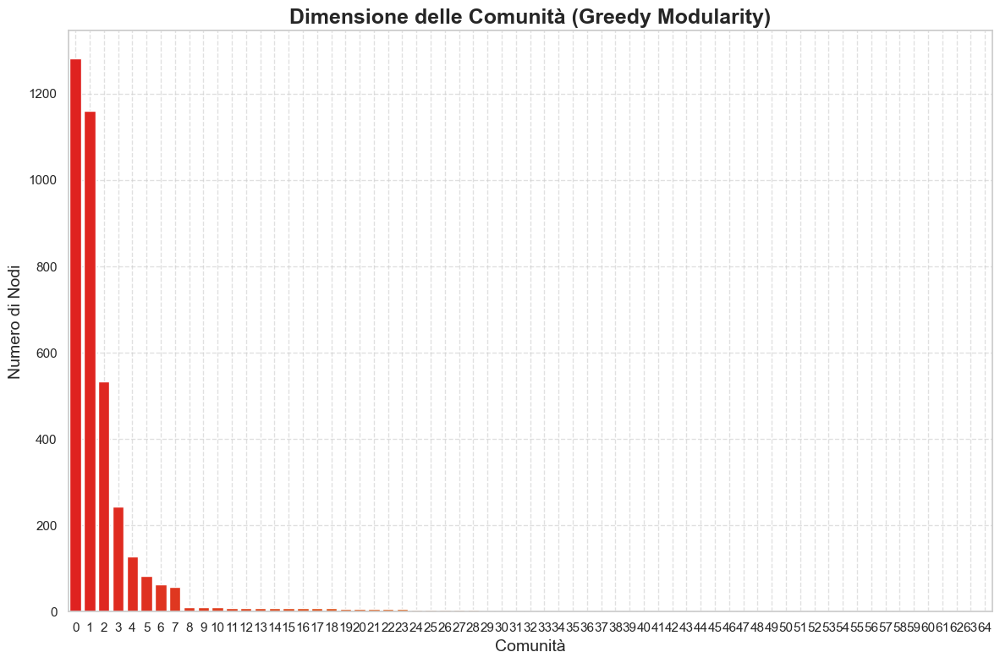

/var/folders/_y/cszqss6n29q_h8m3vt4b2lk80000gn/T/ipykernel_12987/992535869.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


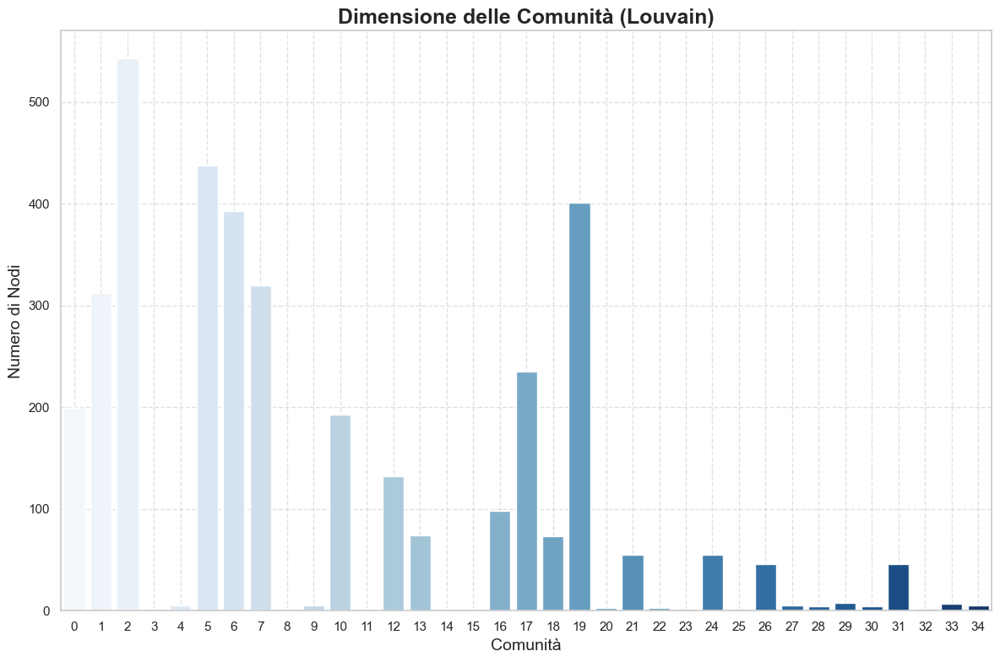

In [ ]:
# Calcolo delle dimensioni delle comunità Greedy
community_sizes_greedy = [len(community) for community in communities_greedy]

# Calcolo delle dimensioni delle comunità Louvain
community_sizes_louvain = [
    len([node for node, comm in partition_louvain.items() if comm == i])
    for i in set(partition_louvain.values())
]

# Grafico per Greedy
plt.figure(figsize=(12, 8))
sns.barplot(
    x=range(len(community_sizes_greedy)),
    y=community_sizes_greedy,
    palette="autumn"
)
plt.title("Dimensione delle Comunità (Greedy Modularity)", fontsize=18, fontweight="bold")
plt.xlabel("Comunità", fontsize=14)
plt.ylabel("Numero di Nodi", fontsize=14)
plt.grid(visible=True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# Grafico per Louvain
plt.figure(figsize=(12, 8))
sns.barplot(
    x=range(len(community_sizes_louvain)),
    y=community_sizes_louvain,
    palette="Blues"
)
plt.title("Dimensione delle Comunità (Louvain)", fontsize=18, fontweight="bold")
plt.xlabel("Comunità", fontsize=14)
plt.ylabel("Numero di Nodi", fontsize=14)
plt.grid(visible=True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

### Confronto tra algoritmi

In [ ]:
comparison = {
    "Algoritmo": ["Louvain", "Greedy Modularity"],
    "Numero di Comunità": [len(set(partition_louvain.values())), len(communities_greedy)],
    "Modularità": [modularity_louvain, modularity_greedy]
}

df_comparison = pd.DataFrame(comparison)
print(df_comparison)

           Algoritmo  Numero di Comunità  Modularità
0            Louvain                  35    0.533762
1  Greedy Modularity                  65    0.461788


## 5.5 Analisi delle Ego-Network

Le **ego-network** rappresentano le reti locali attorno a un nodo specifico ("ego") e includono tutti i nodi direttamente connessi ("alter") e le connessioni tra di essi. Questo tipo di analisi permette di:
- Studiare la **coesione locale** attorno a nodi chiave.
- Identificare nodi centrali che fungono da **hub** nella rete.
- Comprendere come un nodo influisce sulle connessioni vicine.


### Estrazione e Visualizzazione delle Ego-Network

Per illustrare l'analisi delle ego-network, è stata visualizzata l'ego-network del nodo con la **degree centrality totale più alta**. Questo esempio evidenzia:
- Il ruolo del nodo più connesso nella rete (considerando tutte le connessioni entranti e uscenti).
- La struttura locale attorno a questo nodo, mostrando i vicini diretti e le connessioni tra di essi.

La scelta del nodo top per la degree centrality, in merito all'analisi delle ego-network, ci è risultata la più corretta poiché il nodo 1 risulta il top per in, out e totale, suggerendo un possibile hub.
La visualizzazione utilizza un layout Spring e distingue l'**ego** (in rosso) dai suoi vicini (**alter**) (in azzurro). Inoltre, i nodi più connessi nella rete locale sono evidenziati per rendere visibili le dinamiche principali della rete attorno al nodo analizzato.

/var/folders/_y/cszqss6n29q_h8m3vt4b2lk80000gn/T/ipykernel_12987/3100608648.py:40: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


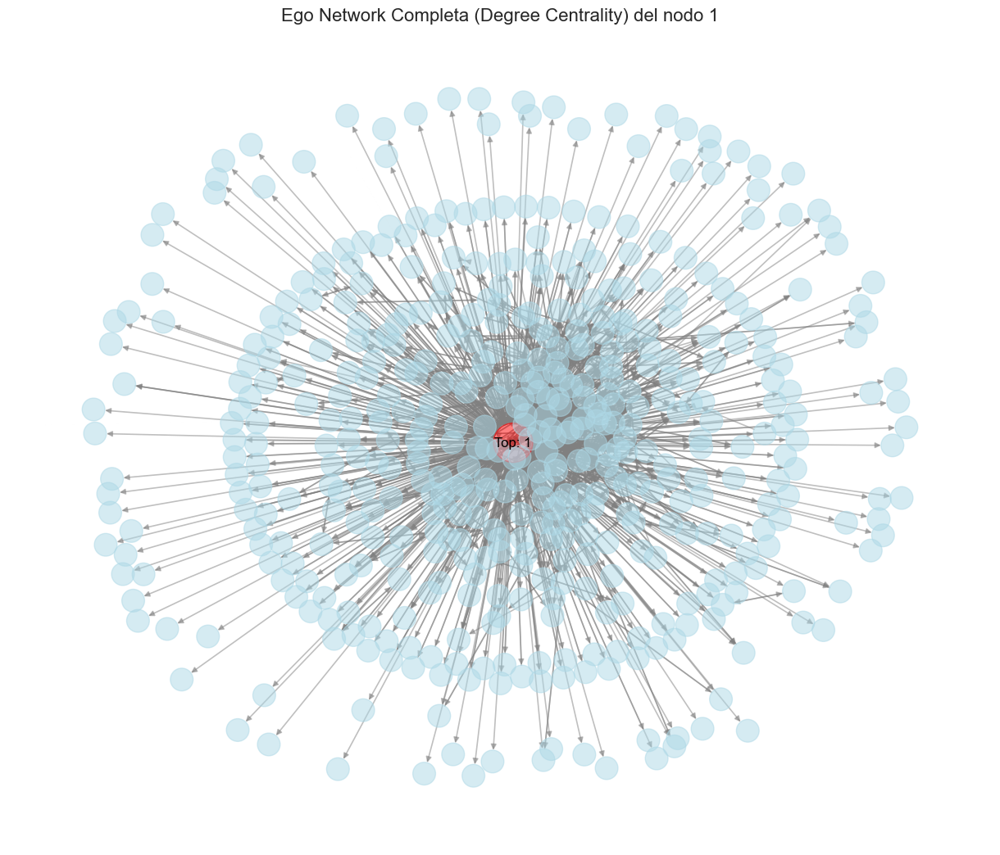

/var/folders/_y/cszqss6n29q_h8m3vt4b2lk80000gn/T/ipykernel_12987/3100608648.py:40: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


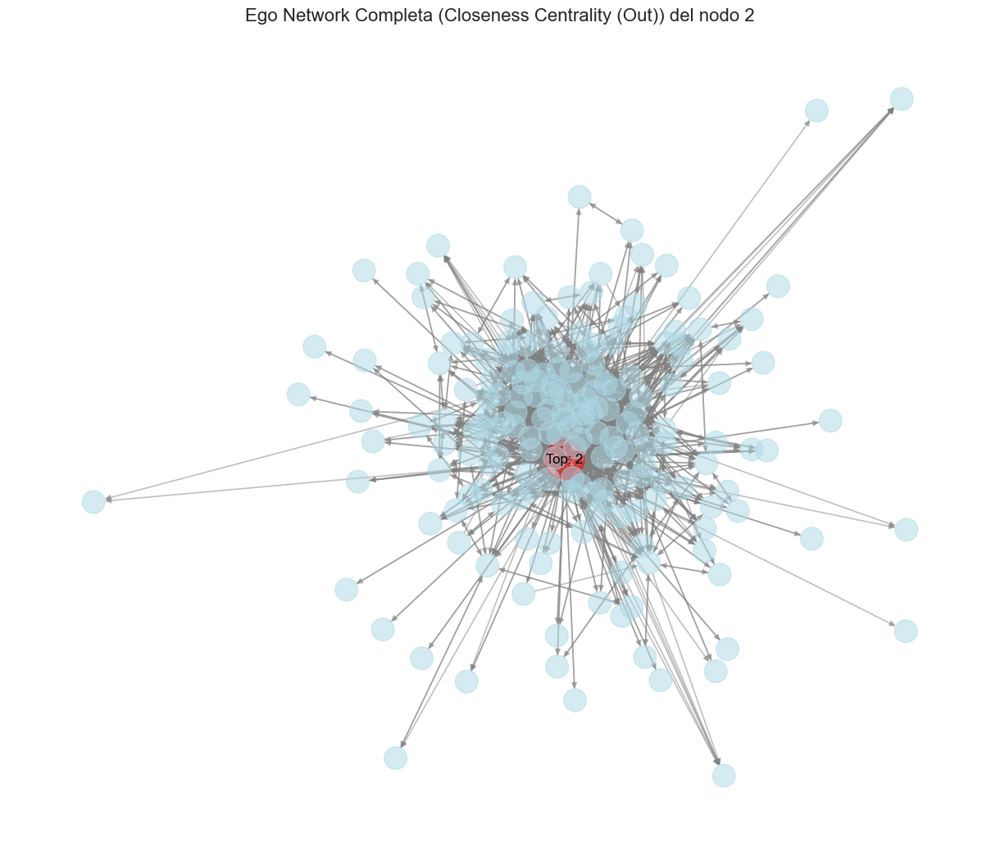

/var/folders/_y/cszqss6n29q_h8m3vt4b2lk80000gn/T/ipykernel_12987/3100608648.py:40: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


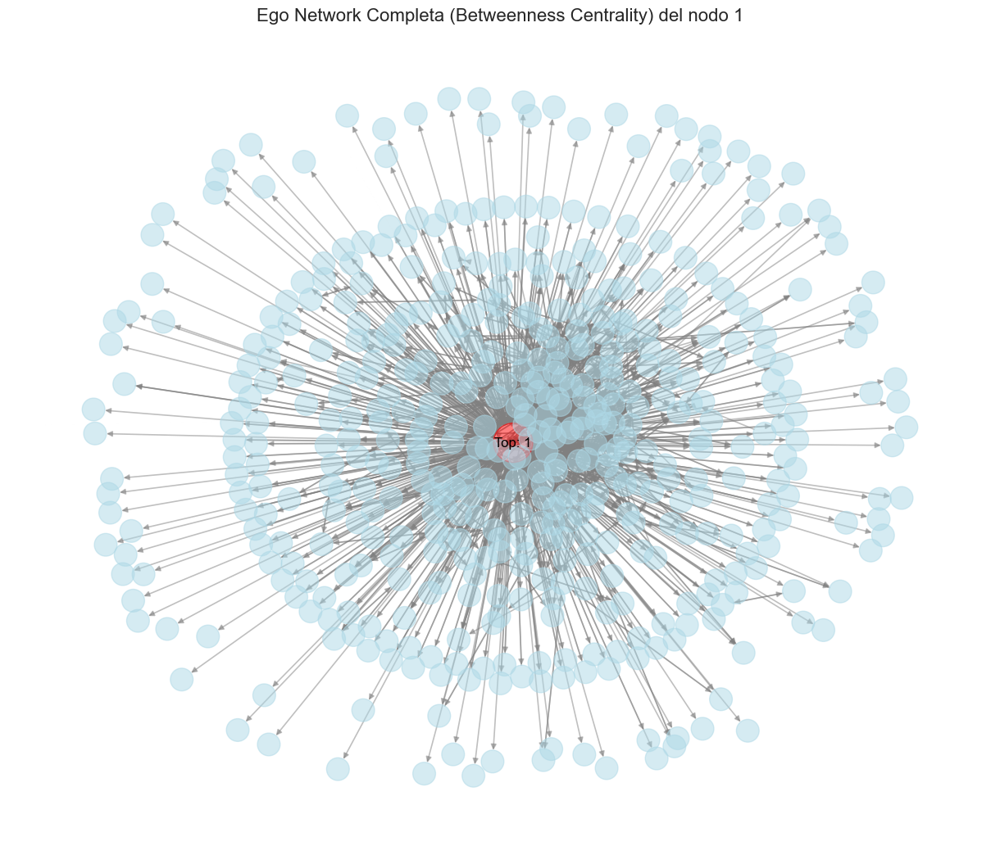

/var/folders/_y/cszqss6n29q_h8m3vt4b2lk80000gn/T/ipykernel_12987/3100608648.py:40: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


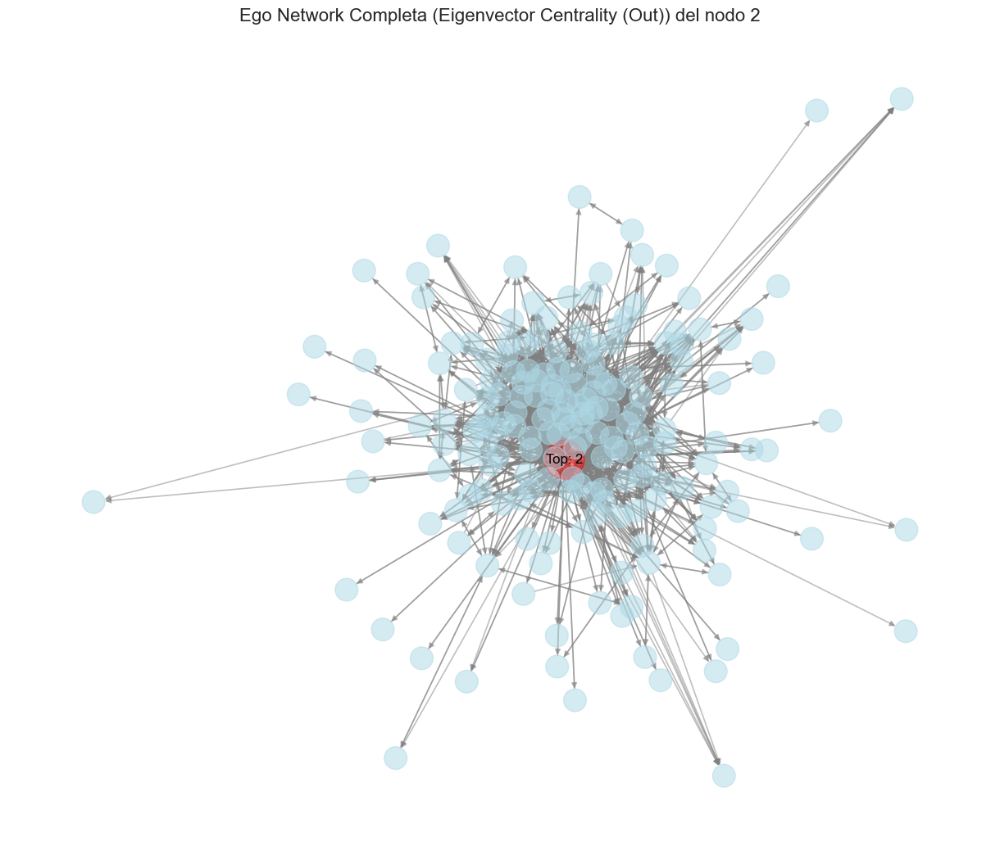

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx

def plot_ego_network_from_dict(graph, centrality_df, title="Ego Network Completa", ego_color='red', alters_color='lightblue', radius=1):
    # Trova il nodo con la centralità più alta
    top_node = centrality_df.loc[centrality_df[centrality_df.columns[1]].idxmax(), 'node']

    # Estrai la ego network completa
    ego_net = nx.ego_graph(graph, top_node, radius=radius)

    # Layout con spaziatura aumentata
    pos = nx.spring_layout(ego_net, seed=42, k=0.3)

    # Colori e dimensioni dei nodi
    node_colors = [ego_color if n == top_node else alters_color for n in ego_net.nodes()]
    node_sizes = [1200 if n == top_node else 400 for n in ego_net.nodes()]

    # Disegna la rete
    plt.figure(figsize=(12, 10))
    nx.draw(
        ego_net, pos,
        with_labels=False,  # Etichette disattivate per i nodi secondari
        node_color=node_colors,
        node_size=node_sizes,
        edge_color='gray',
        alpha=0.5,
        width=1.2  # Spessore degli archi
    )

    # Mostra l’etichetta solo per il nodo centrale
    nx.draw_networkx_labels(
        ego_net, pos,
        labels={top_node: f"Top: {top_node}"},
        font_size=12,
        font_color='black'
    )

    plt.title(f"{title} del nodo {top_node}", fontsize=16)
    plt.axis("off")
    plt.tight_layout()
    plt.show()

# Itera su ciascuna centralità nel dizionario per visualizzare l'ego network
for name, df in centralities_dict.items():
    plot_ego_network_from_dict(G_positive, df, title=f"Ego Network Completa ({name})")

### Metriche sulle Ego-Network - confronto

In [ ]:
import networkx as nx
import pandas as pd

# Funzione per calcolare metriche di una ego network
def ego_metrics(graph, node, radius=1):
    # Estrai l'ego network
    ego_net = nx.ego_graph(graph, node, radius=radius)
    metrics = {
        "Nodo": node,
        "Raggio": radius,
        "Numero di Nodi": ego_net.number_of_nodes(),
        "Numero di Archi": ego_net.number_of_edges(),
        "Densità": nx.density(ego_net),
        "Clustering Medio": nx.average_clustering(ego_net),
        "Grado Medio": sum(dict(ego_net.degree()).values()) / ego_net.number_of_nodes()
    }
    return metrics

# Funzione per trasformare le metriche in un DataFrame
def metrics_to_dataframe(metrics_list):
    return pd.DataFrame(metrics_list)

# Lista per memorizzare le metriche di ciascun nodo top
metrics_list = []

# Itera su ciascuna centralità e calcola le metriche della ego network del nodo top
for name, df in centralities_dict.items():
    # Trova il nodo con la centralità più alta
    top_node = df.loc[df[df.columns[1]].idxmax(), 'node']

    # Calcola le metriche per il nodo top
    metrics = ego_metrics(G_positive, top_node, radius=1)
    metrics["Centralità"] = name  # Aggiungi il tipo di centralità come informazione
    metrics_list.append(metrics)

# Trasforma le metriche in un DataFrame e visualizzale
df_metrics = metrics_to_dataframe(metrics_list)
print(df_metrics)

   Nodo  Raggio  Numero di Nodi  Numero di Archi   Densità  Clustering Medio  \
0     1       1             487             1963  0.008294          0.325218   
1     2       1             187             2107  0.060577          0.474297   
2     1       1             487             1963  0.008294          0.325218   
3     2       1             187             2107  0.060577          0.474297   

   Grado Medio                    Centralità  
0     8.061602             Degree Centrality  
1    22.534759    Closeness Centrality (Out)  
2     8.061602        Betweenness Centrality  
3    22.534759  Eigenvector Centrality (Out)  


#### Analisi delle Metriche dell'Ego-Network

Il nodo $1$, individuato sia per la degree centrality che per la betweenness centrality, ha un’ego-network di $487$ nodi e $1963$ archi. Nonostante il numero elevato di connessioni, la densità è relativamente bassa, pari a $0,0083$, indicando che, pur essendo il nodo molto connesso, le relazioni tra i suoi vicini sono limitate. Questo aspetto viene confermato dal clustering medio di $0,325$, il quale suggerisce una coesione locale moderata: non tutti i nodi collegati all'ego sono tra loro strettamente connessi. Il grado medio pari a $8,06$ sottolinea una rete piuttosto ampia, ma dispersa, dove le connessioni sono distribuite in maniera non uniforme.

Al contrario, il nodo $2$, selezionato per la closeness centrality e la eigenvector centrality, presenta un’ego-network molto più compatta e coesa. Con soli $187$ nodi, questo sottografo possiede però $2107$ archi, risultando in una densità molto più elevata ($0,0606$) rispetto a quella del nodo $1$. Il clustering medio pari a $0,474$ evidenzia una forte interconnessione tra i vicini del nodo, suggerendo che molti utenti con cui interagisce sono anche direttamente collegati tra loro. Il grado medio di $22,53$ indica che le connessioni sono più concentrate e frequenti, rendendo il nodo $2$ una figura strategica per la diffusione delle valutazioni.

### Espansione delle Ego-Network

L'espansione del raggio di un'ego-network consente di includere non solo i vicini diretti del nodo centrale ("ego"), ma anche i vicini dei vicini (e così via, in base al valore del raggio).


Metriche per l'Ego Network Espansa (Nodo: 1):
Nodo: 1
Raggio: 2
Numero di Nodi: 1845
Numero di Archi: 16422
Densità: 0.004826905102022821
Clustering Medio: 0.20890983049951856
Grado Medio: 17.801626016260162
----------------------------------------


/var/folders/_y/cszqss6n29q_h8m3vt4b2lk80000gn/T/ipykernel_12987/3242999095.py:63: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


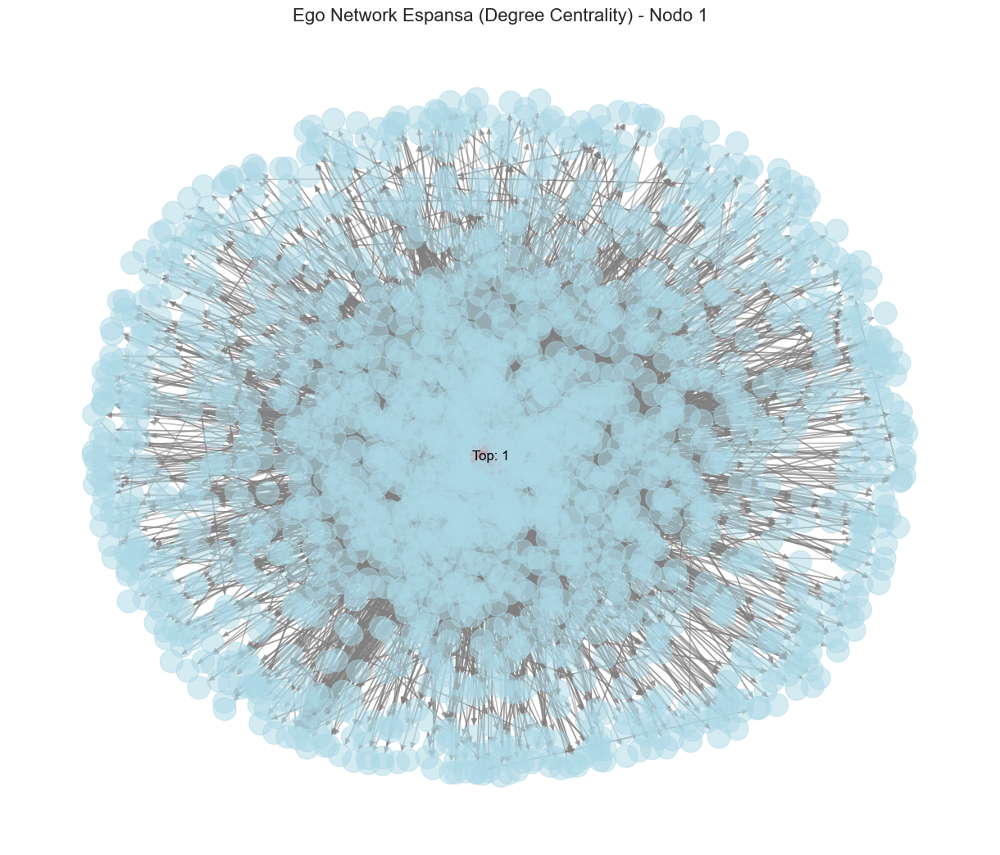

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
import pandas as pd

# Funzione per calcolare metriche di una ego network
def ego_metrics(graph, node, radius=1):
    ego_net = nx.ego_graph(graph, node, radius=radius)
    metrics = {
        "Nodo": node,
        "Raggio": radius,
        "Numero di Nodi": ego_net.number_of_nodes(),
        "Numero di Archi": ego_net.number_of_edges(),
        "Densità": nx.density(ego_net),
        "Clustering Medio": nx.average_clustering(ego_net),
        "Grado Medio": sum(dict(ego_net.degree()).values()) / ego_net.number_of_nodes()
    }
    return metrics

# Funzione per visualizzare l'ego network
def plot_ego_network_for_degree(graph, centrality_df, title="Ego Network Espansa (Degree Centrality)", ego_color='red', alters_color='lightblue', radius=2):
    # Trova il nodo con la centralità più alta
    top_node = centrality_df.loc[centrality_df[centrality_df.columns[1]].idxmax(), 'node']

    # Calcola e stampa le metriche per il nodo top
    metrics = ego_metrics(graph, top_node, radius)
    print(f"Metriche per l'Ego Network Espansa (Nodo: {top_node}):")
    for key, value in metrics.items():
        print(f"{key}: {value}")
    print("-" * 40)

    # Estrai la ego network espansa
    ego_net = nx.ego_graph(graph, top_node, radius=radius)

    # Layout con spaziatura aumentata
    pos = nx.spring_layout(ego_net, seed=42, k=0.3)

    # Colori e dimensioni dei nodi
    node_colors = [ego_color if n == top_node else alters_color for n in ego_net.nodes()]
    node_sizes = [1200 if n == top_node else 400 for n in ego_net.nodes()]

    # Disegna la rete
    plt.figure(figsize=(12, 10))
    nx.draw(
        ego_net, pos,
        with_labels=False,  # Etichette disattivate
        node_color=node_colors,
        node_size=node_sizes,
        edge_color='gray',
        alpha=0.5,
        width=1.2  # Spessore degli archi
    )

    # Mostra l’etichetta solo per il nodo centrale
    nx.draw_networkx_labels(
        ego_net, pos,
        labels={top_node: f"Top: {top_node}"},
        font_size=12,
        font_color='black'
    )

    plt.title(f"{title} - Nodo {top_node}", fontsize=16)
    plt.axis("off")
    plt.tight_layout()
    plt.show()

# Esegui la visualizzazione e il calcolo delle metriche per la Degree Centrality
plot_ego_network_for_degree(G_positive, top10_centralities_dict['Degree Centrality'])